In [1]:
import os
import random
import numpy as np
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Dense, Reshape, Conv2DTranspose, BatchNormalization, Conv2D, LeakyReLU, Flatten, Dropout
from keras.optimizers import Adam
from tensorflow.keras.datasets import mnist
import matplotlib.pyplot as plt

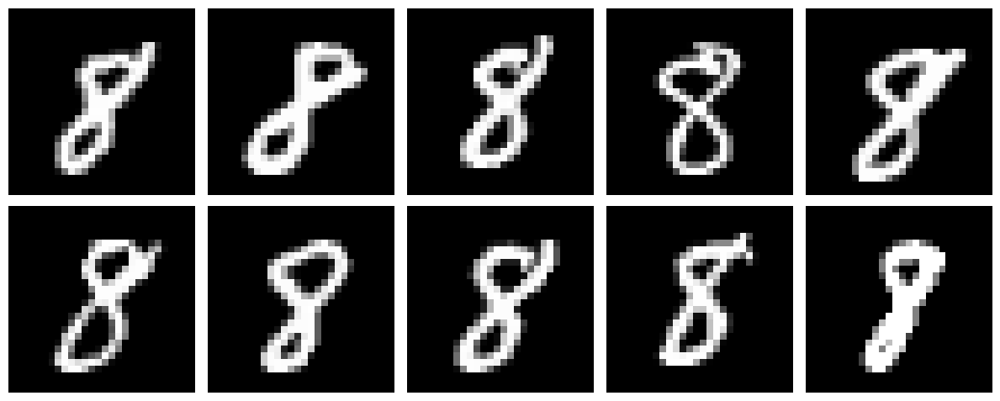

In [2]:
# Cargamos el dataset
(x_train, y_train), (x_test, y_test) = mnist.load_data()

# Buscamos los numeros 8
indices = np.where(y_train == 8)[0]

# Mostrar los primeros 10 numeros 8
plt.figure(figsize=(12, 5))
for i in range(10):
    idx = indices[i]
    plt.subplot(2, 5, i + 1)
    plt.imshow(x_train[idx], cmap='gray')
    plt.axis('off')

plt.tight_layout()
plt.show()

In [3]:
# Semillas para la reproducibilidad
os.environ['TF_DETERMINISTIC_OPS'] = '1'
tf.random.set_seed(42)
np.random.seed(42)
random.seed(42)

In [4]:
# Seleccionamos algunos parámetros para los modeles
TAM_ENTRADA = 100  # Tamaño de la entrada para el generador
TAM_LOTE = 64
ERROR = 'binary_crossentropy'  # Función de pérdida para los modelos
LEAKY_SLOPE = 0.2  # Slope para la activación LeakyReLU
opt_d = Adam(learning_rate=0.0001, beta_1=0.5)  # Optimizador Adam para el discriminador
opt_gan = Adam(learning_rate=0.0002, beta_1=0.5)  # Optimizador Adam para la GAN y el generador

In [5]:
# El modelo generador a partir de ruido aleatorio generará imágenes
# La capa de salida tanh genera una salida entre -1 y 1, por lo tanto las imágenes deberán tener este formato
# Las capas Conv2DTranspose hacen lo contrario que una capa Conv2D, en vez de encontrar características en una imagen van dibujando características en una imagen
def crear_generador():
    modelo = Sequential()
    modelo.add(Dense(7 * 7 * 128, use_bias=False, input_shape=(TAM_ENTRADA,))) # Se crea un vector con la entrada de ruido de tamaño 7x7x128
    modelo.add(BatchNormalization(momentum=0.3))
    modelo.add(LeakyReLU(alpha=LEAKY_SLOPE))
    modelo.add(Reshape((7, 7, 128))) # Se convierte el vector a tamaño (7,7,128)
    modelo.add(Conv2DTranspose(128, kernel_size=4, strides=2, padding='same', use_bias=False)) # Se realiza un upsampling y nos quedamos con un vector de 14x14 de 128 canales
    modelo.add(BatchNormalization(momentum=0.3))
    modelo.add(LeakyReLU(alpha=LEAKY_SLOPE))
    modelo.add(Conv2DTranspose(64, kernel_size=4, strides=2, padding='same', use_bias=False)) # Se vuelve al realizar un upsampling y nos quedamos con un vector de 28x28 de 64 canales
    modelo.add(BatchNormalization(momentum=0.3))
    modelo.add(LeakyReLU(alpha=LEAKY_SLOPE))
    modelo.add(Conv2DTranspose(1, kernel_size=7, strides=1, padding='same', use_bias=False, activation='tanh')) # Se reducen todos los canales a 1, quedando una imagen de 28x28
    return modelo

In [6]:
# El discriminador busca las características de una imagen y las clasifica
def crear_discriminador():
    modelo = Sequential()
    modelo.add(Conv2D(64, kernel_size=4, strides=2, padding='same', input_shape=(28, 28, 1), use_bias=False))
    modelo.add(LeakyReLU(alpha=LEAKY_SLOPE))
    modelo.add(Dropout(0.3))
    modelo.add(Conv2D(128, kernel_size=4, strides=2, padding='same', use_bias=False))
    modelo.add(BatchNormalization(momentum=0.3))
    modelo.add(LeakyReLU(alpha=LEAKY_SLOPE))
    modelo.add(Dropout(0.3))
    modelo.add(Flatten())
    modelo.add(Dense(1, activation='sigmoid', use_bias=False))
    modelo.compile(optimizer=opt_d, loss=ERROR)
    return modelo


In [7]:
def crear_GAN(generador, discriminador):
    modelo = Sequential()
    # Congelamos el discriminador durante el entrenamiento del generador
    discriminador.trainable = False
    modelo.add(generador)
    modelo.add(discriminador)
    modelo.compile(optimizer=opt_gan, loss=ERROR)
    return modelo

In [8]:
# Función para cargar los datos
def cargar_datos():
    print('Cargando numeros 8 ...', end="", flush=True)

    # Cargamos los datos de MNIST
    (x_train, y_train), _ = tf.keras.datasets.mnist.load_data()

    # Filtramos las imágenes del numero 8
    idx = np.where(y_train == 8)[0]
    x_num = x_train[idx]

    # Expandimos dimensiones para que tenga forma (28, 28, 1)
    x_num = np.expand_dims(x_num, axis=-1)

    # Normalizamos las imágenes entre [-1, 1]
    x_num = (x_num.astype(np.float32) - 127.5) / 127.5
    print('¡Listo!')
    return x_num

In [9]:
# Función para ir mostrando los resultados durante el entrenamiento
def graficar_imagenes_generadas(epoch, generador, tam_lote=16):
    # Generamos un lote de ruido aleatorio para generar las imágenes
    ruido = np.random.normal(0, 1, (tam_lote, TAM_ENTRADA))
    # Generamos las imágenes a partir del ruido usando el generador
    imagenes_generadas = generador.predict(ruido)
    # Desnormalizamos las imágenes generadas para que estén en el rango [0, 1]
    imagenes_generadas = (imagenes_generadas + 1) / 2


    fig, axs = plt.subplots(4, 4, figsize=(4, 4), sharex=True, sharey=True)
    axs = axs.ravel()
    for i in range(tam_lote):
        axs[i].imshow(imagenes_generadas[i, :, :, 0], cmap='gray')
        axs[i].axis('off')
    plt.suptitle(f'Imágenes generadas - Epoch {epoch}')
    plt.tight_layout()
    plt.show()

In [10]:
# Función para realizar el entrenamiento
def entrenar_gan(N_ITS):
    # Carganos los datos y creamos los modelos
    x_train = cargar_datos()
    generador = crear_generador()
    discriminador = crear_discriminador()
    gan = crear_GAN(generador, discriminador)

    # Comienza el entrenamiento de N_ITS epocs
    for i in range(1, N_ITS + 1):

        # Generamos un lote de ruido aleatorio para generar imágenes con el generador
        ruido = np.random.normal(0, 1, (TAM_LOTE, TAM_ENTRADA))
        imagenes_falsas = generador.predict(ruido, verbose=0)

        # Seleccionamos imágenes reales del conjunto de datos
        idx = np.random.randint(0, x_train.shape[0], TAM_LOTE)
        imagenes_reales = x_train[idx]

        # Etiquetamos las imágenes reales (1) y falsas (0)
        reales = np.ones(TAM_LOTE) * 0.9
        falsas = np.zeros(TAM_LOTE)

        # Entrenamos el discriminador con imágenes reales y falsas

        discriminador.trainable = True

        d_loss_real = discriminador.train_on_batch(imagenes_reales, reales)
        d_loss_fake = discriminador.train_on_batch(imagenes_falsas, falsas)

        # Entrenamos el generador

        discriminador.trainable = False

        g_loss = gan.train_on_batch(ruido, np.ones(TAM_LOTE))

        # Mostramos las métricas para cada época
        print(f"Epoch {i}:  D_real: {d_loss_real:.4f}, D_fake: {d_loss_fake:.4f}, G: {g_loss:.4f}")

        # Vamos mostrando las imágenes generadas
        if i == 1 or i % 10 == 0:
            graficar_imagenes_generadas(i, generador)

Cargando numeros 8 ...¡Listo!


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1:  D_real: 0.6080, D_fake: 0.6640, G: 0.6352
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


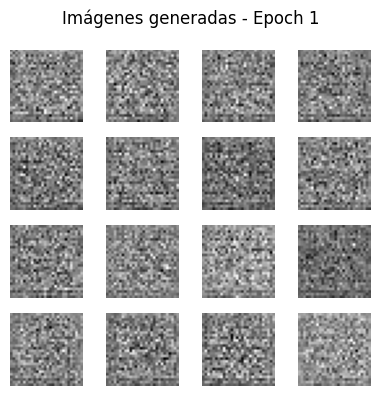

Epoch 2:  D_real: 0.5794, D_fake: 0.6665, G: 0.5219
Epoch 3:  D_real: 0.6114, D_fake: 0.6891, G: 0.4549
Epoch 4:  D_real: 0.6448, D_fake: 0.7137, G: 0.4377
Epoch 5:  D_real: 0.6784, D_fake: 0.7223, G: 0.4819
Epoch 6:  D_real: 0.6907, D_fake: 0.7011, G: 0.5155
Epoch 7:  D_real: 0.6776, D_fake: 0.6845, G: 0.5571
Epoch 8:  D_real: 0.6686, D_fake: 0.6761, G: 0.6003
Epoch 9:  D_real: 0.6591, D_fake: 0.6508, G: 0.6327
Epoch 10:  D_real: 0.6389, D_fake: 0.6302, G: 0.6872
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


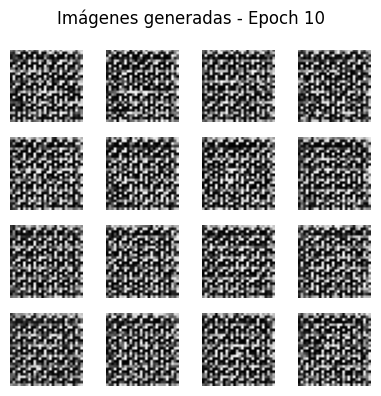

Epoch 11:  D_real: 0.6193, D_fake: 0.6128, G: 0.7443
Epoch 12:  D_real: 0.6023, D_fake: 0.5924, G: 0.7865
Epoch 13:  D_real: 0.5848, D_fake: 0.5757, G: 0.8169
Epoch 14:  D_real: 0.5691, D_fake: 0.5567, G: 0.8587
Epoch 15:  D_real: 0.5508, D_fake: 0.5456, G: 0.8857
Epoch 16:  D_real: 0.5429, D_fake: 0.5385, G: 0.9166
Epoch 17:  D_real: 0.5345, D_fake: 0.5272, G: 0.9606
Epoch 18:  D_real: 0.5234, D_fake: 0.5147, G: 1.0028
Epoch 19:  D_real: 0.5131, D_fake: 0.5039, G: 1.0471
Epoch 20:  D_real: 0.5018, D_fake: 0.4948, G: 1.0819
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


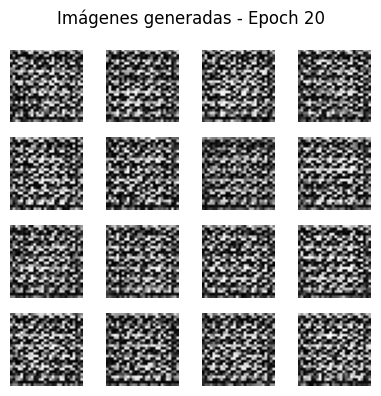

Epoch 21:  D_real: 0.4921, D_fake: 0.4863, G: 1.1111
Epoch 22:  D_real: 0.4844, D_fake: 0.4802, G: 1.1361
Epoch 23:  D_real: 0.4787, D_fake: 0.4735, G: 1.1646
Epoch 24:  D_real: 0.4723, D_fake: 0.4674, G: 1.1815
Epoch 25:  D_real: 0.4663, D_fake: 0.4618, G: 1.2031
Epoch 26:  D_real: 0.4608, D_fake: 0.4563, G: 1.2241
Epoch 27:  D_real: 0.4555, D_fake: 0.4516, G: 1.2478
Epoch 28:  D_real: 0.4516, D_fake: 0.4478, G: 1.2644
Epoch 29:  D_real: 0.4473, D_fake: 0.4431, G: 1.2780
Epoch 30:  D_real: 0.4433, D_fake: 0.4389, G: 1.3009
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


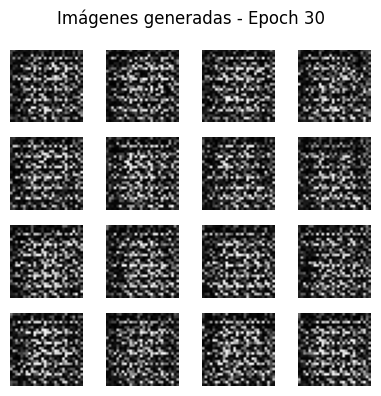

Epoch 31:  D_real: 0.4391, D_fake: 0.4357, G: 1.3205
Epoch 32:  D_real: 0.4357, D_fake: 0.4324, G: 1.3388
Epoch 33:  D_real: 0.4323, D_fake: 0.4297, G: 1.3566
Epoch 34:  D_real: 0.4304, D_fake: 0.4274, G: 1.3743
Epoch 35:  D_real: 0.4280, D_fake: 0.4254, G: 1.3884
Epoch 36:  D_real: 0.4259, D_fake: 0.4240, G: 1.4079
Epoch 37:  D_real: 0.4241, D_fake: 0.4216, G: 1.4225
Epoch 38:  D_real: 0.4226, D_fake: 0.4200, G: 1.4346
Epoch 39:  D_real: 0.4211, D_fake: 0.4190, G: 1.4454
Epoch 40:  D_real: 0.4197, D_fake: 0.4177, G: 1.4603
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


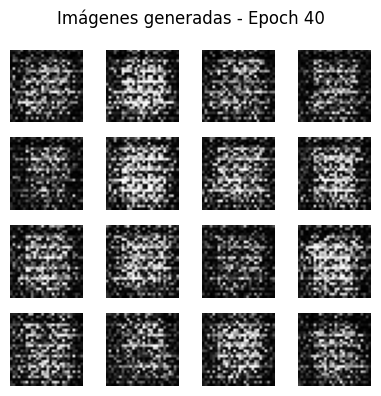

Epoch 41:  D_real: 0.4181, D_fake: 0.4156, G: 1.4698
Epoch 42:  D_real: 0.4170, D_fake: 0.4147, G: 1.4815
Epoch 43:  D_real: 0.4151, D_fake: 0.4123, G: 1.4942
Epoch 44:  D_real: 0.4128, D_fake: 0.4101, G: 1.5115
Epoch 45:  D_real: 0.4101, D_fake: 0.4075, G: 1.5300
Epoch 46:  D_real: 0.4082, D_fake: 0.4074, G: 1.5320
Epoch 47:  D_real: 0.4083, D_fake: 0.4075, G: 1.5373
Epoch 48:  D_real: 0.4082, D_fake: 0.4078, G: 1.5445
Epoch 49:  D_real: 0.4091, D_fake: 0.4073, G: 1.5511
Epoch 50:  D_real: 0.4094, D_fake: 0.4085, G: 1.5563
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


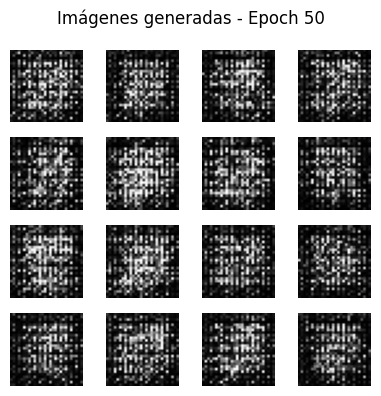

Epoch 51:  D_real: 0.4093, D_fake: 0.4140, G: 1.5494
Epoch 52:  D_real: 0.4154, D_fake: 0.4170, G: 1.5461
Epoch 53:  D_real: 0.4209, D_fake: 0.4220, G: 1.5435
Epoch 54:  D_real: 0.4241, D_fake: 0.4249, G: 1.5446
Epoch 55:  D_real: 0.4282, D_fake: 0.4290, G: 1.5467
Epoch 56:  D_real: 0.4316, D_fake: 0.4313, G: 1.5510
Epoch 57:  D_real: 0.4341, D_fake: 0.4337, G: 1.5551
Epoch 58:  D_real: 0.4361, D_fake: 0.4353, G: 1.5578
Epoch 59:  D_real: 0.4375, D_fake: 0.4363, G: 1.5624
Epoch 60:  D_real: 0.4391, D_fake: 0.4383, G: 1.5669
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


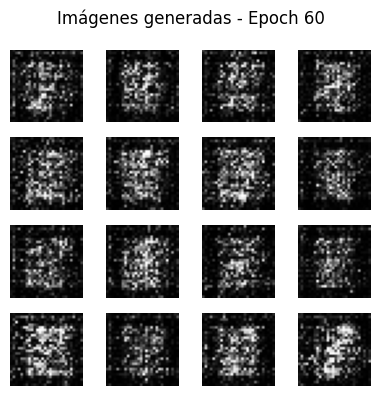

Epoch 61:  D_real: 0.4399, D_fake: 0.4392, G: 1.5713
Epoch 62:  D_real: 0.4420, D_fake: 0.4426, G: 1.5717
Epoch 63:  D_real: 0.4441, D_fake: 0.4438, G: 1.5717
Epoch 64:  D_real: 0.4452, D_fake: 0.4448, G: 1.5746
Epoch 65:  D_real: 0.4476, D_fake: 0.4463, G: 1.5747
Epoch 66:  D_real: 0.4474, D_fake: 0.4460, G: 1.5729
Epoch 67:  D_real: 0.4482, D_fake: 0.4484, G: 1.5714
Epoch 68:  D_real: 0.4489, D_fake: 0.4489, G: 1.5723
Epoch 69:  D_real: 0.4525, D_fake: 0.4521, G: 1.5731
Epoch 70:  D_real: 0.4546, D_fake: 0.4547, G: 1.5723
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


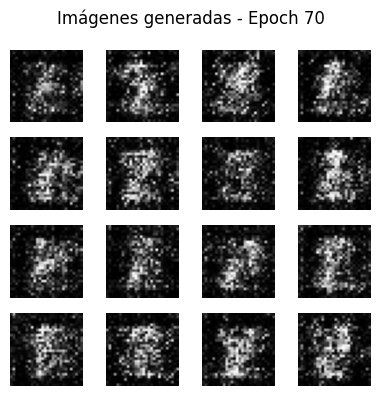

Epoch 71:  D_real: 0.4564, D_fake: 0.4560, G: 1.5718
Epoch 72:  D_real: 0.4584, D_fake: 0.4584, G: 1.5705
Epoch 73:  D_real: 0.4604, D_fake: 0.4617, G: 1.5700
Epoch 74:  D_real: 0.4646, D_fake: 0.4650, G: 1.5688
Epoch 75:  D_real: 0.4687, D_fake: 0.4678, G: 1.5670
Epoch 76:  D_real: 0.4700, D_fake: 0.4692, G: 1.5628
Epoch 77:  D_real: 0.4706, D_fake: 0.4738, G: 1.5572
Epoch 78:  D_real: 0.4764, D_fake: 0.4781, G: 1.5541
Epoch 79:  D_real: 0.4802, D_fake: 0.4798, G: 1.5523
Epoch 80:  D_real: 0.4826, D_fake: 0.4827, G: 1.5490
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


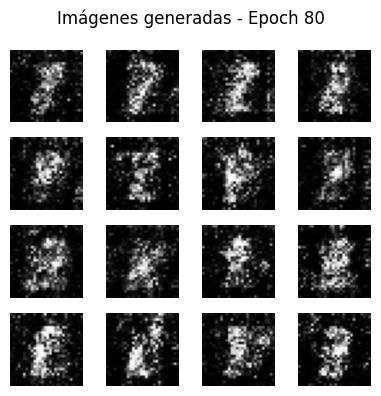

Epoch 81:  D_real: 0.4856, D_fake: 0.4863, G: 1.5463
Epoch 82:  D_real: 0.4903, D_fake: 0.4914, G: 1.5417
Epoch 83:  D_real: 0.4941, D_fake: 0.4954, G: 1.5372
Epoch 84:  D_real: 0.4978, D_fake: 0.4991, G: 1.5352
Epoch 85:  D_real: 0.5029, D_fake: 0.5034, G: 1.5335
Epoch 86:  D_real: 0.5063, D_fake: 0.5061, G: 1.5316
Epoch 87:  D_real: 0.5089, D_fake: 0.5092, G: 1.5297
Epoch 88:  D_real: 0.5113, D_fake: 0.5121, G: 1.5279
Epoch 89:  D_real: 0.5136, D_fake: 0.5145, G: 1.5253
Epoch 90:  D_real: 0.5178, D_fake: 0.5176, G: 1.5236
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


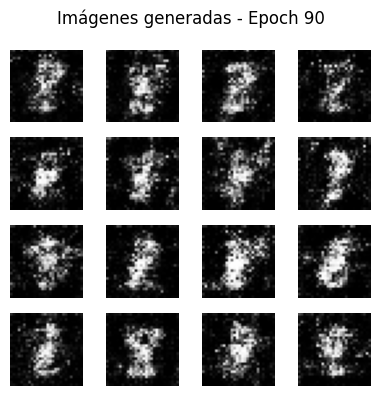

Epoch 91:  D_real: 0.5206, D_fake: 0.5198, G: 1.5214
Epoch 92:  D_real: 0.5224, D_fake: 0.5221, G: 1.5195
Epoch 93:  D_real: 0.5246, D_fake: 0.5253, G: 1.5163
Epoch 94:  D_real: 0.5273, D_fake: 0.5279, G: 1.5134
Epoch 95:  D_real: 0.5294, D_fake: 0.5295, G: 1.5109
Epoch 96:  D_real: 0.5321, D_fake: 0.5322, G: 1.5099
Epoch 97:  D_real: 0.5335, D_fake: 0.5344, G: 1.5077
Epoch 98:  D_real: 0.5369, D_fake: 0.5362, G: 1.5079
Epoch 99:  D_real: 0.5377, D_fake: 0.5376, G: 1.5076
Epoch 100:  D_real: 0.5389, D_fake: 0.5381, G: 1.5075
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


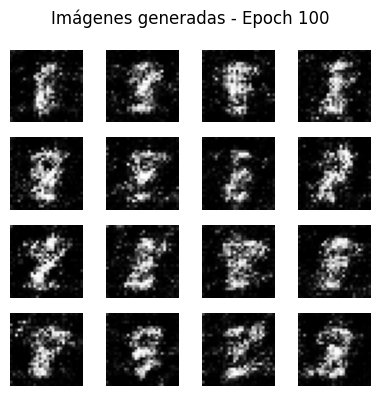

Epoch 101:  D_real: 0.5398, D_fake: 0.5394, G: 1.5074
Epoch 102:  D_real: 0.5410, D_fake: 0.5409, G: 1.5053
Epoch 103:  D_real: 0.5420, D_fake: 0.5417, G: 1.5044
Epoch 104:  D_real: 0.5437, D_fake: 0.5438, G: 1.5017
Epoch 105:  D_real: 0.5451, D_fake: 0.5453, G: 1.4998
Epoch 106:  D_real: 0.5474, D_fake: 0.5471, G: 1.4972
Epoch 107:  D_real: 0.5487, D_fake: 0.5485, G: 1.4948
Epoch 108:  D_real: 0.5497, D_fake: 0.5491, G: 1.4925
Epoch 109:  D_real: 0.5504, D_fake: 0.5507, G: 1.4887
Epoch 110:  D_real: 0.5522, D_fake: 0.5523, G: 1.4870
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


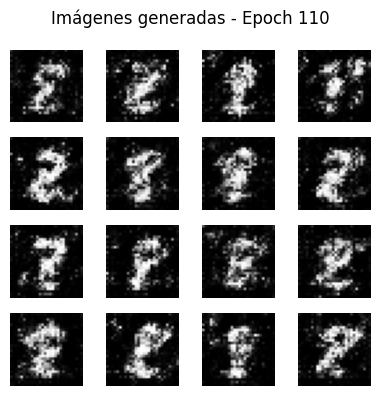

Epoch 111:  D_real: 0.5531, D_fake: 0.5531, G: 1.4866
Epoch 112:  D_real: 0.5549, D_fake: 0.5546, G: 1.4864
Epoch 113:  D_real: 0.5561, D_fake: 0.5552, G: 1.4868
Epoch 114:  D_real: 0.5558, D_fake: 0.5558, G: 1.4846
Epoch 115:  D_real: 0.5571, D_fake: 0.5568, G: 1.4833
Epoch 116:  D_real: 0.5588, D_fake: 0.5591, G: 1.4809
Epoch 117:  D_real: 0.5604, D_fake: 0.5604, G: 1.4793
Epoch 118:  D_real: 0.5616, D_fake: 0.5612, G: 1.4776
Epoch 119:  D_real: 0.5624, D_fake: 0.5628, G: 1.4760
Epoch 120:  D_real: 0.5640, D_fake: 0.5639, G: 1.4736
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


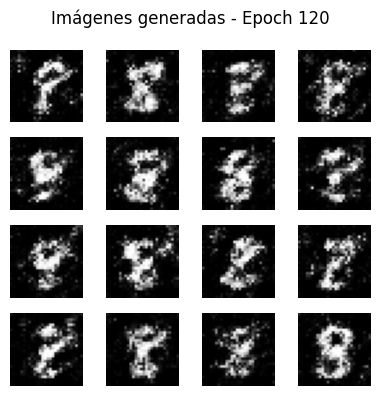

Epoch 121:  D_real: 0.5652, D_fake: 0.5655, G: 1.4725
Epoch 122:  D_real: 0.5666, D_fake: 0.5667, G: 1.4720
Epoch 123:  D_real: 0.5675, D_fake: 0.5673, G: 1.4718
Epoch 124:  D_real: 0.5684, D_fake: 0.5678, G: 1.4708
Epoch 125:  D_real: 0.5688, D_fake: 0.5690, G: 1.4685
Epoch 126:  D_real: 0.5696, D_fake: 0.5690, G: 1.4674
Epoch 127:  D_real: 0.5702, D_fake: 0.5708, G: 1.4648
Epoch 128:  D_real: 0.5722, D_fake: 0.5721, G: 1.4634
Epoch 129:  D_real: 0.5732, D_fake: 0.5735, G: 1.4617
Epoch 130:  D_real: 0.5748, D_fake: 0.5747, G: 1.4609
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


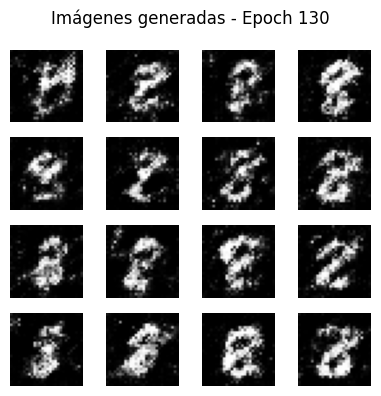

Epoch 131:  D_real: 0.5758, D_fake: 0.5758, G: 1.4592
Epoch 132:  D_real: 0.5768, D_fake: 0.5771, G: 1.4570
Epoch 133:  D_real: 0.5781, D_fake: 0.5778, G: 1.4548
Epoch 134:  D_real: 0.5787, D_fake: 0.5784, G: 1.4531
Epoch 135:  D_real: 0.5795, D_fake: 0.5793, G: 1.4500
Epoch 136:  D_real: 0.5797, D_fake: 0.5807, G: 1.4473
Epoch 137:  D_real: 0.5821, D_fake: 0.5824, G: 1.4457
Epoch 138:  D_real: 0.5833, D_fake: 0.5833, G: 1.4437
Epoch 139:  D_real: 0.5846, D_fake: 0.5845, G: 1.4424
Epoch 140:  D_real: 0.5854, D_fake: 0.5854, G: 1.4397
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


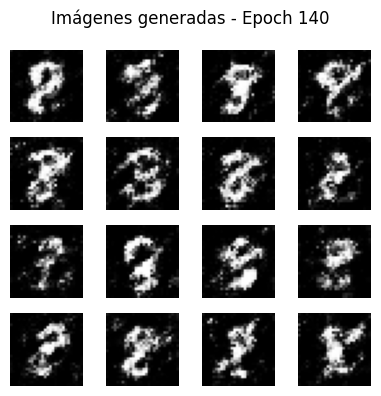

Epoch 141:  D_real: 0.5866, D_fake: 0.5872, G: 1.4376
Epoch 142:  D_real: 0.5883, D_fake: 0.5885, G: 1.4356
Epoch 143:  D_real: 0.5903, D_fake: 0.5901, G: 1.4338
Epoch 144:  D_real: 0.5916, D_fake: 0.5918, G: 1.4324
Epoch 145:  D_real: 0.5925, D_fake: 0.5923, G: 1.4318
Epoch 146:  D_real: 0.5937, D_fake: 0.5934, G: 1.4297
Epoch 147:  D_real: 0.5943, D_fake: 0.5944, G: 1.4266
Epoch 148:  D_real: 0.5957, D_fake: 0.5960, G: 1.4252
Epoch 149:  D_real: 0.5964, D_fake: 0.5973, G: 1.4223
Epoch 150:  D_real: 0.5980, D_fake: 0.5981, G: 1.4198
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


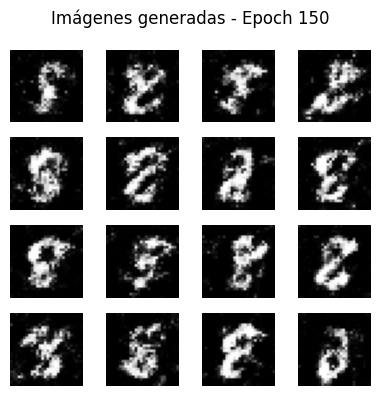

Epoch 151:  D_real: 0.5990, D_fake: 0.5987, G: 1.4177
Epoch 152:  D_real: 0.5997, D_fake: 0.5998, G: 1.4158
Epoch 153:  D_real: 0.6005, D_fake: 0.6005, G: 1.4145
Epoch 154:  D_real: 0.6015, D_fake: 0.6013, G: 1.4129
Epoch 155:  D_real: 0.6021, D_fake: 0.6016, G: 1.4113
Epoch 156:  D_real: 0.6021, D_fake: 0.6027, G: 1.4091
Epoch 157:  D_real: 0.6030, D_fake: 0.6032, G: 1.4080
Epoch 158:  D_real: 0.6039, D_fake: 0.6040, G: 1.4065
Epoch 159:  D_real: 0.6048, D_fake: 0.6048, G: 1.4051
Epoch 160:  D_real: 0.6061, D_fake: 0.6065, G: 1.4054
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


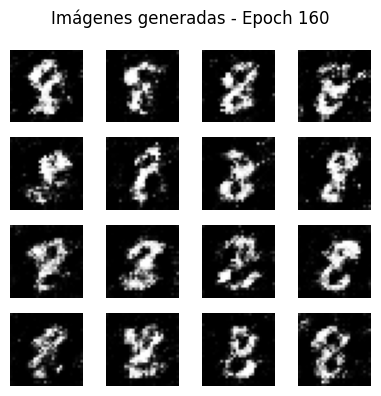

Epoch 161:  D_real: 0.6068, D_fake: 0.6067, G: 1.4054
Epoch 162:  D_real: 0.6074, D_fake: 0.6073, G: 1.4047
Epoch 163:  D_real: 0.6080, D_fake: 0.6083, G: 1.4022
Epoch 164:  D_real: 0.6088, D_fake: 0.6092, G: 1.4015
Epoch 165:  D_real: 0.6104, D_fake: 0.6107, G: 1.3996
Epoch 166:  D_real: 0.6119, D_fake: 0.6117, G: 1.3984
Epoch 167:  D_real: 0.6126, D_fake: 0.6127, G: 1.3982
Epoch 168:  D_real: 0.6134, D_fake: 0.6133, G: 1.3966
Epoch 169:  D_real: 0.6140, D_fake: 0.6142, G: 1.3949
Epoch 170:  D_real: 0.6149, D_fake: 0.6153, G: 1.3933
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


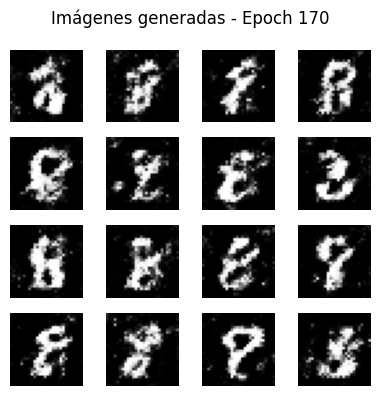

Epoch 171:  D_real: 0.6162, D_fake: 0.6165, G: 1.3920
Epoch 172:  D_real: 0.6177, D_fake: 0.6180, G: 1.3902
Epoch 173:  D_real: 0.6189, D_fake: 0.6187, G: 1.3887
Epoch 174:  D_real: 0.6193, D_fake: 0.6191, G: 1.3873
Epoch 175:  D_real: 0.6197, D_fake: 0.6191, G: 1.3862
Epoch 176:  D_real: 0.6195, D_fake: 0.6192, G: 1.3849
Epoch 177:  D_real: 0.6196, D_fake: 0.6197, G: 1.3835
Epoch 178:  D_real: 0.6203, D_fake: 0.6202, G: 1.3822
Epoch 179:  D_real: 0.6208, D_fake: 0.6209, G: 1.3808
Epoch 180:  D_real: 0.6214, D_fake: 0.6217, G: 1.3798
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


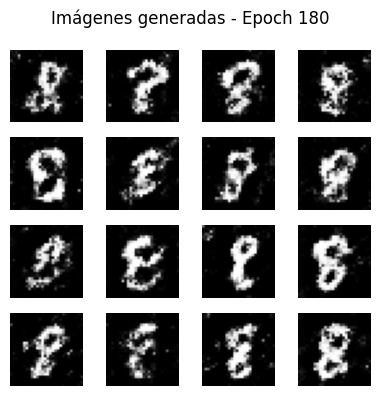

Epoch 181:  D_real: 0.6225, D_fake: 0.6226, G: 1.3793
Epoch 182:  D_real: 0.6234, D_fake: 0.6232, G: 1.3786
Epoch 183:  D_real: 0.6233, D_fake: 0.6229, G: 1.3774
Epoch 184:  D_real: 0.6233, D_fake: 0.6231, G: 1.3761
Epoch 185:  D_real: 0.6237, D_fake: 0.6236, G: 1.3752
Epoch 186:  D_real: 0.6241, D_fake: 0.6242, G: 1.3737
Epoch 187:  D_real: 0.6249, D_fake: 0.6252, G: 1.3720
Epoch 188:  D_real: 0.6258, D_fake: 0.6257, G: 1.3711
Epoch 189:  D_real: 0.6264, D_fake: 0.6269, G: 1.3693
Epoch 190:  D_real: 0.6279, D_fake: 0.6284, G: 1.3677
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


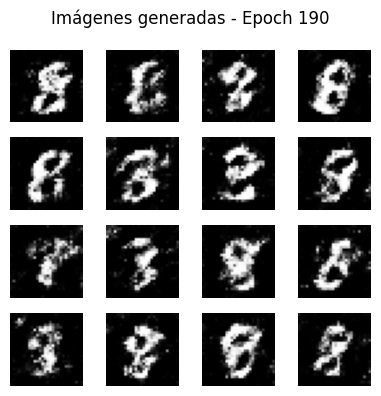

Epoch 191:  D_real: 0.6297, D_fake: 0.6296, G: 1.3659
Epoch 192:  D_real: 0.6304, D_fake: 0.6305, G: 1.3647
Epoch 193:  D_real: 0.6311, D_fake: 0.6311, G: 1.3634
Epoch 194:  D_real: 0.6317, D_fake: 0.6316, G: 1.3617
Epoch 195:  D_real: 0.6322, D_fake: 0.6322, G: 1.3602
Epoch 196:  D_real: 0.6330, D_fake: 0.6330, G: 1.3585
Epoch 197:  D_real: 0.6333, D_fake: 0.6331, G: 1.3570
Epoch 198:  D_real: 0.6337, D_fake: 0.6340, G: 1.3550
Epoch 199:  D_real: 0.6344, D_fake: 0.6344, G: 1.3537
Epoch 200:  D_real: 0.6349, D_fake: 0.6351, G: 1.3524
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


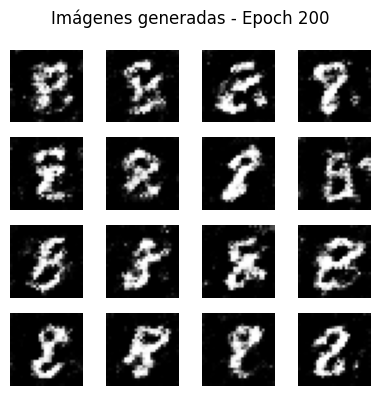

Epoch 201:  D_real: 0.6357, D_fake: 0.6358, G: 1.3508
Epoch 202:  D_real: 0.6364, D_fake: 0.6366, G: 1.3492
Epoch 203:  D_real: 0.6372, D_fake: 0.6372, G: 1.3482
Epoch 204:  D_real: 0.6382, D_fake: 0.6381, G: 1.3471
Epoch 205:  D_real: 0.6386, D_fake: 0.6384, G: 1.3457
Epoch 206:  D_real: 0.6389, D_fake: 0.6388, G: 1.3446
Epoch 207:  D_real: 0.6392, D_fake: 0.6390, G: 1.3435
Epoch 208:  D_real: 0.6393, D_fake: 0.6395, G: 1.3421
Epoch 209:  D_real: 0.6400, D_fake: 0.6403, G: 1.3407
Epoch 210:  D_real: 0.6407, D_fake: 0.6406, G: 1.3402
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


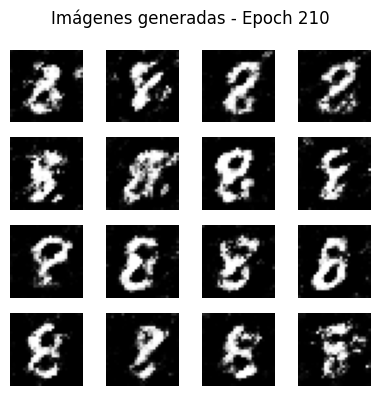

Epoch 211:  D_real: 0.6418, D_fake: 0.6420, G: 1.3383
Epoch 212:  D_real: 0.6427, D_fake: 0.6427, G: 1.3370
Epoch 213:  D_real: 0.6432, D_fake: 0.6430, G: 1.3360
Epoch 214:  D_real: 0.6436, D_fake: 0.6440, G: 1.3350
Epoch 215:  D_real: 0.6448, D_fake: 0.6445, G: 1.3342
Epoch 216:  D_real: 0.6451, D_fake: 0.6448, G: 1.3333
Epoch 217:  D_real: 0.6451, D_fake: 0.6452, G: 1.3320
Epoch 218:  D_real: 0.6456, D_fake: 0.6456, G: 1.3308
Epoch 219:  D_real: 0.6464, D_fake: 0.6466, G: 1.3296
Epoch 220:  D_real: 0.6469, D_fake: 0.6470, G: 1.3287
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


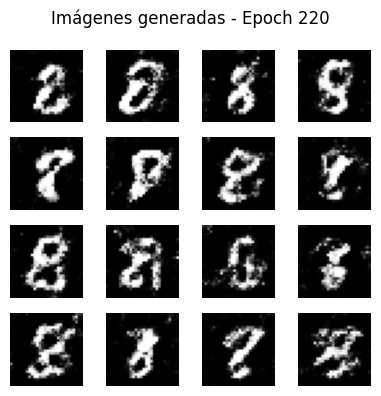

Epoch 221:  D_real: 0.6478, D_fake: 0.6482, G: 1.3282
Epoch 222:  D_real: 0.6490, D_fake: 0.6488, G: 1.3277
Epoch 223:  D_real: 0.6494, D_fake: 0.6491, G: 1.3270
Epoch 224:  D_real: 0.6499, D_fake: 0.6502, G: 1.3253
Epoch 225:  D_real: 0.6507, D_fake: 0.6508, G: 1.3242
Epoch 226:  D_real: 0.6513, D_fake: 0.6511, G: 1.3234
Epoch 227:  D_real: 0.6512, D_fake: 0.6513, G: 1.3218
Epoch 228:  D_real: 0.6518, D_fake: 0.6517, G: 1.3210
Epoch 229:  D_real: 0.6522, D_fake: 0.6523, G: 1.3198
Epoch 230:  D_real: 0.6528, D_fake: 0.6530, G: 1.3186
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


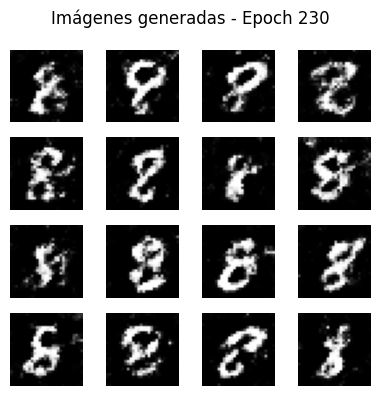

Epoch 231:  D_real: 0.6537, D_fake: 0.6538, G: 1.3176
Epoch 232:  D_real: 0.6544, D_fake: 0.6540, G: 1.3174
Epoch 233:  D_real: 0.6545, D_fake: 0.6544, G: 1.3163
Epoch 234:  D_real: 0.6550, D_fake: 0.6551, G: 1.3155
Epoch 235:  D_real: 0.6553, D_fake: 0.6553, G: 1.3141
Epoch 236:  D_real: 0.6557, D_fake: 0.6559, G: 1.3128
Epoch 237:  D_real: 0.6564, D_fake: 0.6565, G: 1.3116
Epoch 238:  D_real: 0.6572, D_fake: 0.6571, G: 1.3108
Epoch 239:  D_real: 0.6578, D_fake: 0.6578, G: 1.3096
Epoch 240:  D_real: 0.6582, D_fake: 0.6582, G: 1.3086
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


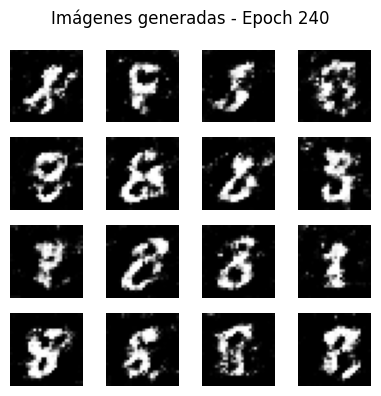

Epoch 241:  D_real: 0.6586, D_fake: 0.6585, G: 1.3073
Epoch 242:  D_real: 0.6588, D_fake: 0.6589, G: 1.3059
Epoch 243:  D_real: 0.6592, D_fake: 0.6592, G: 1.3048
Epoch 244:  D_real: 0.6596, D_fake: 0.6596, G: 1.3037
Epoch 245:  D_real: 0.6601, D_fake: 0.6600, G: 1.3026
Epoch 246:  D_real: 0.6603, D_fake: 0.6602, G: 1.3023
Epoch 247:  D_real: 0.6607, D_fake: 0.6606, G: 1.3019
Epoch 248:  D_real: 0.6612, D_fake: 0.6611, G: 1.3008
Epoch 249:  D_real: 0.6616, D_fake: 0.6617, G: 1.2995
Epoch 250:  D_real: 0.6619, D_fake: 0.6616, G: 1.2991
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


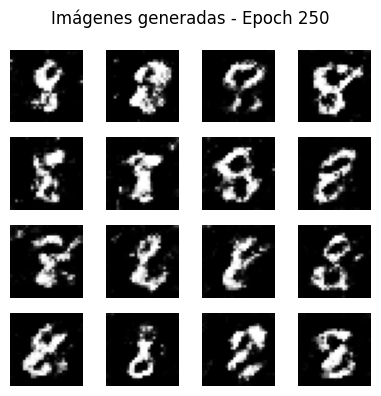

Epoch 251:  D_real: 0.6620, D_fake: 0.6618, G: 1.2984
Epoch 252:  D_real: 0.6621, D_fake: 0.6621, G: 1.2974
Epoch 253:  D_real: 0.6623, D_fake: 0.6621, G: 1.2967
Epoch 254:  D_real: 0.6627, D_fake: 0.6627, G: 1.2954
Epoch 255:  D_real: 0.6629, D_fake: 0.6629, G: 1.2941
Epoch 256:  D_real: 0.6635, D_fake: 0.6634, G: 1.2935
Epoch 257:  D_real: 0.6637, D_fake: 0.6635, G: 1.2930
Epoch 258:  D_real: 0.6640, D_fake: 0.6644, G: 1.2916
Epoch 259:  D_real: 0.6649, D_fake: 0.6649, G: 1.2903
Epoch 260:  D_real: 0.6652, D_fake: 0.6651, G: 1.2895
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


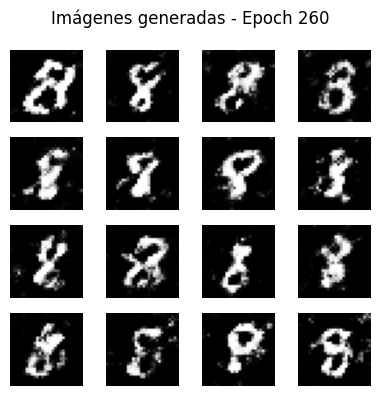

Epoch 261:  D_real: 0.6656, D_fake: 0.6654, G: 1.2888
Epoch 262:  D_real: 0.6657, D_fake: 0.6656, G: 1.2879
Epoch 263:  D_real: 0.6658, D_fake: 0.6659, G: 1.2868
Epoch 264:  D_real: 0.6662, D_fake: 0.6663, G: 1.2861
Epoch 265:  D_real: 0.6669, D_fake: 0.6668, G: 1.2852
Epoch 266:  D_real: 0.6670, D_fake: 0.6673, G: 1.2842
Epoch 267:  D_real: 0.6676, D_fake: 0.6677, G: 1.2840
Epoch 268:  D_real: 0.6681, D_fake: 0.6680, G: 1.2828
Epoch 269:  D_real: 0.6689, D_fake: 0.6686, G: 1.2823
Epoch 270:  D_real: 0.6689, D_fake: 0.6689, G: 1.2812
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


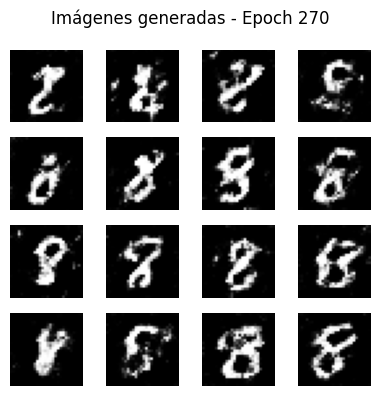

Epoch 271:  D_real: 0.6690, D_fake: 0.6690, G: 1.2805
Epoch 272:  D_real: 0.6693, D_fake: 0.6694, G: 1.2801
Epoch 273:  D_real: 0.6698, D_fake: 0.6696, G: 1.2798
Epoch 274:  D_real: 0.6704, D_fake: 0.6703, G: 1.2796
Epoch 275:  D_real: 0.6706, D_fake: 0.6707, G: 1.2786
Epoch 276:  D_real: 0.6710, D_fake: 0.6709, G: 1.2780
Epoch 277:  D_real: 0.6712, D_fake: 0.6709, G: 1.2775
Epoch 278:  D_real: 0.6713, D_fake: 0.6711, G: 1.2768
Epoch 279:  D_real: 0.6714, D_fake: 0.6712, G: 1.2760
Epoch 280:  D_real: 0.6713, D_fake: 0.6712, G: 1.2753
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


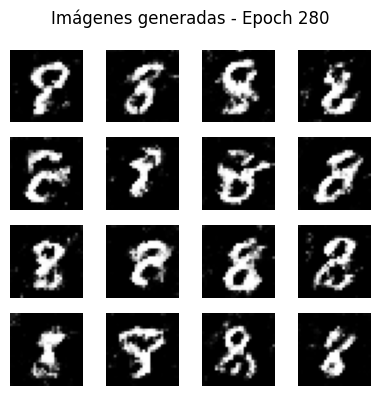

Epoch 281:  D_real: 0.6715, D_fake: 0.6715, G: 1.2743
Epoch 282:  D_real: 0.6720, D_fake: 0.6722, G: 1.2732
Epoch 283:  D_real: 0.6725, D_fake: 0.6724, G: 1.2721
Epoch 284:  D_real: 0.6726, D_fake: 0.6726, G: 1.2710
Epoch 285:  D_real: 0.6729, D_fake: 0.6729, G: 1.2705
Epoch 286:  D_real: 0.6732, D_fake: 0.6734, G: 1.2701
Epoch 287:  D_real: 0.6738, D_fake: 0.6739, G: 1.2690
Epoch 288:  D_real: 0.6744, D_fake: 0.6743, G: 1.2684
Epoch 289:  D_real: 0.6745, D_fake: 0.6743, G: 1.2679
Epoch 290:  D_real: 0.6748, D_fake: 0.6744, G: 1.2670
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


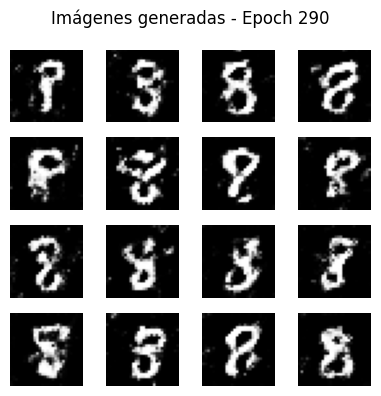

Epoch 291:  D_real: 0.6745, D_fake: 0.6745, G: 1.2661
Epoch 292:  D_real: 0.6748, D_fake: 0.6748, G: 1.2652
Epoch 293:  D_real: 0.6753, D_fake: 0.6755, G: 1.2639
Epoch 294:  D_real: 0.6757, D_fake: 0.6757, G: 1.2630
Epoch 295:  D_real: 0.6761, D_fake: 0.6761, G: 1.2621
Epoch 296:  D_real: 0.6766, D_fake: 0.6767, G: 1.2608
Epoch 297:  D_real: 0.6774, D_fake: 0.6775, G: 1.2597
Epoch 298:  D_real: 0.6778, D_fake: 0.6780, G: 1.2593
Epoch 299:  D_real: 0.6786, D_fake: 0.6786, G: 1.2588
Epoch 300:  D_real: 0.6789, D_fake: 0.6786, G: 1.2585
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


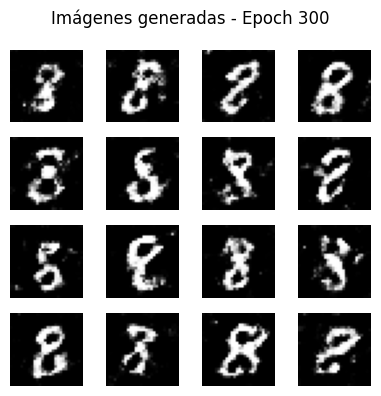

Epoch 301:  D_real: 0.6790, D_fake: 0.6787, G: 1.2581
Epoch 302:  D_real: 0.6791, D_fake: 0.6789, G: 1.2577
Epoch 303:  D_real: 0.6792, D_fake: 0.6789, G: 1.2571
Epoch 304:  D_real: 0.6792, D_fake: 0.6792, G: 1.2558
Epoch 305:  D_real: 0.6794, D_fake: 0.6792, G: 1.2547
Epoch 306:  D_real: 0.6792, D_fake: 0.6794, G: 1.2536
Epoch 307:  D_real: 0.6797, D_fake: 0.6798, G: 1.2531
Epoch 308:  D_real: 0.6800, D_fake: 0.6802, G: 1.2523
Epoch 309:  D_real: 0.6807, D_fake: 0.6807, G: 1.2516
Epoch 310:  D_real: 0.6812, D_fake: 0.6812, G: 1.2506
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


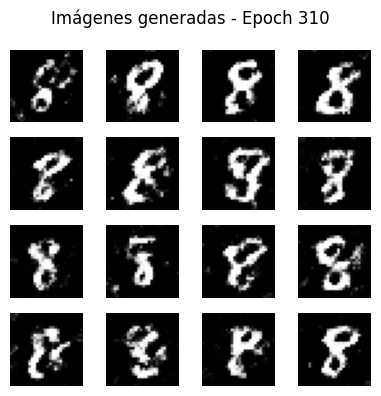

Epoch 311:  D_real: 0.6814, D_fake: 0.6815, G: 1.2496
Epoch 312:  D_real: 0.6819, D_fake: 0.6820, G: 1.2491
Epoch 313:  D_real: 0.6823, D_fake: 0.6821, G: 1.2485
Epoch 314:  D_real: 0.6823, D_fake: 0.6822, G: 1.2482
Epoch 315:  D_real: 0.6825, D_fake: 0.6823, G: 1.2482
Epoch 316:  D_real: 0.6824, D_fake: 0.6822, G: 1.2473
Epoch 317:  D_real: 0.6827, D_fake: 0.6825, G: 1.2465
Epoch 318:  D_real: 0.6827, D_fake: 0.6827, G: 1.2454
Epoch 319:  D_real: 0.6830, D_fake: 0.6830, G: 1.2445
Epoch 320:  D_real: 0.6832, D_fake: 0.6834, G: 1.2437
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


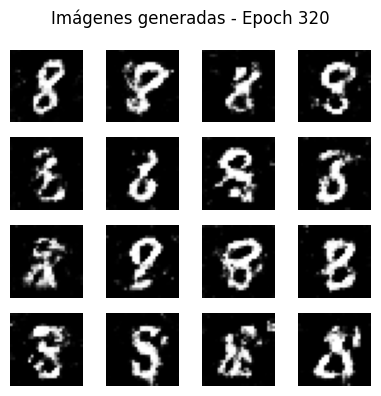

Epoch 321:  D_real: 0.6837, D_fake: 0.6835, G: 1.2433
Epoch 322:  D_real: 0.6838, D_fake: 0.6838, G: 1.2430
Epoch 323:  D_real: 0.6842, D_fake: 0.6840, G: 1.2425
Epoch 324:  D_real: 0.6844, D_fake: 0.6842, G: 1.2420
Epoch 325:  D_real: 0.6846, D_fake: 0.6846, G: 1.2416
Epoch 326:  D_real: 0.6848, D_fake: 0.6846, G: 1.2409
Epoch 327:  D_real: 0.6850, D_fake: 0.6850, G: 1.2400
Epoch 328:  D_real: 0.6851, D_fake: 0.6851, G: 1.2394
Epoch 329:  D_real: 0.6852, D_fake: 0.6851, G: 1.2385
Epoch 330:  D_real: 0.6854, D_fake: 0.6853, G: 1.2374
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


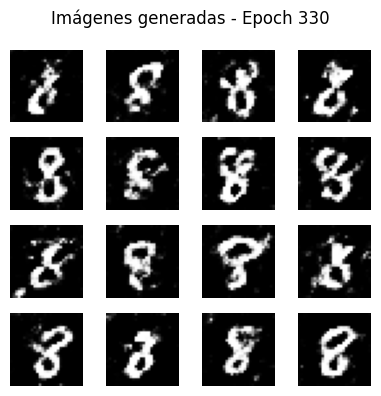

Epoch 331:  D_real: 0.6856, D_fake: 0.6857, G: 1.2369
Epoch 332:  D_real: 0.6860, D_fake: 0.6861, G: 1.2360
Epoch 333:  D_real: 0.6865, D_fake: 0.6866, G: 1.2350
Epoch 334:  D_real: 0.6870, D_fake: 0.6870, G: 1.2346
Epoch 335:  D_real: 0.6871, D_fake: 0.6869, G: 1.2342
Epoch 336:  D_real: 0.6872, D_fake: 0.6871, G: 1.2340
Epoch 337:  D_real: 0.6874, D_fake: 0.6872, G: 1.2333
Epoch 338:  D_real: 0.6876, D_fake: 0.6877, G: 1.2327
Epoch 339:  D_real: 0.6879, D_fake: 0.6879, G: 1.2319
Epoch 340:  D_real: 0.6881, D_fake: 0.6882, G: 1.2310
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


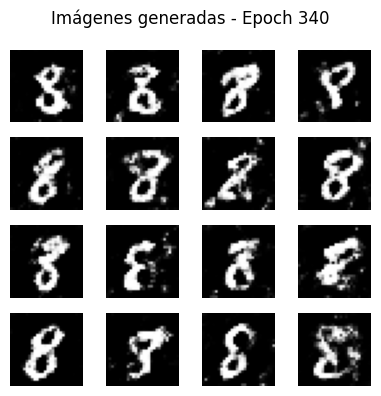

Epoch 341:  D_real: 0.6885, D_fake: 0.6886, G: 1.2304
Epoch 342:  D_real: 0.6890, D_fake: 0.6891, G: 1.2295
Epoch 343:  D_real: 0.6894, D_fake: 0.6894, G: 1.2286
Epoch 344:  D_real: 0.6897, D_fake: 0.6896, G: 1.2281
Epoch 345:  D_real: 0.6900, D_fake: 0.6900, G: 1.2272
Epoch 346:  D_real: 0.6902, D_fake: 0.6901, G: 1.2268
Epoch 347:  D_real: 0.6903, D_fake: 0.6900, G: 1.2266
Epoch 348:  D_real: 0.6904, D_fake: 0.6905, G: 1.2258
Epoch 349:  D_real: 0.6907, D_fake: 0.6907, G: 1.2254
Epoch 350:  D_real: 0.6909, D_fake: 0.6909, G: 1.2248
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step


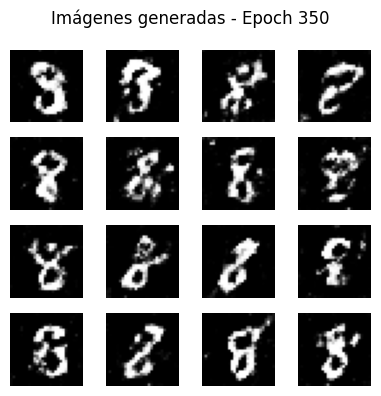

Epoch 351:  D_real: 0.6912, D_fake: 0.6911, G: 1.2245
Epoch 352:  D_real: 0.6912, D_fake: 0.6912, G: 1.2239
Epoch 353:  D_real: 0.6913, D_fake: 0.6911, G: 1.2232
Epoch 354:  D_real: 0.6915, D_fake: 0.6914, G: 1.2228
Epoch 355:  D_real: 0.6915, D_fake: 0.6916, G: 1.2219
Epoch 356:  D_real: 0.6918, D_fake: 0.6918, G: 1.2213
Epoch 357:  D_real: 0.6920, D_fake: 0.6919, G: 1.2205
Epoch 358:  D_real: 0.6922, D_fake: 0.6921, G: 1.2201
Epoch 359:  D_real: 0.6924, D_fake: 0.6922, G: 1.2193
Epoch 360:  D_real: 0.6924, D_fake: 0.6926, G: 1.2186
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


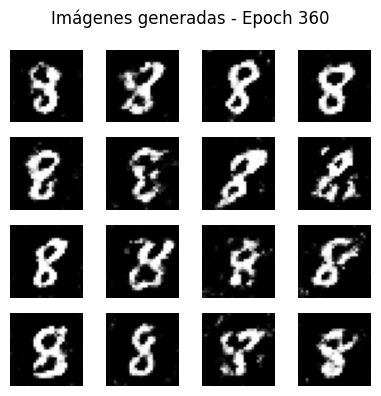

Epoch 361:  D_real: 0.6927, D_fake: 0.6926, G: 1.2182
Epoch 362:  D_real: 0.6929, D_fake: 0.6929, G: 1.2176
Epoch 363:  D_real: 0.6930, D_fake: 0.6929, G: 1.2174
Epoch 364:  D_real: 0.6931, D_fake: 0.6931, G: 1.2168
Epoch 365:  D_real: 0.6934, D_fake: 0.6933, G: 1.2163
Epoch 366:  D_real: 0.6935, D_fake: 0.6934, G: 1.2161
Epoch 367:  D_real: 0.6936, D_fake: 0.6936, G: 1.2154
Epoch 368:  D_real: 0.6940, D_fake: 0.6940, G: 1.2148
Epoch 369:  D_real: 0.6944, D_fake: 0.6945, G: 1.2141
Epoch 370:  D_real: 0.6948, D_fake: 0.6950, G: 1.2134
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


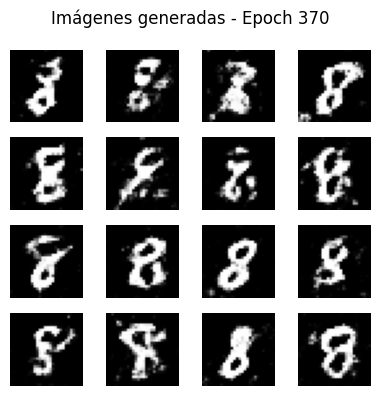

Epoch 371:  D_real: 0.6953, D_fake: 0.6954, G: 1.2124
Epoch 372:  D_real: 0.6956, D_fake: 0.6956, G: 1.2120
Epoch 373:  D_real: 0.6958, D_fake: 0.6956, G: 1.2116
Epoch 374:  D_real: 0.6960, D_fake: 0.6958, G: 1.2112
Epoch 375:  D_real: 0.6963, D_fake: 0.6961, G: 1.2110
Epoch 376:  D_real: 0.6962, D_fake: 0.6962, G: 1.2107
Epoch 377:  D_real: 0.6964, D_fake: 0.6962, G: 1.2106
Epoch 378:  D_real: 0.6964, D_fake: 0.6960, G: 1.2103
Epoch 379:  D_real: 0.6961, D_fake: 0.6959, G: 1.2098
Epoch 380:  D_real: 0.6960, D_fake: 0.6960, G: 1.2095
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


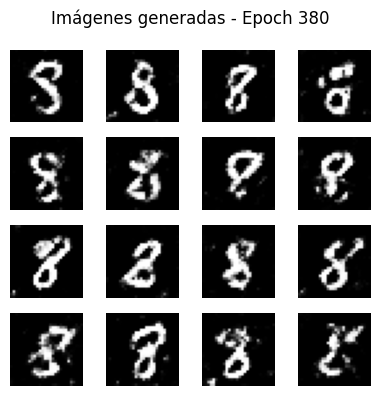

Epoch 381:  D_real: 0.6960, D_fake: 0.6959, G: 1.2089
Epoch 382:  D_real: 0.6961, D_fake: 0.6961, G: 1.2081
Epoch 383:  D_real: 0.6963, D_fake: 0.6962, G: 1.2077
Epoch 384:  D_real: 0.6963, D_fake: 0.6963, G: 1.2075
Epoch 385:  D_real: 0.6965, D_fake: 0.6964, G: 1.2070
Epoch 386:  D_real: 0.6965, D_fake: 0.6965, G: 1.2062
Epoch 387:  D_real: 0.6968, D_fake: 0.6969, G: 1.2056
Epoch 388:  D_real: 0.6973, D_fake: 0.6973, G: 1.2049
Epoch 389:  D_real: 0.6975, D_fake: 0.6974, G: 1.2044
Epoch 390:  D_real: 0.6977, D_fake: 0.6977, G: 1.2037
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


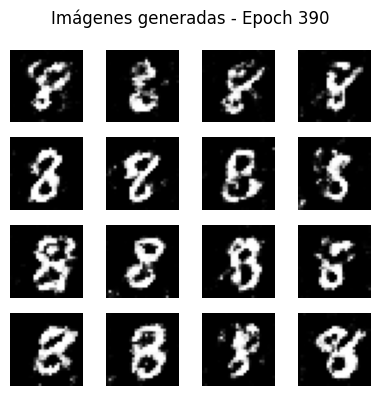

Epoch 391:  D_real: 0.6979, D_fake: 0.6978, G: 1.2030
Epoch 392:  D_real: 0.6979, D_fake: 0.6978, G: 1.2025
Epoch 393:  D_real: 0.6978, D_fake: 0.6977, G: 1.2023
Epoch 394:  D_real: 0.6979, D_fake: 0.6976, G: 1.2020
Epoch 395:  D_real: 0.6978, D_fake: 0.6977, G: 1.2014
Epoch 396:  D_real: 0.6978, D_fake: 0.6977, G: 1.2009
Epoch 397:  D_real: 0.6979, D_fake: 0.6977, G: 1.2005
Epoch 398:  D_real: 0.6979, D_fake: 0.6979, G: 1.1999
Epoch 399:  D_real: 0.6981, D_fake: 0.6981, G: 1.1992
Epoch 400:  D_real: 0.6983, D_fake: 0.6984, G: 1.1986
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


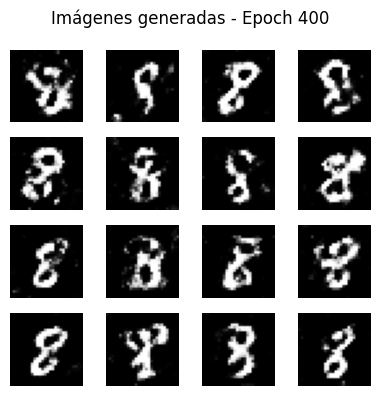

Epoch 401:  D_real: 0.6984, D_fake: 0.6983, G: 1.1983
Epoch 402:  D_real: 0.6986, D_fake: 0.6985, G: 1.1978
Epoch 403:  D_real: 0.6988, D_fake: 0.6988, G: 1.1973
Epoch 404:  D_real: 0.6990, D_fake: 0.6992, G: 1.1966
Epoch 405:  D_real: 0.6995, D_fake: 0.6994, G: 1.1965
Epoch 406:  D_real: 0.6997, D_fake: 0.6996, G: 1.1961
Epoch 407:  D_real: 0.6998, D_fake: 0.6997, G: 1.1957
Epoch 408:  D_real: 0.7001, D_fake: 0.7000, G: 1.1955
Epoch 409:  D_real: 0.7001, D_fake: 0.7000, G: 1.1948
Epoch 410:  D_real: 0.7002, D_fake: 0.7000, G: 1.1943
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


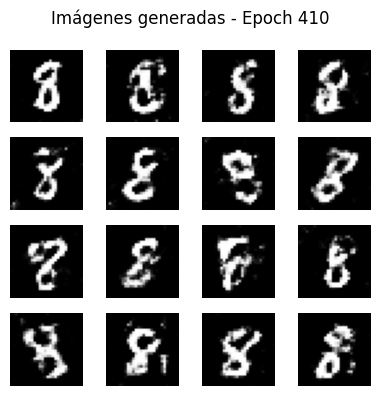

Epoch 411:  D_real: 0.7001, D_fake: 0.7000, G: 1.1941
Epoch 412:  D_real: 0.7002, D_fake: 0.7002, G: 1.1938
Epoch 413:  D_real: 0.7003, D_fake: 0.7001, G: 1.1933
Epoch 414:  D_real: 0.7002, D_fake: 0.7001, G: 1.1932
Epoch 415:  D_real: 0.7004, D_fake: 0.7002, G: 1.1926
Epoch 416:  D_real: 0.7005, D_fake: 0.7006, G: 1.1925
Epoch 417:  D_real: 0.7008, D_fake: 0.7008, G: 1.1917
Epoch 418:  D_real: 0.7011, D_fake: 0.7009, G: 1.1914
Epoch 419:  D_real: 0.7010, D_fake: 0.7009, G: 1.1908
Epoch 420:  D_real: 0.7011, D_fake: 0.7010, G: 1.1903
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


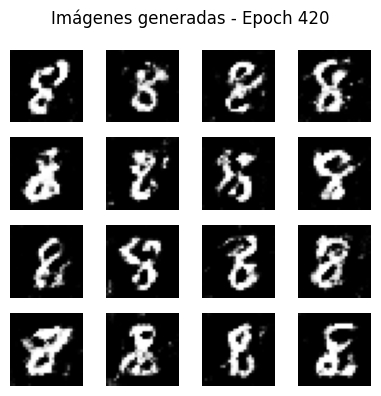

Epoch 421:  D_real: 0.7010, D_fake: 0.7011, G: 1.1896
Epoch 422:  D_real: 0.7013, D_fake: 0.7013, G: 1.1892
Epoch 423:  D_real: 0.7015, D_fake: 0.7013, G: 1.1889
Epoch 424:  D_real: 0.7017, D_fake: 0.7014, G: 1.1888
Epoch 425:  D_real: 0.7017, D_fake: 0.7014, G: 1.1884
Epoch 426:  D_real: 0.7014, D_fake: 0.7011, G: 1.1880
Epoch 427:  D_real: 0.7012, D_fake: 0.7009, G: 1.1877
Epoch 428:  D_real: 0.7011, D_fake: 0.7010, G: 1.1871
Epoch 429:  D_real: 0.7011, D_fake: 0.7011, G: 1.1867
Epoch 430:  D_real: 0.7012, D_fake: 0.7013, G: 1.1859
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


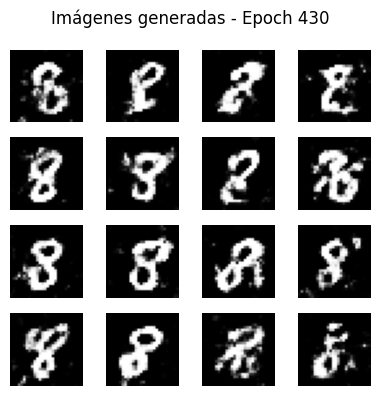

Epoch 431:  D_real: 0.7016, D_fake: 0.7018, G: 1.1852
Epoch 432:  D_real: 0.7020, D_fake: 0.7020, G: 1.1847
Epoch 433:  D_real: 0.7024, D_fake: 0.7024, G: 1.1842
Epoch 434:  D_real: 0.7026, D_fake: 0.7026, G: 1.1838
Epoch 435:  D_real: 0.7029, D_fake: 0.7027, G: 1.1833
Epoch 436:  D_real: 0.7031, D_fake: 0.7029, G: 1.1831
Epoch 437:  D_real: 0.7030, D_fake: 0.7029, G: 1.1826
Epoch 438:  D_real: 0.7031, D_fake: 0.7030, G: 1.1820
Epoch 439:  D_real: 0.7032, D_fake: 0.7031, G: 1.1815
Epoch 440:  D_real: 0.7033, D_fake: 0.7032, G: 1.1810
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


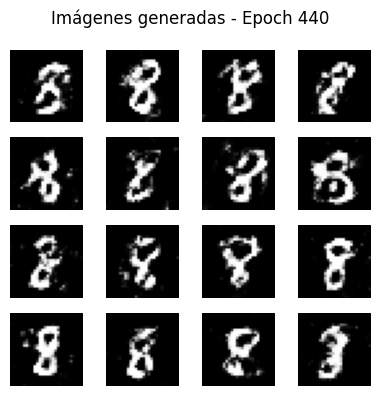

Epoch 441:  D_real: 0.7035, D_fake: 0.7036, G: 1.1803
Epoch 442:  D_real: 0.7039, D_fake: 0.7038, G: 1.1798
Epoch 443:  D_real: 0.7040, D_fake: 0.7039, G: 1.1792
Epoch 444:  D_real: 0.7040, D_fake: 0.7039, G: 1.1787
Epoch 445:  D_real: 0.7042, D_fake: 0.7041, G: 1.1786
Epoch 446:  D_real: 0.7042, D_fake: 0.7041, G: 1.1781
Epoch 447:  D_real: 0.7043, D_fake: 0.7042, G: 1.1779
Epoch 448:  D_real: 0.7043, D_fake: 0.7042, G: 1.1777
Epoch 449:  D_real: 0.7043, D_fake: 0.7042, G: 1.1775
Epoch 450:  D_real: 0.7043, D_fake: 0.7041, G: 1.1771
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


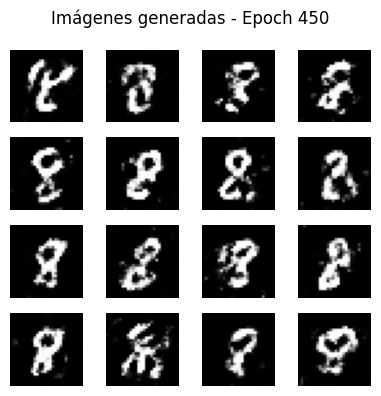

Epoch 451:  D_real: 0.7042, D_fake: 0.7040, G: 1.1766
Epoch 452:  D_real: 0.7041, D_fake: 0.7040, G: 1.1764
Epoch 453:  D_real: 0.7041, D_fake: 0.7040, G: 1.1761
Epoch 454:  D_real: 0.7040, D_fake: 0.7038, G: 1.1757
Epoch 455:  D_real: 0.7039, D_fake: 0.7038, G: 1.1755
Epoch 456:  D_real: 0.7038, D_fake: 0.7038, G: 1.1748
Epoch 457:  D_real: 0.7040, D_fake: 0.7041, G: 1.1742
Epoch 458:  D_real: 0.7041, D_fake: 0.7042, G: 1.1736
Epoch 459:  D_real: 0.7043, D_fake: 0.7044, G: 1.1731
Epoch 460:  D_real: 0.7047, D_fake: 0.7047, G: 1.1727
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


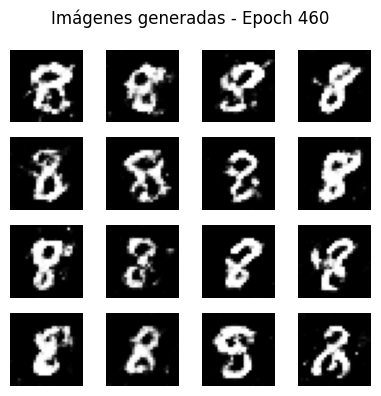

Epoch 461:  D_real: 0.7050, D_fake: 0.7051, G: 1.1720
Epoch 462:  D_real: 0.7053, D_fake: 0.7053, G: 1.1715
Epoch 463:  D_real: 0.7057, D_fake: 0.7055, G: 1.1713
Epoch 464:  D_real: 0.7058, D_fake: 0.7058, G: 1.1710
Epoch 465:  D_real: 0.7060, D_fake: 0.7059, G: 1.1707
Epoch 466:  D_real: 0.7061, D_fake: 0.7059, G: 1.1705
Epoch 467:  D_real: 0.7061, D_fake: 0.7059, G: 1.1700
Epoch 468:  D_real: 0.7061, D_fake: 0.7059, G: 1.1697
Epoch 469:  D_real: 0.7060, D_fake: 0.7060, G: 1.1694
Epoch 470:  D_real: 0.7060, D_fake: 0.7059, G: 1.1689
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


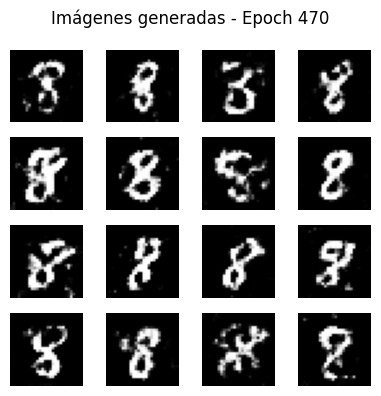

Epoch 471:  D_real: 0.7059, D_fake: 0.7058, G: 1.1684
Epoch 472:  D_real: 0.7059, D_fake: 0.7061, G: 1.1683
Epoch 473:  D_real: 0.7061, D_fake: 0.7061, G: 1.1679
Epoch 474:  D_real: 0.7062, D_fake: 0.7060, G: 1.1678
Epoch 475:  D_real: 0.7063, D_fake: 0.7061, G: 1.1677
Epoch 476:  D_real: 0.7062, D_fake: 0.7062, G: 1.1674
Epoch 477:  D_real: 0.7063, D_fake: 0.7062, G: 1.1670
Epoch 478:  D_real: 0.7063, D_fake: 0.7062, G: 1.1668
Epoch 479:  D_real: 0.7064, D_fake: 0.7064, G: 1.1663
Epoch 480:  D_real: 0.7066, D_fake: 0.7065, G: 1.1660
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


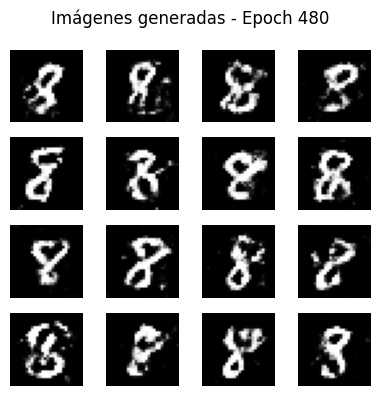

Epoch 481:  D_real: 0.7065, D_fake: 0.7065, G: 1.1656
Epoch 482:  D_real: 0.7067, D_fake: 0.7065, G: 1.1654
Epoch 483:  D_real: 0.7069, D_fake: 0.7070, G: 1.1649
Epoch 484:  D_real: 0.7071, D_fake: 0.7071, G: 1.1644
Epoch 485:  D_real: 0.7072, D_fake: 0.7071, G: 1.1642
Epoch 486:  D_real: 0.7073, D_fake: 0.7074, G: 1.1639
Epoch 487:  D_real: 0.7074, D_fake: 0.7074, G: 1.1637
Epoch 488:  D_real: 0.7075, D_fake: 0.7073, G: 1.1637
Epoch 489:  D_real: 0.7074, D_fake: 0.7071, G: 1.1637
Epoch 490:  D_real: 0.7071, D_fake: 0.7069, G: 1.1636
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


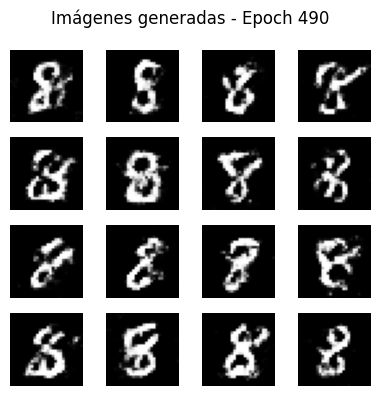

Epoch 491:  D_real: 0.7070, D_fake: 0.7068, G: 1.1635
Epoch 492:  D_real: 0.7069, D_fake: 0.7068, G: 1.1632
Epoch 493:  D_real: 0.7067, D_fake: 0.7065, G: 1.1634
Epoch 494:  D_real: 0.7066, D_fake: 0.7066, G: 1.1630
Epoch 495:  D_real: 0.7067, D_fake: 0.7065, G: 1.1627
Epoch 496:  D_real: 0.7066, D_fake: 0.7066, G: 1.1623
Epoch 497:  D_real: 0.7066, D_fake: 0.7065, G: 1.1619
Epoch 498:  D_real: 0.7066, D_fake: 0.7066, G: 1.1615
Epoch 499:  D_real: 0.7068, D_fake: 0.7068, G: 1.1610
Epoch 500:  D_real: 0.7070, D_fake: 0.7070, G: 1.1607
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


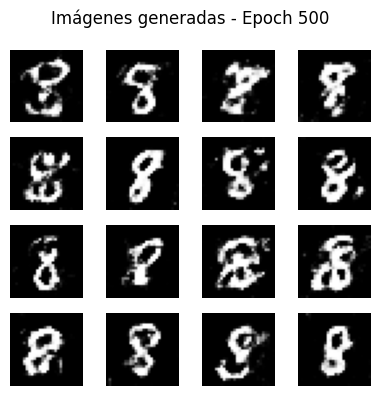

Epoch 501:  D_real: 0.7073, D_fake: 0.7073, G: 1.1602
Epoch 502:  D_real: 0.7075, D_fake: 0.7075, G: 1.1600
Epoch 503:  D_real: 0.7076, D_fake: 0.7076, G: 1.1596
Epoch 504:  D_real: 0.7078, D_fake: 0.7078, G: 1.1592
Epoch 505:  D_real: 0.7080, D_fake: 0.7081, G: 1.1587
Epoch 506:  D_real: 0.7082, D_fake: 0.7082, G: 1.1584
Epoch 507:  D_real: 0.7084, D_fake: 0.7083, G: 1.1579
Epoch 508:  D_real: 0.7086, D_fake: 0.7087, G: 1.1575
Epoch 509:  D_real: 0.7089, D_fake: 0.7088, G: 1.1573
Epoch 510:  D_real: 0.7091, D_fake: 0.7089, G: 1.1572
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


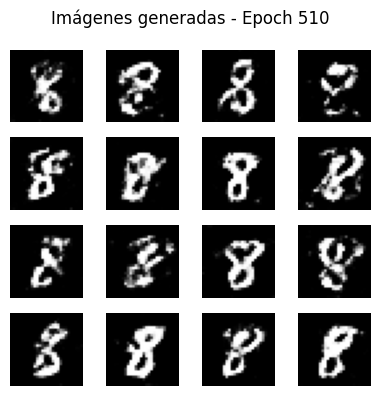

Epoch 511:  D_real: 0.7091, D_fake: 0.7090, G: 1.1570
Epoch 512:  D_real: 0.7091, D_fake: 0.7088, G: 1.1570
Epoch 513:  D_real: 0.7089, D_fake: 0.7087, G: 1.1567
Epoch 514:  D_real: 0.7088, D_fake: 0.7086, G: 1.1566
Epoch 515:  D_real: 0.7087, D_fake: 0.7085, G: 1.1564
Epoch 516:  D_real: 0.7084, D_fake: 0.7083, G: 1.1561
Epoch 517:  D_real: 0.7082, D_fake: 0.7080, G: 1.1561
Epoch 518:  D_real: 0.7081, D_fake: 0.7079, G: 1.1558
Epoch 519:  D_real: 0.7079, D_fake: 0.7078, G: 1.1553
Epoch 520:  D_real: 0.7077, D_fake: 0.7077, G: 1.1550
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


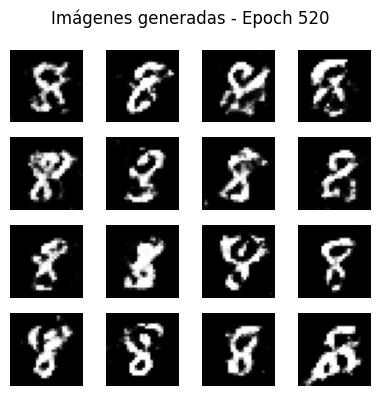

Epoch 521:  D_real: 0.7077, D_fake: 0.7078, G: 1.1545
Epoch 522:  D_real: 0.7079, D_fake: 0.7080, G: 1.1540
Epoch 523:  D_real: 0.7081, D_fake: 0.7081, G: 1.1537
Epoch 524:  D_real: 0.7082, D_fake: 0.7081, G: 1.1531
Epoch 525:  D_real: 0.7084, D_fake: 0.7083, G: 1.1529
Epoch 526:  D_real: 0.7084, D_fake: 0.7082, G: 1.1529
Epoch 527:  D_real: 0.7083, D_fake: 0.7081, G: 1.1528
Epoch 528:  D_real: 0.7082, D_fake: 0.7080, G: 1.1528
Epoch 529:  D_real: 0.7081, D_fake: 0.7079, G: 1.1528
Epoch 530:  D_real: 0.7080, D_fake: 0.7079, G: 1.1526
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


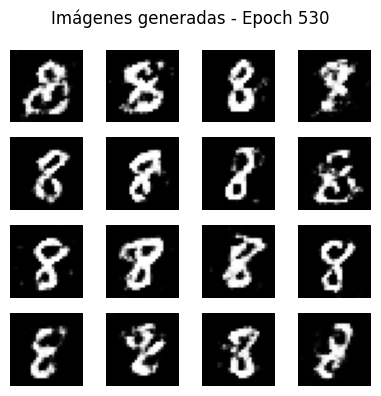

Epoch 531:  D_real: 0.7079, D_fake: 0.7078, G: 1.1523
Epoch 532:  D_real: 0.7079, D_fake: 0.7080, G: 1.1519
Epoch 533:  D_real: 0.7081, D_fake: 0.7081, G: 1.1515
Epoch 534:  D_real: 0.7083, D_fake: 0.7081, G: 1.1511
Epoch 535:  D_real: 0.7084, D_fake: 0.7084, G: 1.1507
Epoch 536:  D_real: 0.7085, D_fake: 0.7085, G: 1.1501
Epoch 537:  D_real: 0.7087, D_fake: 0.7085, G: 1.1498
Epoch 538:  D_real: 0.7087, D_fake: 0.7086, G: 1.1496
Epoch 539:  D_real: 0.7086, D_fake: 0.7085, G: 1.1494
Epoch 540:  D_real: 0.7085, D_fake: 0.7083, G: 1.1495
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


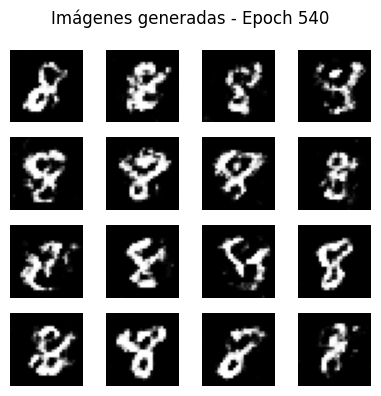

Epoch 541:  D_real: 0.7084, D_fake: 0.7083, G: 1.1493
Epoch 542:  D_real: 0.7083, D_fake: 0.7080, G: 1.1493
Epoch 543:  D_real: 0.7081, D_fake: 0.7078, G: 1.1495
Epoch 544:  D_real: 0.7079, D_fake: 0.7077, G: 1.1497
Epoch 545:  D_real: 0.7077, D_fake: 0.7076, G: 1.1493
Epoch 546:  D_real: 0.7076, D_fake: 0.7076, G: 1.1490
Epoch 547:  D_real: 0.7075, D_fake: 0.7077, G: 1.1486
Epoch 548:  D_real: 0.7077, D_fake: 0.7079, G: 1.1482
Epoch 549:  D_real: 0.7081, D_fake: 0.7081, G: 1.1479
Epoch 550:  D_real: 0.7082, D_fake: 0.7082, G: 1.1475
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


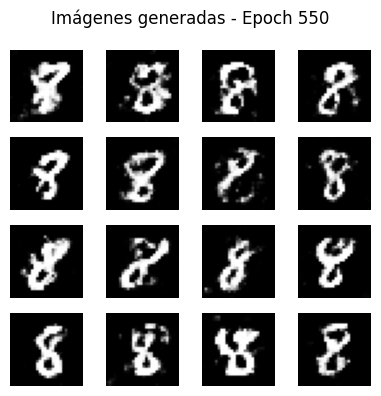

Epoch 551:  D_real: 0.7084, D_fake: 0.7083, G: 1.1469
Epoch 552:  D_real: 0.7087, D_fake: 0.7088, G: 1.1465
Epoch 553:  D_real: 0.7089, D_fake: 0.7089, G: 1.1460
Epoch 554:  D_real: 0.7092, D_fake: 0.7091, G: 1.1457
Epoch 555:  D_real: 0.7093, D_fake: 0.7091, G: 1.1456
Epoch 556:  D_real: 0.7092, D_fake: 0.7090, G: 1.1455
Epoch 557:  D_real: 0.7092, D_fake: 0.7090, G: 1.1456
Epoch 558:  D_real: 0.7090, D_fake: 0.7089, G: 1.1453
Epoch 559:  D_real: 0.7090, D_fake: 0.7089, G: 1.1452
Epoch 560:  D_real: 0.7091, D_fake: 0.7089, G: 1.1454
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


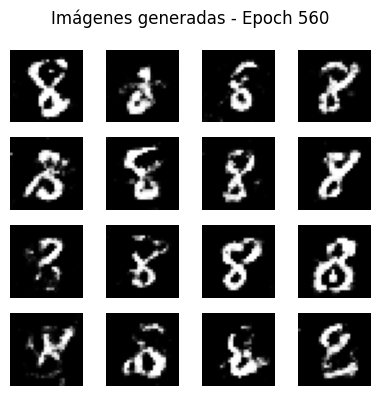

Epoch 561:  D_real: 0.7089, D_fake: 0.7087, G: 1.1454
Epoch 562:  D_real: 0.7087, D_fake: 0.7086, G: 1.1452
Epoch 563:  D_real: 0.7086, D_fake: 0.7084, G: 1.1449
Epoch 564:  D_real: 0.7085, D_fake: 0.7085, G: 1.1446
Epoch 565:  D_real: 0.7086, D_fake: 0.7088, G: 1.1442
Epoch 566:  D_real: 0.7089, D_fake: 0.7090, G: 1.1438
Epoch 567:  D_real: 0.7091, D_fake: 0.7090, G: 1.1436
Epoch 568:  D_real: 0.7091, D_fake: 0.7090, G: 1.1433
Epoch 569:  D_real: 0.7091, D_fake: 0.7091, G: 1.1432
Epoch 570:  D_real: 0.7093, D_fake: 0.7093, G: 1.1431
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


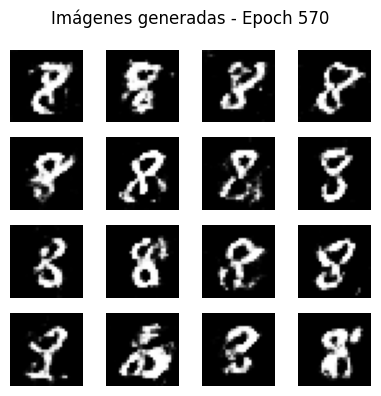

Epoch 571:  D_real: 0.7095, D_fake: 0.7094, G: 1.1427
Epoch 572:  D_real: 0.7095, D_fake: 0.7093, G: 1.1426
Epoch 573:  D_real: 0.7094, D_fake: 0.7093, G: 1.1424
Epoch 574:  D_real: 0.7093, D_fake: 0.7092, G: 1.1421
Epoch 575:  D_real: 0.7093, D_fake: 0.7091, G: 1.1419
Epoch 576:  D_real: 0.7092, D_fake: 0.7090, G: 1.1419
Epoch 577:  D_real: 0.7092, D_fake: 0.7092, G: 1.1418
Epoch 578:  D_real: 0.7093, D_fake: 0.7092, G: 1.1415
Epoch 579:  D_real: 0.7094, D_fake: 0.7092, G: 1.1414
Epoch 580:  D_real: 0.7092, D_fake: 0.7091, G: 1.1412
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


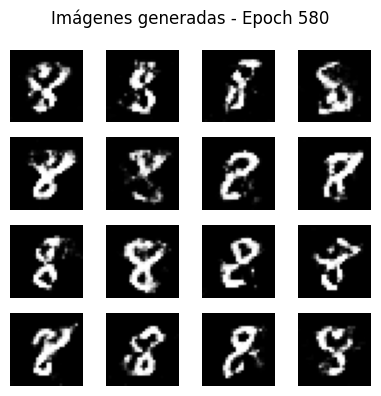

Epoch 581:  D_real: 0.7092, D_fake: 0.7090, G: 1.1411
Epoch 582:  D_real: 0.7091, D_fake: 0.7087, G: 1.1414
Epoch 583:  D_real: 0.7088, D_fake: 0.7089, G: 1.1411
Epoch 584:  D_real: 0.7091, D_fake: 0.7091, G: 1.1406
Epoch 585:  D_real: 0.7091, D_fake: 0.7090, G: 1.1405
Epoch 586:  D_real: 0.7091, D_fake: 0.7091, G: 1.1401
Epoch 587:  D_real: 0.7092, D_fake: 0.7090, G: 1.1400
Epoch 588:  D_real: 0.7090, D_fake: 0.7091, G: 1.1397
Epoch 589:  D_real: 0.7093, D_fake: 0.7093, G: 1.1397
Epoch 590:  D_real: 0.7094, D_fake: 0.7093, G: 1.1397
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


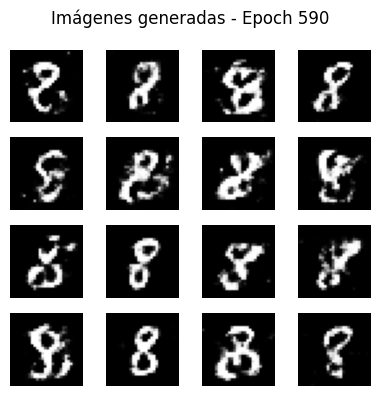

Epoch 591:  D_real: 0.7095, D_fake: 0.7093, G: 1.1397
Epoch 592:  D_real: 0.7094, D_fake: 0.7092, G: 1.1396
Epoch 593:  D_real: 0.7093, D_fake: 0.7091, G: 1.1395
Epoch 594:  D_real: 0.7091, D_fake: 0.7091, G: 1.1394
Epoch 595:  D_real: 0.7092, D_fake: 0.7091, G: 1.1392
Epoch 596:  D_real: 0.7092, D_fake: 0.7092, G: 1.1389
Epoch 597:  D_real: 0.7092, D_fake: 0.7092, G: 1.1387
Epoch 598:  D_real: 0.7092, D_fake: 0.7090, G: 1.1384
Epoch 599:  D_real: 0.7091, D_fake: 0.7092, G: 1.1382
Epoch 600:  D_real: 0.7093, D_fake: 0.7092, G: 1.1380
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


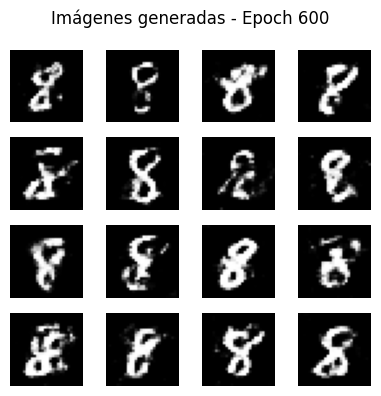

Epoch 601:  D_real: 0.7092, D_fake: 0.7091, G: 1.1378
Epoch 602:  D_real: 0.7092, D_fake: 0.7092, G: 1.1376
Epoch 603:  D_real: 0.7094, D_fake: 0.7094, G: 1.1374
Epoch 604:  D_real: 0.7094, D_fake: 0.7092, G: 1.1376
Epoch 605:  D_real: 0.7093, D_fake: 0.7091, G: 1.1376
Epoch 606:  D_real: 0.7093, D_fake: 0.7092, G: 1.1374
Epoch 607:  D_real: 0.7093, D_fake: 0.7092, G: 1.1372
Epoch 608:  D_real: 0.7094, D_fake: 0.7094, G: 1.1369
Epoch 609:  D_real: 0.7094, D_fake: 0.7094, G: 1.1367
Epoch 610:  D_real: 0.7095, D_fake: 0.7094, G: 1.1366
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


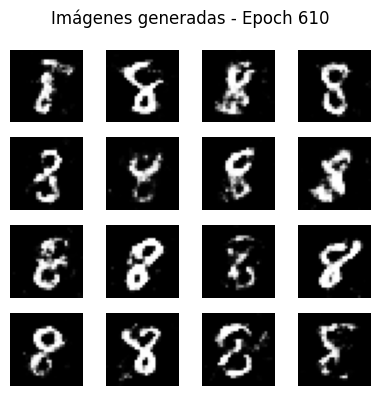

Epoch 611:  D_real: 0.7095, D_fake: 0.7094, G: 1.1365
Epoch 612:  D_real: 0.7095, D_fake: 0.7094, G: 1.1363
Epoch 613:  D_real: 0.7096, D_fake: 0.7095, G: 1.1361
Epoch 614:  D_real: 0.7096, D_fake: 0.7097, G: 1.1357
Epoch 615:  D_real: 0.7099, D_fake: 0.7100, G: 1.1351
Epoch 616:  D_real: 0.7102, D_fake: 0.7104, G: 1.1346
Epoch 617:  D_real: 0.7106, D_fake: 0.7107, G: 1.1342
Epoch 618:  D_real: 0.7109, D_fake: 0.7111, G: 1.1339
Epoch 619:  D_real: 0.7113, D_fake: 0.7112, G: 1.1340
Epoch 620:  D_real: 0.7115, D_fake: 0.7113, G: 1.1340
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


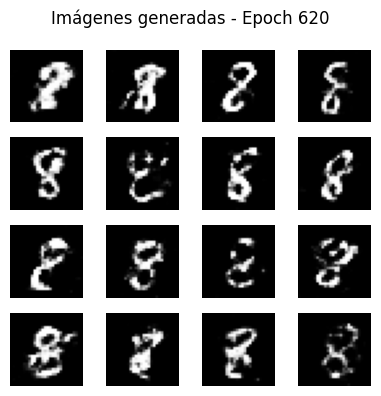

Epoch 621:  D_real: 0.7113, D_fake: 0.7110, G: 1.1341
Epoch 622:  D_real: 0.7112, D_fake: 0.7109, G: 1.1343
Epoch 623:  D_real: 0.7109, D_fake: 0.7105, G: 1.1345
Epoch 624:  D_real: 0.7104, D_fake: 0.7102, G: 1.1342
Epoch 625:  D_real: 0.7102, D_fake: 0.7099, G: 1.1343
Epoch 626:  D_real: 0.7098, D_fake: 0.7098, G: 1.1340
Epoch 627:  D_real: 0.7097, D_fake: 0.7098, G: 1.1336
Epoch 628:  D_real: 0.7098, D_fake: 0.7100, G: 1.1335
Epoch 629:  D_real: 0.7101, D_fake: 0.7101, G: 1.1333
Epoch 630:  D_real: 0.7102, D_fake: 0.7101, G: 1.1332
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


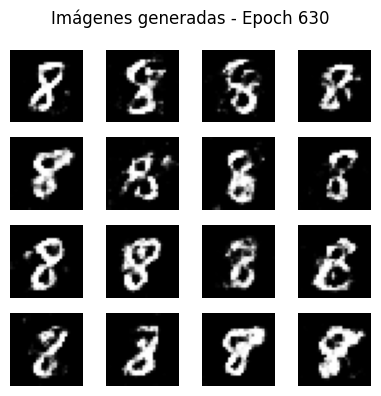

Epoch 631:  D_real: 0.7101, D_fake: 0.7100, G: 1.1332
Epoch 632:  D_real: 0.7101, D_fake: 0.7100, G: 1.1330
Epoch 633:  D_real: 0.7101, D_fake: 0.7100, G: 1.1329
Epoch 634:  D_real: 0.7101, D_fake: 0.7099, G: 1.1327
Epoch 635:  D_real: 0.7100, D_fake: 0.7100, G: 1.1324
Epoch 636:  D_real: 0.7102, D_fake: 0.7102, G: 1.1321
Epoch 637:  D_real: 0.7102, D_fake: 0.7103, G: 1.1319
Epoch 638:  D_real: 0.7104, D_fake: 0.7103, G: 1.1316
Epoch 639:  D_real: 0.7105, D_fake: 0.7104, G: 1.1314
Epoch 640:  D_real: 0.7105, D_fake: 0.7106, G: 1.1309
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


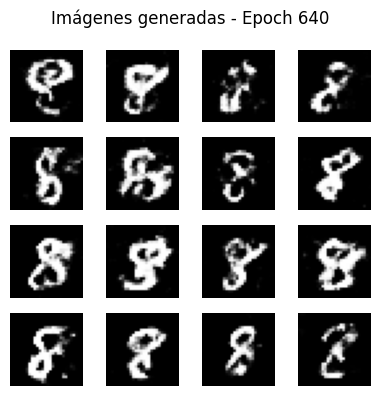

Epoch 641:  D_real: 0.7108, D_fake: 0.7108, G: 1.1307
Epoch 642:  D_real: 0.7109, D_fake: 0.7107, G: 1.1306
Epoch 643:  D_real: 0.7108, D_fake: 0.7108, G: 1.1304
Epoch 644:  D_real: 0.7108, D_fake: 0.7106, G: 1.1303
Epoch 645:  D_real: 0.7106, D_fake: 0.7103, G: 1.1303
Epoch 646:  D_real: 0.7104, D_fake: 0.7102, G: 1.1305
Epoch 647:  D_real: 0.7102, D_fake: 0.7103, G: 1.1302
Epoch 648:  D_real: 0.7103, D_fake: 0.7103, G: 1.1298
Epoch 649:  D_real: 0.7105, D_fake: 0.7104, G: 1.1296
Epoch 650:  D_real: 0.7105, D_fake: 0.7105, G: 1.1295
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


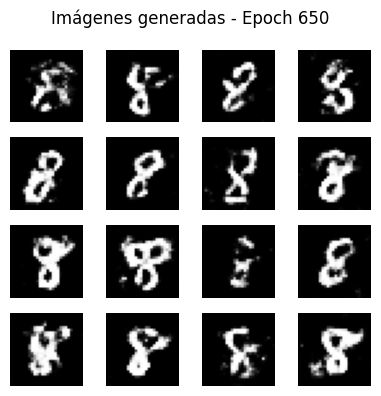

Epoch 651:  D_real: 0.7106, D_fake: 0.7106, G: 1.1293
Epoch 652:  D_real: 0.7107, D_fake: 0.7106, G: 1.1292
Epoch 653:  D_real: 0.7107, D_fake: 0.7106, G: 1.1291
Epoch 654:  D_real: 0.7107, D_fake: 0.7106, G: 1.1289
Epoch 655:  D_real: 0.7107, D_fake: 0.7106, G: 1.1286
Epoch 656:  D_real: 0.7108, D_fake: 0.7107, G: 1.1284
Epoch 657:  D_real: 0.7108, D_fake: 0.7108, G: 1.1282
Epoch 658:  D_real: 0.7108, D_fake: 0.7108, G: 1.1280
Epoch 659:  D_real: 0.7109, D_fake: 0.7108, G: 1.1280
Epoch 660:  D_real: 0.7109, D_fake: 0.7108, G: 1.1278
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


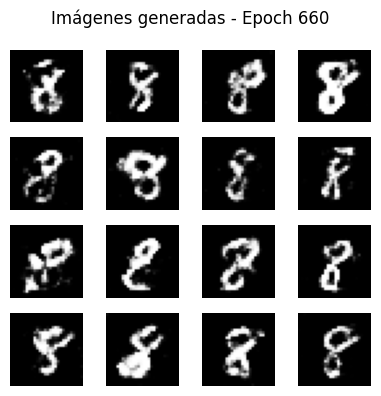

Epoch 661:  D_real: 0.7109, D_fake: 0.7107, G: 1.1280
Epoch 662:  D_real: 0.7109, D_fake: 0.7109, G: 1.1276
Epoch 663:  D_real: 0.7109, D_fake: 0.7111, G: 1.1271
Epoch 664:  D_real: 0.7113, D_fake: 0.7115, G: 1.1268
Epoch 665:  D_real: 0.7117, D_fake: 0.7116, G: 1.1264
Epoch 666:  D_real: 0.7117, D_fake: 0.7117, G: 1.1260
Epoch 667:  D_real: 0.7119, D_fake: 0.7118, G: 1.1259
Epoch 668:  D_real: 0.7120, D_fake: 0.7119, G: 1.1256
Epoch 669:  D_real: 0.7120, D_fake: 0.7118, G: 1.1257
Epoch 670:  D_real: 0.7119, D_fake: 0.7118, G: 1.1256
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


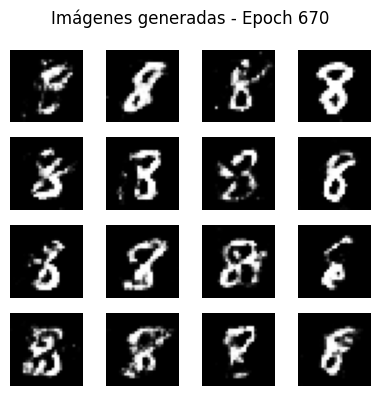

Epoch 671:  D_real: 0.7118, D_fake: 0.7115, G: 1.1256
Epoch 672:  D_real: 0.7116, D_fake: 0.7115, G: 1.1255
Epoch 673:  D_real: 0.7115, D_fake: 0.7113, G: 1.1253
Epoch 674:  D_real: 0.7113, D_fake: 0.7111, G: 1.1252
Epoch 675:  D_real: 0.7111, D_fake: 0.7110, G: 1.1252
Epoch 676:  D_real: 0.7110, D_fake: 0.7110, G: 1.1250
Epoch 677:  D_real: 0.7110, D_fake: 0.7110, G: 1.1246
Epoch 678:  D_real: 0.7110, D_fake: 0.7110, G: 1.1242
Epoch 679:  D_real: 0.7111, D_fake: 0.7110, G: 1.1241
Epoch 680:  D_real: 0.7111, D_fake: 0.7110, G: 1.1239
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


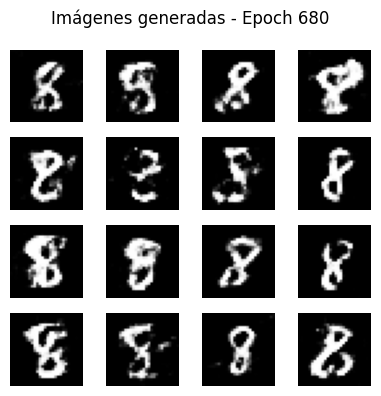

Epoch 681:  D_real: 0.7112, D_fake: 0.7111, G: 1.1237
Epoch 682:  D_real: 0.7112, D_fake: 0.7109, G: 1.1238
Epoch 683:  D_real: 0.7109, D_fake: 0.7109, G: 1.1235
Epoch 684:  D_real: 0.7110, D_fake: 0.7108, G: 1.1235
Epoch 685:  D_real: 0.7109, D_fake: 0.7108, G: 1.1234
Epoch 686:  D_real: 0.7107, D_fake: 0.7105, G: 1.1235
Epoch 687:  D_real: 0.7106, D_fake: 0.7106, G: 1.1231
Epoch 688:  D_real: 0.7106, D_fake: 0.7106, G: 1.1230
Epoch 689:  D_real: 0.7105, D_fake: 0.7106, G: 1.1227
Epoch 690:  D_real: 0.7106, D_fake: 0.7106, G: 1.1224
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


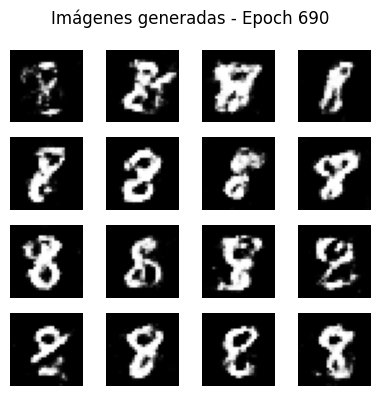

Epoch 691:  D_real: 0.7107, D_fake: 0.7106, G: 1.1224
Epoch 692:  D_real: 0.7108, D_fake: 0.7108, G: 1.1222
Epoch 693:  D_real: 0.7108, D_fake: 0.7107, G: 1.1221
Epoch 694:  D_real: 0.7109, D_fake: 0.7111, G: 1.1217
Epoch 695:  D_real: 0.7113, D_fake: 0.7111, G: 1.1216
Epoch 696:  D_real: 0.7113, D_fake: 0.7112, G: 1.1216
Epoch 697:  D_real: 0.7114, D_fake: 0.7114, G: 1.1213
Epoch 698:  D_real: 0.7115, D_fake: 0.7113, G: 1.1213
Epoch 699:  D_real: 0.7113, D_fake: 0.7111, G: 1.1213
Epoch 700:  D_real: 0.7112, D_fake: 0.7109, G: 1.1215
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


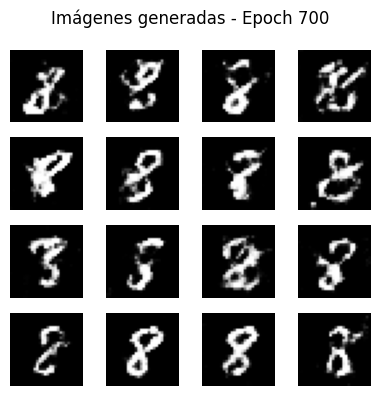

Epoch 701:  D_real: 0.7108, D_fake: 0.7106, G: 1.1215
Epoch 702:  D_real: 0.7106, D_fake: 0.7106, G: 1.1212
Epoch 703:  D_real: 0.7106, D_fake: 0.7105, G: 1.1209
Epoch 704:  D_real: 0.7105, D_fake: 0.7105, G: 1.1206
Epoch 705:  D_real: 0.7106, D_fake: 0.7108, G: 1.1201
Epoch 706:  D_real: 0.7108, D_fake: 0.7108, G: 1.1199
Epoch 707:  D_real: 0.7108, D_fake: 0.7109, G: 1.1197
Epoch 708:  D_real: 0.7110, D_fake: 0.7109, G: 1.1196
Epoch 709:  D_real: 0.7110, D_fake: 0.7109, G: 1.1196
Epoch 710:  D_real: 0.7111, D_fake: 0.7110, G: 1.1195
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


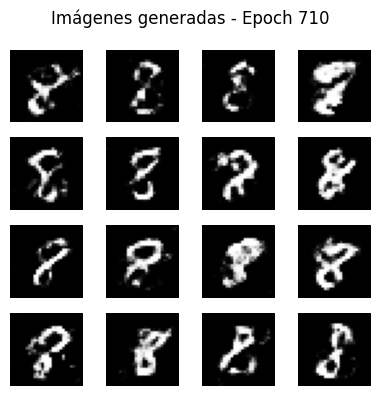

Epoch 711:  D_real: 0.7110, D_fake: 0.7108, G: 1.1196
Epoch 712:  D_real: 0.7108, D_fake: 0.7106, G: 1.1195
Epoch 713:  D_real: 0.7107, D_fake: 0.7105, G: 1.1196
Epoch 714:  D_real: 0.7106, D_fake: 0.7103, G: 1.1197
Epoch 715:  D_real: 0.7103, D_fake: 0.7101, G: 1.1196
Epoch 716:  D_real: 0.7100, D_fake: 0.7100, G: 1.1193
Epoch 717:  D_real: 0.7099, D_fake: 0.7101, G: 1.1191
Epoch 718:  D_real: 0.7102, D_fake: 0.7101, G: 1.1189
Epoch 719:  D_real: 0.7102, D_fake: 0.7103, G: 1.1187
Epoch 720:  D_real: 0.7105, D_fake: 0.7104, G: 1.1185
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


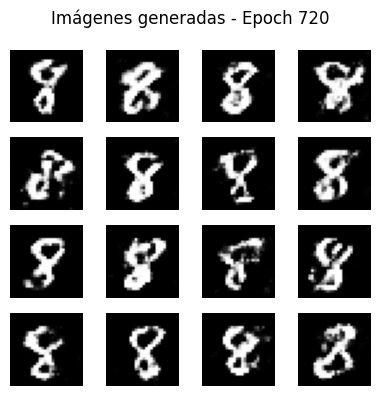

Epoch 721:  D_real: 0.7106, D_fake: 0.7105, G: 1.1184
Epoch 722:  D_real: 0.7105, D_fake: 0.7104, G: 1.1183
Epoch 723:  D_real: 0.7104, D_fake: 0.7103, G: 1.1183
Epoch 724:  D_real: 0.7103, D_fake: 0.7101, G: 1.1183
Epoch 725:  D_real: 0.7101, D_fake: 0.7099, G: 1.1183
Epoch 726:  D_real: 0.7099, D_fake: 0.7097, G: 1.1184
Epoch 727:  D_real: 0.7097, D_fake: 0.7096, G: 1.1184
Epoch 728:  D_real: 0.7095, D_fake: 0.7095, G: 1.1180
Epoch 729:  D_real: 0.7097, D_fake: 0.7096, G: 1.1178
Epoch 730:  D_real: 0.7097, D_fake: 0.7096, G: 1.1175
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


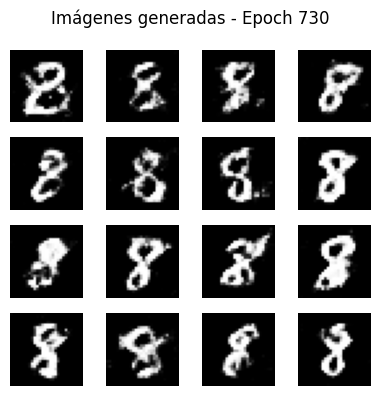

Epoch 731:  D_real: 0.7097, D_fake: 0.7096, G: 1.1172
Epoch 732:  D_real: 0.7097, D_fake: 0.7097, G: 1.1170
Epoch 733:  D_real: 0.7098, D_fake: 0.7097, G: 1.1168
Epoch 734:  D_real: 0.7098, D_fake: 0.7098, G: 1.1166
Epoch 735:  D_real: 0.7098, D_fake: 0.7098, G: 1.1165
Epoch 736:  D_real: 0.7099, D_fake: 0.7097, G: 1.1166
Epoch 737:  D_real: 0.7098, D_fake: 0.7097, G: 1.1166
Epoch 738:  D_real: 0.7098, D_fake: 0.7096, G: 1.1166
Epoch 739:  D_real: 0.7097, D_fake: 0.7095, G: 1.1166
Epoch 740:  D_real: 0.7095, D_fake: 0.7093, G: 1.1167
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


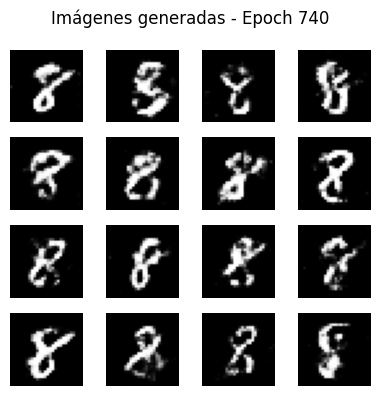

Epoch 741:  D_real: 0.7093, D_fake: 0.7091, G: 1.1167
Epoch 742:  D_real: 0.7092, D_fake: 0.7091, G: 1.1167
Epoch 743:  D_real: 0.7092, D_fake: 0.7091, G: 1.1166
Epoch 744:  D_real: 0.7092, D_fake: 0.7091, G: 1.1163
Epoch 745:  D_real: 0.7092, D_fake: 0.7091, G: 1.1162
Epoch 746:  D_real: 0.7090, D_fake: 0.7090, G: 1.1158
Epoch 747:  D_real: 0.7092, D_fake: 0.7091, G: 1.1160
Epoch 748:  D_real: 0.7092, D_fake: 0.7092, G: 1.1157
Epoch 749:  D_real: 0.7093, D_fake: 0.7092, G: 1.1157
Epoch 750:  D_real: 0.7093, D_fake: 0.7093, G: 1.1156
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


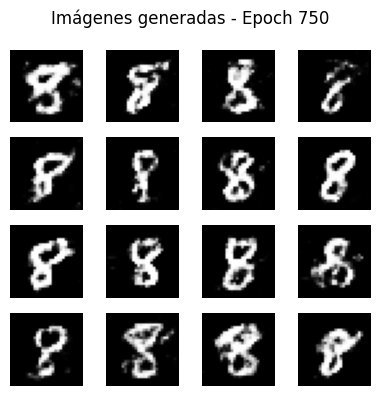

Epoch 751:  D_real: 0.7093, D_fake: 0.7094, G: 1.1154
Epoch 752:  D_real: 0.7095, D_fake: 0.7095, G: 1.1153
Epoch 753:  D_real: 0.7095, D_fake: 0.7094, G: 1.1153
Epoch 754:  D_real: 0.7095, D_fake: 0.7093, G: 1.1154
Epoch 755:  D_real: 0.7094, D_fake: 0.7092, G: 1.1155
Epoch 756:  D_real: 0.7093, D_fake: 0.7091, G: 1.1155
Epoch 757:  D_real: 0.7091, D_fake: 0.7090, G: 1.1154
Epoch 758:  D_real: 0.7090, D_fake: 0.7091, G: 1.1151
Epoch 759:  D_real: 0.7090, D_fake: 0.7088, G: 1.1153
Epoch 760:  D_real: 0.7088, D_fake: 0.7087, G: 1.1152
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


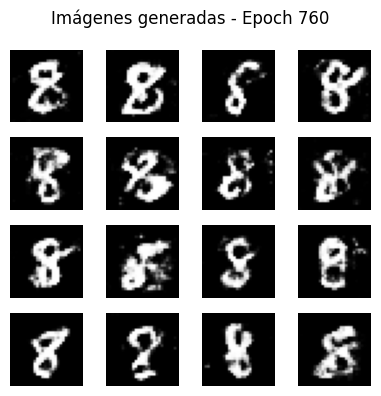

Epoch 761:  D_real: 0.7088, D_fake: 0.7087, G: 1.1152
Epoch 762:  D_real: 0.7088, D_fake: 0.7088, G: 1.1150
Epoch 763:  D_real: 0.7089, D_fake: 0.7089, G: 1.1149
Epoch 764:  D_real: 0.7091, D_fake: 0.7090, G: 1.1146
Epoch 765:  D_real: 0.7090, D_fake: 0.7090, G: 1.1144
Epoch 766:  D_real: 0.7091, D_fake: 0.7090, G: 1.1143
Epoch 767:  D_real: 0.7089, D_fake: 0.7088, G: 1.1143
Epoch 768:  D_real: 0.7088, D_fake: 0.7087, G: 1.1143
Epoch 769:  D_real: 0.7088, D_fake: 0.7086, G: 1.1144
Epoch 770:  D_real: 0.7088, D_fake: 0.7086, G: 1.1143
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step


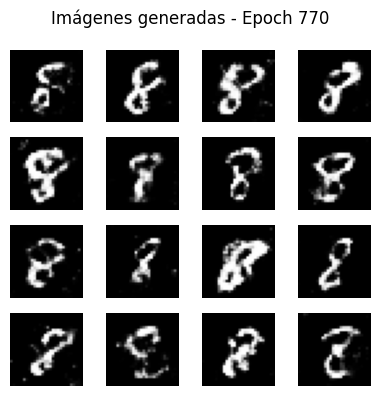

Epoch 771:  D_real: 0.7086, D_fake: 0.7084, G: 1.1144
Epoch 772:  D_real: 0.7084, D_fake: 0.7083, G: 1.1144
Epoch 773:  D_real: 0.7083, D_fake: 0.7082, G: 1.1144
Epoch 774:  D_real: 0.7082, D_fake: 0.7082, G: 1.1142
Epoch 775:  D_real: 0.7081, D_fake: 0.7080, G: 1.1141
Epoch 776:  D_real: 0.7081, D_fake: 0.7081, G: 1.1139
Epoch 777:  D_real: 0.7082, D_fake: 0.7080, G: 1.1138
Epoch 778:  D_real: 0.7080, D_fake: 0.7080, G: 1.1137
Epoch 779:  D_real: 0.7081, D_fake: 0.7081, G: 1.1135
Epoch 780:  D_real: 0.7082, D_fake: 0.7082, G: 1.1133
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


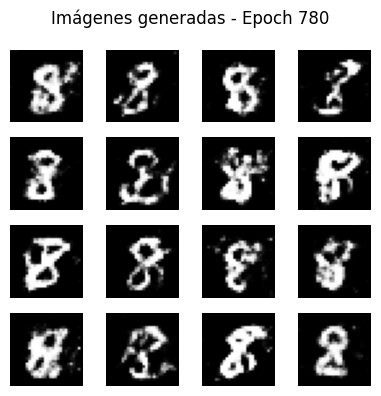

Epoch 781:  D_real: 0.7084, D_fake: 0.7085, G: 1.1131
Epoch 782:  D_real: 0.7087, D_fake: 0.7087, G: 1.1130
Epoch 783:  D_real: 0.7088, D_fake: 0.7088, G: 1.1129
Epoch 784:  D_real: 0.7089, D_fake: 0.7087, G: 1.1130
Epoch 785:  D_real: 0.7088, D_fake: 0.7086, G: 1.1130
Epoch 786:  D_real: 0.7086, D_fake: 0.7084, G: 1.1130
Epoch 787:  D_real: 0.7084, D_fake: 0.7083, G: 1.1129
Epoch 788:  D_real: 0.7083, D_fake: 0.7081, G: 1.1127
Epoch 789:  D_real: 0.7082, D_fake: 0.7081, G: 1.1126
Epoch 790:  D_real: 0.7081, D_fake: 0.7080, G: 1.1124
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


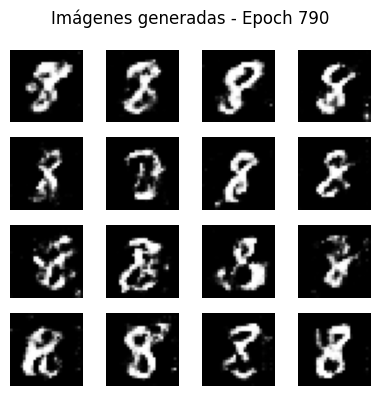

Epoch 791:  D_real: 0.7081, D_fake: 0.7081, G: 1.1124
Epoch 792:  D_real: 0.7081, D_fake: 0.7082, G: 1.1123
Epoch 793:  D_real: 0.7083, D_fake: 0.7082, G: 1.1122
Epoch 794:  D_real: 0.7083, D_fake: 0.7082, G: 1.1121
Epoch 795:  D_real: 0.7082, D_fake: 0.7082, G: 1.1120
Epoch 796:  D_real: 0.7082, D_fake: 0.7080, G: 1.1121
Epoch 797:  D_real: 0.7082, D_fake: 0.7081, G: 1.1120
Epoch 798:  D_real: 0.7081, D_fake: 0.7079, G: 1.1122
Epoch 799:  D_real: 0.7079, D_fake: 0.7077, G: 1.1123
Epoch 800:  D_real: 0.7077, D_fake: 0.7076, G: 1.1124
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


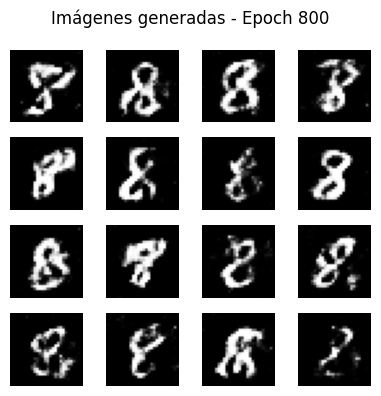

Epoch 801:  D_real: 0.7075, D_fake: 0.7074, G: 1.1122
Epoch 802:  D_real: 0.7074, D_fake: 0.7075, G: 1.1119
Epoch 803:  D_real: 0.7075, D_fake: 0.7074, G: 1.1116
Epoch 804:  D_real: 0.7074, D_fake: 0.7074, G: 1.1115
Epoch 805:  D_real: 0.7075, D_fake: 0.7075, G: 1.1115
Epoch 806:  D_real: 0.7075, D_fake: 0.7075, G: 1.1114
Epoch 807:  D_real: 0.7076, D_fake: 0.7077, G: 1.1111
Epoch 808:  D_real: 0.7078, D_fake: 0.7078, G: 1.1109
Epoch 809:  D_real: 0.7079, D_fake: 0.7080, G: 1.1107
Epoch 810:  D_real: 0.7082, D_fake: 0.7081, G: 1.1107
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


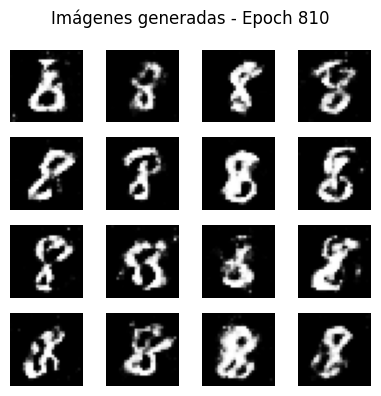

Epoch 811:  D_real: 0.7082, D_fake: 0.7081, G: 1.1107
Epoch 812:  D_real: 0.7082, D_fake: 0.7080, G: 1.1109
Epoch 813:  D_real: 0.7081, D_fake: 0.7080, G: 1.1110
Epoch 814:  D_real: 0.7080, D_fake: 0.7078, G: 1.1112
Epoch 815:  D_real: 0.7078, D_fake: 0.7075, G: 1.1111
Epoch 816:  D_real: 0.7075, D_fake: 0.7073, G: 1.1111
Epoch 817:  D_real: 0.7073, D_fake: 0.7073, G: 1.1110
Epoch 818:  D_real: 0.7073, D_fake: 0.7075, G: 1.1107
Epoch 819:  D_real: 0.7074, D_fake: 0.7075, G: 1.1106
Epoch 820:  D_real: 0.7076, D_fake: 0.7075, G: 1.1104
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


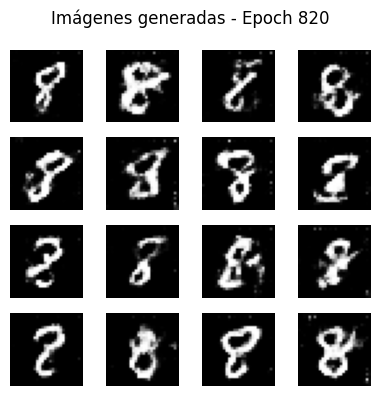

Epoch 821:  D_real: 0.7076, D_fake: 0.7073, G: 1.1106
Epoch 822:  D_real: 0.7073, D_fake: 0.7071, G: 1.1107
Epoch 823:  D_real: 0.7071, D_fake: 0.7069, G: 1.1107
Epoch 824:  D_real: 0.7068, D_fake: 0.7067, G: 1.1106
Epoch 825:  D_real: 0.7067, D_fake: 0.7067, G: 1.1104
Epoch 826:  D_real: 0.7067, D_fake: 0.7068, G: 1.1101
Epoch 827:  D_real: 0.7068, D_fake: 0.7069, G: 1.1098
Epoch 828:  D_real: 0.7070, D_fake: 0.7070, G: 1.1097
Epoch 829:  D_real: 0.7070, D_fake: 0.7070, G: 1.1097
Epoch 830:  D_real: 0.7070, D_fake: 0.7069, G: 1.1097
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


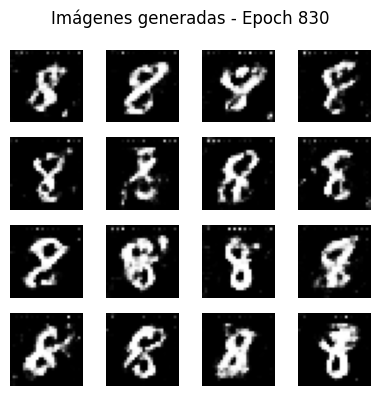

Epoch 831:  D_real: 0.7070, D_fake: 0.7068, G: 1.1099
Epoch 832:  D_real: 0.7070, D_fake: 0.7067, G: 1.1101
Epoch 833:  D_real: 0.7068, D_fake: 0.7065, G: 1.1106
Epoch 834:  D_real: 0.7064, D_fake: 0.7061, G: 1.1110
Epoch 835:  D_real: 0.7061, D_fake: 0.7058, G: 1.1112
Epoch 836:  D_real: 0.7057, D_fake: 0.7057, G: 1.1111
Epoch 837:  D_real: 0.7056, D_fake: 0.7057, G: 1.1107
Epoch 838:  D_real: 0.7056, D_fake: 0.7057, G: 1.1104
Epoch 839:  D_real: 0.7057, D_fake: 0.7058, G: 1.1102
Epoch 840:  D_real: 0.7060, D_fake: 0.7061, G: 1.1099
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


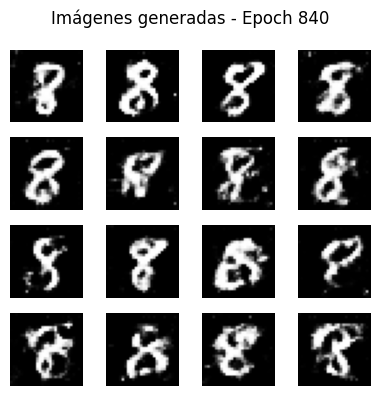

Epoch 841:  D_real: 0.7062, D_fake: 0.7061, G: 1.1097
Epoch 842:  D_real: 0.7062, D_fake: 0.7060, G: 1.1099
Epoch 843:  D_real: 0.7062, D_fake: 0.7060, G: 1.1102
Epoch 844:  D_real: 0.7060, D_fake: 0.7057, G: 1.1105
Epoch 845:  D_real: 0.7058, D_fake: 0.7056, G: 1.1105
Epoch 846:  D_real: 0.7056, D_fake: 0.7054, G: 1.1105
Epoch 847:  D_real: 0.7053, D_fake: 0.7051, G: 1.1106
Epoch 848:  D_real: 0.7050, D_fake: 0.7049, G: 1.1105
Epoch 849:  D_real: 0.7049, D_fake: 0.7050, G: 1.1102
Epoch 850:  D_real: 0.7050, D_fake: 0.7051, G: 1.1100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


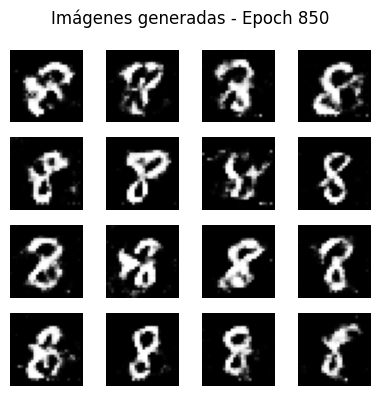

Epoch 851:  D_real: 0.7051, D_fake: 0.7050, G: 1.1098
Epoch 852:  D_real: 0.7051, D_fake: 0.7050, G: 1.1097
Epoch 853:  D_real: 0.7051, D_fake: 0.7050, G: 1.1096
Epoch 854:  D_real: 0.7051, D_fake: 0.7050, G: 1.1094
Epoch 855:  D_real: 0.7052, D_fake: 0.7051, G: 1.1093
Epoch 856:  D_real: 0.7051, D_fake: 0.7050, G: 1.1092
Epoch 857:  D_real: 0.7051, D_fake: 0.7050, G: 1.1092
Epoch 858:  D_real: 0.7050, D_fake: 0.7049, G: 1.1092
Epoch 859:  D_real: 0.7050, D_fake: 0.7048, G: 1.1093
Epoch 860:  D_real: 0.7049, D_fake: 0.7049, G: 1.1091
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


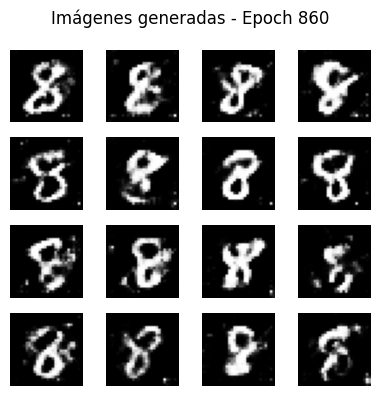

Epoch 861:  D_real: 0.7049, D_fake: 0.7049, G: 1.1090
Epoch 862:  D_real: 0.7048, D_fake: 0.7049, G: 1.1087
Epoch 863:  D_real: 0.7050, D_fake: 0.7049, G: 1.1086
Epoch 864:  D_real: 0.7049, D_fake: 0.7047, G: 1.1086
Epoch 865:  D_real: 0.7046, D_fake: 0.7045, G: 1.1086
Epoch 866:  D_real: 0.7046, D_fake: 0.7044, G: 1.1088
Epoch 867:  D_real: 0.7045, D_fake: 0.7043, G: 1.1087
Epoch 868:  D_real: 0.7044, D_fake: 0.7044, G: 1.1084
Epoch 869:  D_real: 0.7044, D_fake: 0.7043, G: 1.1083
Epoch 870:  D_real: 0.7043, D_fake: 0.7044, G: 1.1081
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


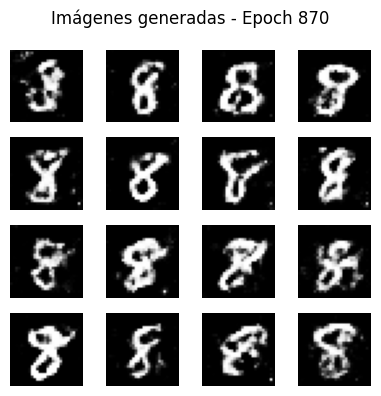

Epoch 871:  D_real: 0.7044, D_fake: 0.7044, G: 1.1080
Epoch 872:  D_real: 0.7044, D_fake: 0.7044, G: 1.1080
Epoch 873:  D_real: 0.7044, D_fake: 0.7041, G: 1.1082
Epoch 874:  D_real: 0.7041, D_fake: 0.7039, G: 1.1083
Epoch 875:  D_real: 0.7040, D_fake: 0.7038, G: 1.1083
Epoch 876:  D_real: 0.7038, D_fake: 0.7036, G: 1.1082
Epoch 877:  D_real: 0.7037, D_fake: 0.7037, G: 1.1080
Epoch 878:  D_real: 0.7038, D_fake: 0.7038, G: 1.1079
Epoch 879:  D_real: 0.7038, D_fake: 0.7037, G: 1.1078
Epoch 880:  D_real: 0.7038, D_fake: 0.7038, G: 1.1077
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


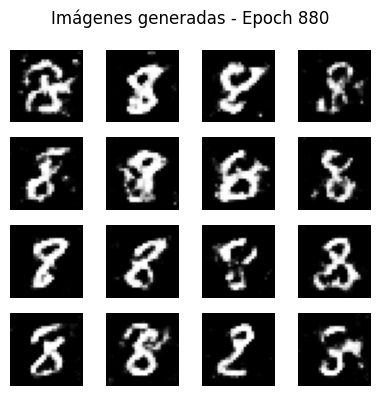

Epoch 881:  D_real: 0.7039, D_fake: 0.7039, G: 1.1077
Epoch 882:  D_real: 0.7040, D_fake: 0.7039, G: 1.1075
Epoch 883:  D_real: 0.7040, D_fake: 0.7039, G: 1.1076
Epoch 884:  D_real: 0.7039, D_fake: 0.7037, G: 1.1077
Epoch 885:  D_real: 0.7038, D_fake: 0.7037, G: 1.1077
Epoch 886:  D_real: 0.7037, D_fake: 0.7036, G: 1.1077
Epoch 887:  D_real: 0.7036, D_fake: 0.7035, G: 1.1077
Epoch 888:  D_real: 0.7036, D_fake: 0.7036, G: 1.1076
Epoch 889:  D_real: 0.7036, D_fake: 0.7036, G: 1.1073
Epoch 890:  D_real: 0.7037, D_fake: 0.7038, G: 1.1070
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


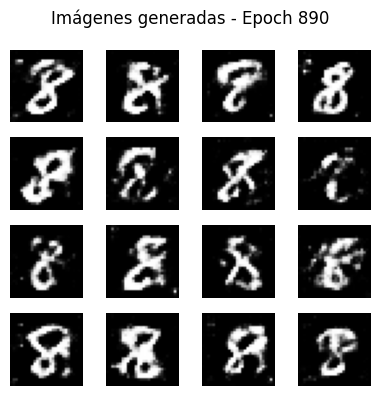

Epoch 891:  D_real: 0.7040, D_fake: 0.7040, G: 1.1069
Epoch 892:  D_real: 0.7041, D_fake: 0.7040, G: 1.1069
Epoch 893:  D_real: 0.7041, D_fake: 0.7039, G: 1.1068
Epoch 894:  D_real: 0.7041, D_fake: 0.7039, G: 1.1070
Epoch 895:  D_real: 0.7040, D_fake: 0.7037, G: 1.1072
Epoch 896:  D_real: 0.7037, D_fake: 0.7034, G: 1.1075
Epoch 897:  D_real: 0.7035, D_fake: 0.7032, G: 1.1079
Epoch 898:  D_real: 0.7031, D_fake: 0.7030, G: 1.1078
Epoch 899:  D_real: 0.7028, D_fake: 0.7027, G: 1.1077
Epoch 900:  D_real: 0.7026, D_fake: 0.7025, G: 1.1077
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


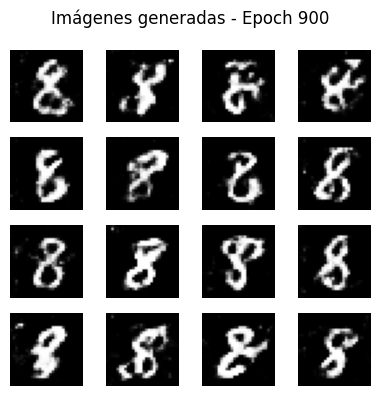

Epoch 901:  D_real: 0.7026, D_fake: 0.7026, G: 1.1075
Epoch 902:  D_real: 0.7026, D_fake: 0.7027, G: 1.1073
Epoch 903:  D_real: 0.7027, D_fake: 0.7028, G: 1.1071
Epoch 904:  D_real: 0.7030, D_fake: 0.7031, G: 1.1070
Epoch 905:  D_real: 0.7032, D_fake: 0.7031, G: 1.1071
Epoch 906:  D_real: 0.7033, D_fake: 0.7032, G: 1.1070
Epoch 907:  D_real: 0.7032, D_fake: 0.7031, G: 1.1070
Epoch 908:  D_real: 0.7032, D_fake: 0.7030, G: 1.1069
Epoch 909:  D_real: 0.7031, D_fake: 0.7029, G: 1.1071
Epoch 910:  D_real: 0.7030, D_fake: 0.7028, G: 1.1071
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


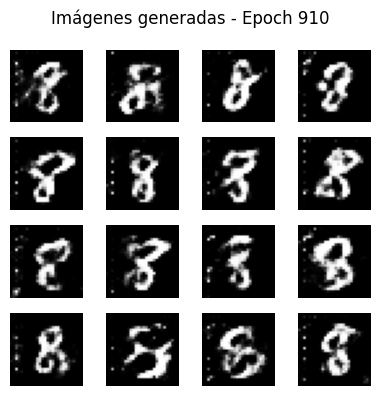

Epoch 911:  D_real: 0.7028, D_fake: 0.7028, G: 1.1070
Epoch 912:  D_real: 0.7028, D_fake: 0.7027, G: 1.1069
Epoch 913:  D_real: 0.7027, D_fake: 0.7027, G: 1.1066
Epoch 914:  D_real: 0.7029, D_fake: 0.7029, G: 1.1064
Epoch 915:  D_real: 0.7029, D_fake: 0.7030, G: 1.1064
Epoch 916:  D_real: 0.7031, D_fake: 0.7031, G: 1.1062
Epoch 917:  D_real: 0.7032, D_fake: 0.7031, G: 1.1061
Epoch 918:  D_real: 0.7032, D_fake: 0.7031, G: 1.1061
Epoch 919:  D_real: 0.7031, D_fake: 0.7030, G: 1.1063
Epoch 920:  D_real: 0.7030, D_fake: 0.7028, G: 1.1065
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


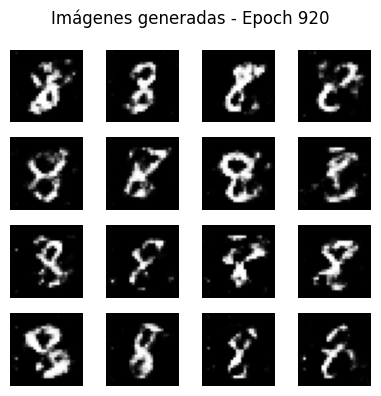

Epoch 921:  D_real: 0.7029, D_fake: 0.7027, G: 1.1067
Epoch 922:  D_real: 0.7027, D_fake: 0.7025, G: 1.1068
Epoch 923:  D_real: 0.7025, D_fake: 0.7023, G: 1.1069
Epoch 924:  D_real: 0.7023, D_fake: 0.7023, G: 1.1067
Epoch 925:  D_real: 0.7022, D_fake: 0.7023, G: 1.1066
Epoch 926:  D_real: 0.7023, D_fake: 0.7023, G: 1.1065
Epoch 927:  D_real: 0.7022, D_fake: 0.7022, G: 1.1063
Epoch 928:  D_real: 0.7022, D_fake: 0.7021, G: 1.1060
Epoch 929:  D_real: 0.7023, D_fake: 0.7023, G: 1.1059
Epoch 930:  D_real: 0.7024, D_fake: 0.7024, G: 1.1058
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


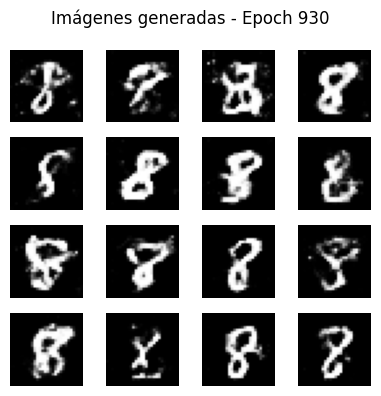

Epoch 931:  D_real: 0.7026, D_fake: 0.7026, G: 1.1057
Epoch 932:  D_real: 0.7027, D_fake: 0.7026, G: 1.1056
Epoch 933:  D_real: 0.7027, D_fake: 0.7026, G: 1.1057
Epoch 934:  D_real: 0.7026, D_fake: 0.7024, G: 1.1059
Epoch 935:  D_real: 0.7025, D_fake: 0.7023, G: 1.1061
Epoch 936:  D_real: 0.7022, D_fake: 0.7020, G: 1.1063
Epoch 937:  D_real: 0.7020, D_fake: 0.7019, G: 1.1063
Epoch 938:  D_real: 0.7018, D_fake: 0.7016, G: 1.1062
Epoch 939:  D_real: 0.7015, D_fake: 0.7015, G: 1.1060
Epoch 940:  D_real: 0.7015, D_fake: 0.7016, G: 1.1058
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


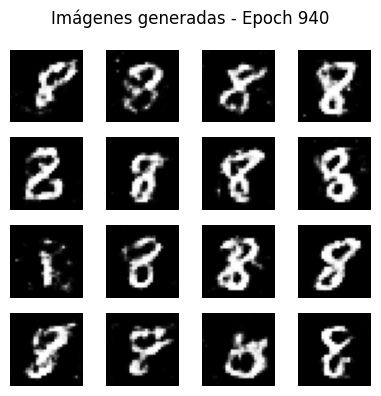

Epoch 941:  D_real: 0.7016, D_fake: 0.7016, G: 1.1057
Epoch 942:  D_real: 0.7016, D_fake: 0.7018, G: 1.1053
Epoch 943:  D_real: 0.7019, D_fake: 0.7020, G: 1.1051
Epoch 944:  D_real: 0.7020, D_fake: 0.7020, G: 1.1051
Epoch 945:  D_real: 0.7020, D_fake: 0.7019, G: 1.1051
Epoch 946:  D_real: 0.7020, D_fake: 0.7019, G: 1.1051
Epoch 947:  D_real: 0.7020, D_fake: 0.7017, G: 1.1052
Epoch 948:  D_real: 0.7019, D_fake: 0.7017, G: 1.1054
Epoch 949:  D_real: 0.7017, D_fake: 0.7014, G: 1.1059
Epoch 950:  D_real: 0.7013, D_fake: 0.7012, G: 1.1059
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


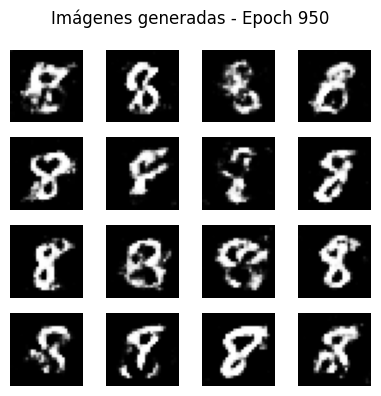

Epoch 951:  D_real: 0.7011, D_fake: 0.7011, G: 1.1058
Epoch 952:  D_real: 0.7010, D_fake: 0.7010, G: 1.1056
Epoch 953:  D_real: 0.7010, D_fake: 0.7010, G: 1.1055
Epoch 954:  D_real: 0.7011, D_fake: 0.7011, G: 1.1054
Epoch 955:  D_real: 0.7011, D_fake: 0.7012, G: 1.1052
Epoch 956:  D_real: 0.7013, D_fake: 0.7013, G: 1.1050
Epoch 957:  D_real: 0.7014, D_fake: 0.7015, G: 1.1048
Epoch 958:  D_real: 0.7016, D_fake: 0.7015, G: 1.1049
Epoch 959:  D_real: 0.7016, D_fake: 0.7015, G: 1.1051
Epoch 960:  D_real: 0.7016, D_fake: 0.7014, G: 1.1053
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


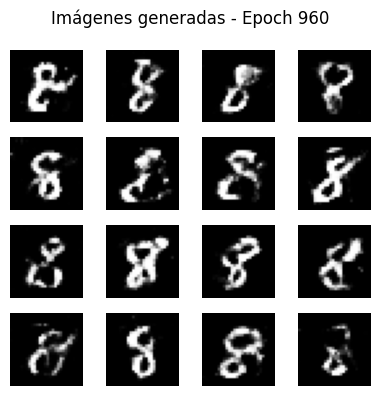

Epoch 961:  D_real: 0.7014, D_fake: 0.7011, G: 1.1054
Epoch 962:  D_real: 0.7012, D_fake: 0.7010, G: 1.1057
Epoch 963:  D_real: 0.7009, D_fake: 0.7008, G: 1.1057
Epoch 964:  D_real: 0.7008, D_fake: 0.7007, G: 1.1055
Epoch 965:  D_real: 0.7007, D_fake: 0.7007, G: 1.1053
Epoch 966:  D_real: 0.7007, D_fake: 0.7007, G: 1.1051
Epoch 967:  D_real: 0.7008, D_fake: 0.7007, G: 1.1051
Epoch 968:  D_real: 0.7008, D_fake: 0.7008, G: 1.1050
Epoch 969:  D_real: 0.7008, D_fake: 0.7007, G: 1.1051
Epoch 970:  D_real: 0.7007, D_fake: 0.7006, G: 1.1051
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


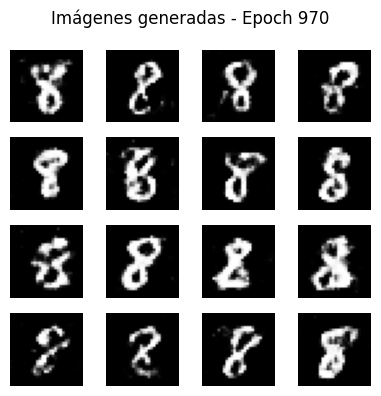

Epoch 971:  D_real: 0.7008, D_fake: 0.7006, G: 1.1052
Epoch 972:  D_real: 0.7006, D_fake: 0.7006, G: 1.1051
Epoch 973:  D_real: 0.7006, D_fake: 0.7005, G: 1.1052
Epoch 974:  D_real: 0.7004, D_fake: 0.7004, G: 1.1051
Epoch 975:  D_real: 0.7004, D_fake: 0.7002, G: 1.1053
Epoch 976:  D_real: 0.7003, D_fake: 0.7001, G: 1.1054
Epoch 977:  D_real: 0.7001, D_fake: 0.6999, G: 1.1054
Epoch 978:  D_real: 0.7000, D_fake: 0.7001, G: 1.1051
Epoch 979:  D_real: 0.7002, D_fake: 0.7003, G: 1.1048
Epoch 980:  D_real: 0.7004, D_fake: 0.7006, G: 1.1044
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step


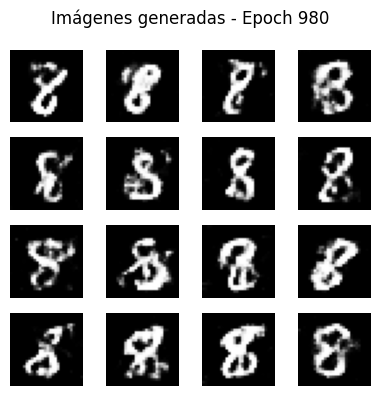

Epoch 981:  D_real: 0.7007, D_fake: 0.7006, G: 1.1044
Epoch 982:  D_real: 0.7009, D_fake: 0.7007, G: 1.1046
Epoch 983:  D_real: 0.7009, D_fake: 0.7006, G: 1.1050
Epoch 984:  D_real: 0.7006, D_fake: 0.7004, G: 1.1053
Epoch 985:  D_real: 0.7004, D_fake: 0.7002, G: 1.1057
Epoch 986:  D_real: 0.7001, D_fake: 0.6999, G: 1.1060
Epoch 987:  D_real: 0.6999, D_fake: 0.6997, G: 1.1061
Epoch 988:  D_real: 0.6996, D_fake: 0.6995, G: 1.1060
Epoch 989:  D_real: 0.6994, D_fake: 0.6994, G: 1.1057
Epoch 990:  D_real: 0.6993, D_fake: 0.6995, G: 1.1053
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


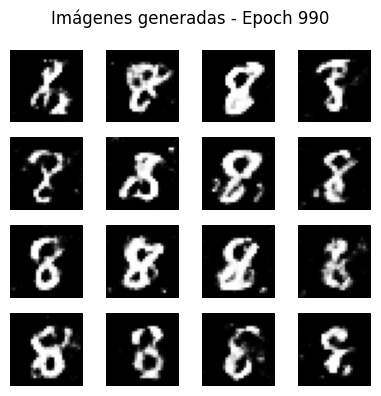

Epoch 991:  D_real: 0.6995, D_fake: 0.6996, G: 1.1050
Epoch 992:  D_real: 0.6997, D_fake: 0.6997, G: 1.1049
Epoch 993:  D_real: 0.6998, D_fake: 0.6998, G: 1.1048
Epoch 994:  D_real: 0.6999, D_fake: 0.6998, G: 1.1048
Epoch 995:  D_real: 0.6998, D_fake: 0.6996, G: 1.1050
Epoch 996:  D_real: 0.6997, D_fake: 0.6995, G: 1.1051
Epoch 997:  D_real: 0.6996, D_fake: 0.6994, G: 1.1053
Epoch 998:  D_real: 0.6994, D_fake: 0.6992, G: 1.1054
Epoch 999:  D_real: 0.6992, D_fake: 0.6992, G: 1.1052
Epoch 1000:  D_real: 0.6992, D_fake: 0.6993, G: 1.1050
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


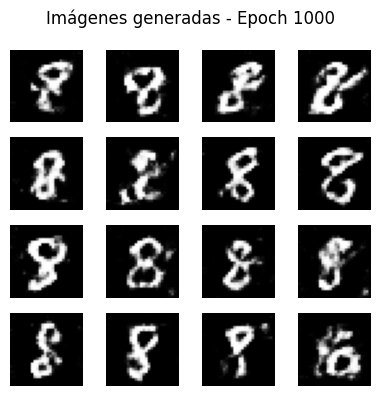

In [11]:
# Entrenamos 1000 epocs
entrenar_gan(1000)

### Mejor modelo en la epoca 669

Epoch 1: D_real: 0.6080, D_fake: 0.6640, G: 0.6352
Epoch 2: D_real: 0.5886, D_fake: 0.6625, G: 0.5096
Epoch 3: D_real: 0.6079, D_fake: 0.7055, G: 0.4455
Epoch 4: D_real: 0.6581, D_fake: 0.7207, G: 0.4521
Epoch 5: D_real: 0.6824, D_fake: 0.7342, G: 0.4755
Epoch 6: D_real: 0.7037, D_fake: 0.7075, G: 0.5081
Epoch 7: D_real: 0.6861, D_fake: 0.6860, G: 0.5549
Epoch 8: D_real: 0.6663, D_fake: 0.6751, G: 0.6037
Epoch 9: D_real: 0.6587, D_fake: 0.6537, G: 0.6387
Epoch 10: D_real: 0.6394, D_fake: 0.6353, G: 0.6735
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


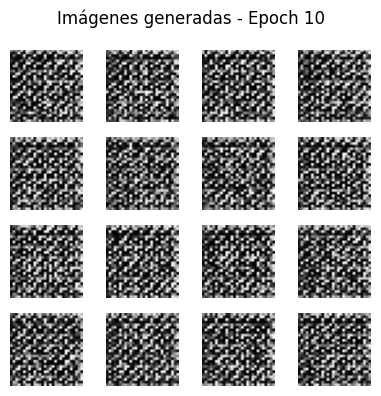

Epoch 11: D_real: 0.6241, D_fake: 0.6223, G: 0.7220
Epoch 12: D_real: 0.6136, D_fake: 0.6063, G: 0.7533
Epoch 13: D_real: 0.5987, D_fake: 0.5881, G: 0.7881
Epoch 14: D_real: 0.5832, D_fake: 0.5750, G: 0.8199
Epoch 15: D_real: 0.5697, D_fake: 0.5629, G: 0.8466
Epoch 16: D_real: 0.5577, D_fake: 0.5547, G: 0.8779
Epoch 17: D_real: 0.5514, D_fake: 0.5444, G: 0.9251
Epoch 18: D_real: 0.5410, D_fake: 0.5308, G: 0.9811
Epoch 19: D_real: 0.5282, D_fake: 0.5185, G: 1.0348
Epoch 20: D_real: 0.5159, D_fake: 0.5070, G: 1.0783
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


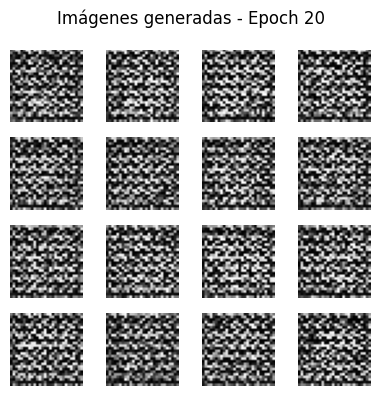

Epoch 21: D_real: 0.5047, D_fake: 0.4969, G: 1.1145
Epoch 22: D_real: 0.4949, D_fake: 0.4888, G: 1.1396
Epoch 23: D_real: 0.4858, D_fake: 0.4805, G: 1.1632
Epoch 24: D_real: 0.4786, D_fake: 0.4734, G: 1.1776
Epoch 25: D_real: 0.4722, D_fake: 0.4689, G: 1.1911
Epoch 26: D_real: 0.4686, D_fake: 0.4665, G: 1.2001
Epoch 27: D_real: 0.4652, D_fake: 0.4623, G: 1.2193
Epoch 28: D_real: 0.4624, D_fake: 0.4599, G: 1.2281
Epoch 29: D_real: 0.4604, D_fake: 0.4561, G: 1.2436
Epoch 30: D_real: 0.4559, D_fake: 0.4515, G: 1.2624
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


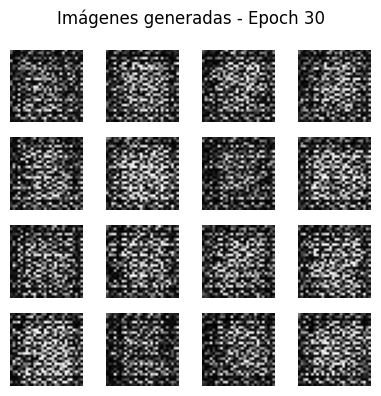

Epoch 31: D_real: 0.4515, D_fake: 0.4472, G: 1.2809
Epoch 32: D_real: 0.4470, D_fake: 0.4440, G: 1.2935
Epoch 33: D_real: 0.4444, D_fake: 0.4412, G: 1.3086
Epoch 34: D_real: 0.4411, D_fake: 0.4381, G: 1.3262
Epoch 35: D_real: 0.4387, D_fake: 0.4354, G: 1.3401
Epoch 36: D_real: 0.4353, D_fake: 0.4323, G: 1.3650
Epoch 37: D_real: 0.4323, D_fake: 0.4287, G: 1.3848
Epoch 38: D_real: 0.4289, D_fake: 0.4252, G: 1.4030
Epoch 39: D_real: 0.4254, D_fake: 0.4221, G: 1.4203
Epoch 40: D_real: 0.4226, D_fake: 0.4199, G: 1.4382
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


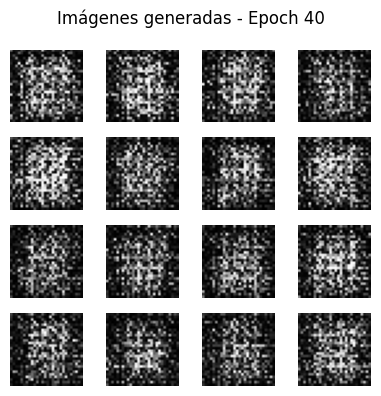

Epoch 41: D_real: 0.4203, D_fake: 0.4180, G: 1.4493
Epoch 42: D_real: 0.4193, D_fake: 0.4178, G: 1.4583
Epoch 43: D_real: 0.4181, D_fake: 0.4151, G: 1.4687
Epoch 44: D_real: 0.4157, D_fake: 0.4129, G: 1.4864
Epoch 45: D_real: 0.4137, D_fake: 0.4111, G: 1.5059
Epoch 46: D_real: 0.4117, D_fake: 0.4093, G: 1.5198
Epoch 47: D_real: 0.4098, D_fake: 0.4079, G: 1.5298
Epoch 48: D_real: 0.4086, D_fake: 0.4113, G: 1.5290
Epoch 49: D_real: 0.4128, D_fake: 0.4126, G: 1.5311
Epoch 50: D_real: 0.4149, D_fake: 0.4149, G: 1.5353
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


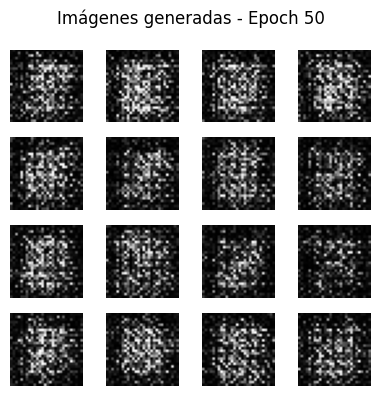

Epoch 51: D_real: 0.4156, D_fake: 0.4145, G: 1.5407
Epoch 52: D_real: 0.4165, D_fake: 0.4145, G: 1.5467
Epoch 53: D_real: 0.4161, D_fake: 0.4146, G: 1.5506
Epoch 54: D_real: 0.4168, D_fake: 0.4149, G: 1.5580
Epoch 55: D_real: 0.4165, D_fake: 0.4148, G: 1.5628
Epoch 56: D_real: 0.4160, D_fake: 0.4147, G: 1.5665
Epoch 57: D_real: 0.4161, D_fake: 0.4157, G: 1.5733
Epoch 58: D_real: 0.4166, D_fake: 0.4146, G: 1.5807
Epoch 59: D_real: 0.4160, D_fake: 0.4140, G: 1.5877
Epoch 60: D_real: 0.4150, D_fake: 0.4134, G: 1.5961
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


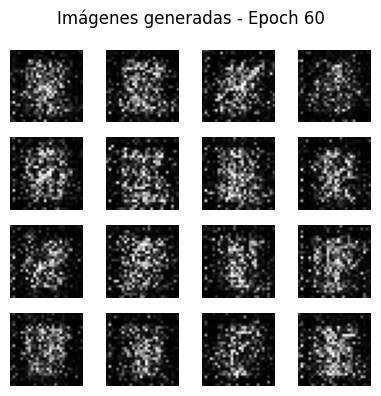

Epoch 61: D_real: 0.4142, D_fake: 0.4131, G: 1.6009
Epoch 62: D_real: 0.4148, D_fake: 0.4194, G: 1.5928
Epoch 63: D_real: 0.4207, D_fake: 0.4235, G: 1.5889
Epoch 64: D_real: 0.4268, D_fake: 0.4290, G: 1.5867
Epoch 65: D_real: 0.4335, D_fake: 0.4342, G: 1.5844
Epoch 66: D_real: 0.4364, D_fake: 0.4354, G: 1.5820
Epoch 67: D_real: 0.4371, D_fake: 0.4380, G: 1.5811
Epoch 68: D_real: 0.4404, D_fake: 0.4411, G: 1.5806
Epoch 69: D_real: 0.4436, D_fake: 0.4434, G: 1.5834
Epoch 70: D_real: 0.4459, D_fake: 0.4462, G: 1.5836
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step


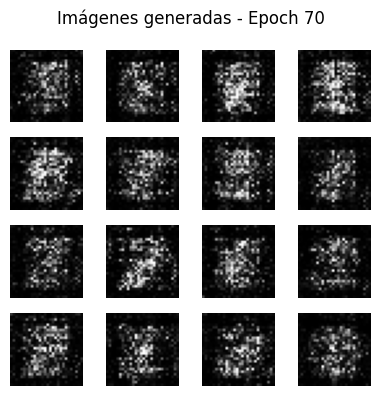

Epoch 71: D_real: 0.4477, D_fake: 0.4465, G: 1.5844
Epoch 72: D_real: 0.4493, D_fake: 0.4496, G: 1.5836
Epoch 73: D_real: 0.4530, D_fake: 0.4534, G: 1.5836
Epoch 74: D_real: 0.4552, D_fake: 0.4549, G: 1.5821
Epoch 75: D_real: 0.4573, D_fake: 0.4570, G: 1.5806
Epoch 76: D_real: 0.4596, D_fake: 0.4598, G: 1.5770
Epoch 77: D_real: 0.4621, D_fake: 0.4632, G: 1.5751
Epoch 78: D_real: 0.4666, D_fake: 0.4668, G: 1.5724
Epoch 79: D_real: 0.4690, D_fake: 0.4697, G: 1.5698
Epoch 80: D_real: 0.4723, D_fake: 0.4721, G: 1.5657
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


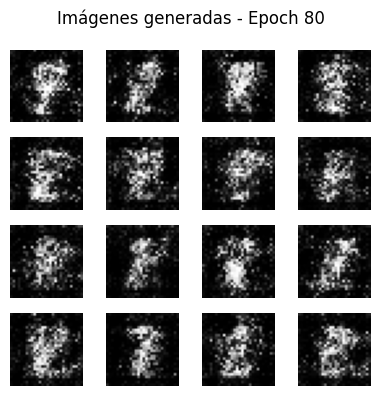

Epoch 81: D_real: 0.4751, D_fake: 0.4765, G: 1.5604
Epoch 82: D_real: 0.4788, D_fake: 0.4807, G: 1.5554
Epoch 83: D_real: 0.4837, D_fake: 0.4836, G: 1.5528
Epoch 84: D_real: 0.4861, D_fake: 0.4868, G: 1.5499
Epoch 85: D_real: 0.4901, D_fake: 0.4907, G: 1.5470
Epoch 86: D_real: 0.4937, D_fake: 0.4943, G: 1.5448
Epoch 87: D_real: 0.4968, D_fake: 0.4968, G: 1.5420
Epoch 88: D_real: 0.4992, D_fake: 0.4999, G: 1.5403
Epoch 89: D_real: 0.5025, D_fake: 0.5030, G: 1.5364
Epoch 90: D_real: 0.5053, D_fake: 0.5055, G: 1.5338
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step


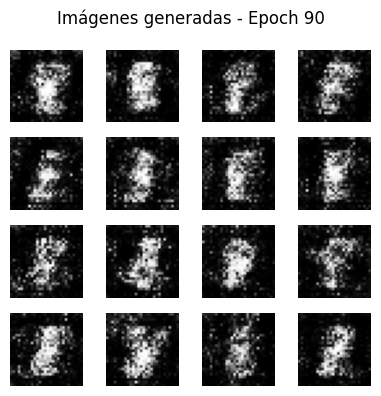

Epoch 91: D_real: 0.5085, D_fake: 0.5083, G: 1.5315
Epoch 92: D_real: 0.5112, D_fake: 0.5120, G: 1.5284
Epoch 93: D_real: 0.5146, D_fake: 0.5146, G: 1.5266
Epoch 94: D_real: 0.5171, D_fake: 0.5176, G: 1.5238
Epoch 95: D_real: 0.5189, D_fake: 0.5191, G: 1.5222
Epoch 96: D_real: 0.5218, D_fake: 0.5217, G: 1.5216
Epoch 97: D_real: 0.5241, D_fake: 0.5242, G: 1.5205
Epoch 98: D_real: 0.5262, D_fake: 0.5255, G: 1.5202
Epoch 99: D_real: 0.5266, D_fake: 0.5269, G: 1.5188
Epoch 100: D_real: 0.5294, D_fake: 0.5296, G: 1.5163
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


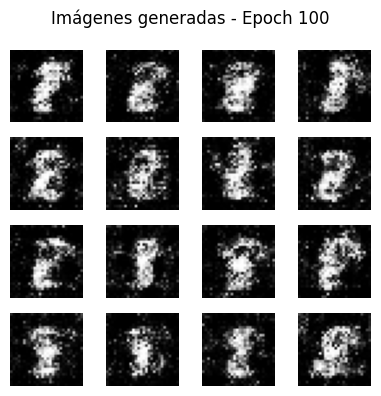

Epoch 101: D_real: 0.5315, D_fake: 0.5318, G: 1.5148
Epoch 102: D_real: 0.5333, D_fake: 0.5326, G: 1.5143
Epoch 103: D_real: 0.5353, D_fake: 0.5352, G: 1.5134
Epoch 104: D_real: 0.5363, D_fake: 0.5363, G: 1.5119
Epoch 105: D_real: 0.5373, D_fake: 0.5367, G: 1.5113
Epoch 106: D_real: 0.5385, D_fake: 0.5372, G: 1.5110
Epoch 107: D_real: 0.5383, D_fake: 0.5373, G: 1.5095
Epoch 108: D_real: 0.5382, D_fake: 0.5389, G: 1.5058
Epoch 109: D_real: 0.5393, D_fake: 0.5399, G: 1.5036
Epoch 110: D_real: 0.5424, D_fake: 0.5428, G: 1.5016
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


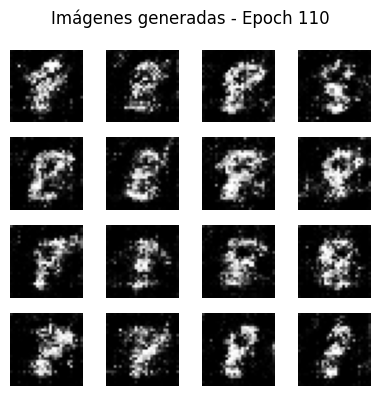

Epoch 111: D_real: 0.5445, D_fake: 0.5439, G: 1.5010
Epoch 112: D_real: 0.5457, D_fake: 0.5449, G: 1.5018
Epoch 113: D_real: 0.5462, D_fake: 0.5450, G: 1.5022
Epoch 114: D_real: 0.5465, D_fake: 0.5467, G: 1.4991
Epoch 115: D_real: 0.5477, D_fake: 0.5483, G: 1.4971
Epoch 116: D_real: 0.5494, D_fake: 0.5497, G: 1.4938
Epoch 117: D_real: 0.5505, D_fake: 0.5508, G: 1.4928
Epoch 118: D_real: 0.5519, D_fake: 0.5520, G: 1.4916
Epoch 119: D_real: 0.5538, D_fake: 0.5540, G: 1.4906
Epoch 120: D_real: 0.5559, D_fake: 0.5556, G: 1.4888
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


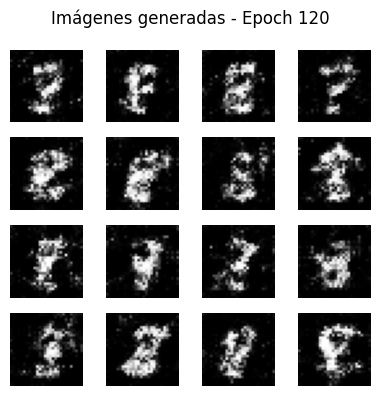

Epoch 121: D_real: 0.5575, D_fake: 0.5572, G: 1.4886
Epoch 122: D_real: 0.5578, D_fake: 0.5576, G: 1.4879
Epoch 123: D_real: 0.5583, D_fake: 0.5577, G: 1.4870
Epoch 124: D_real: 0.5587, D_fake: 0.5585, G: 1.4859
Epoch 125: D_real: 0.5601, D_fake: 0.5610, G: 1.4828
Epoch 126: D_real: 0.5612, D_fake: 0.5620, G: 1.4806
Epoch 127: D_real: 0.5636, D_fake: 0.5632, G: 1.4791
Epoch 128: D_real: 0.5652, D_fake: 0.5648, G: 1.4781
Epoch 129: D_real: 0.5659, D_fake: 0.5657, G: 1.4767
Epoch 130: D_real: 0.5670, D_fake: 0.5668, G: 1.4753
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step


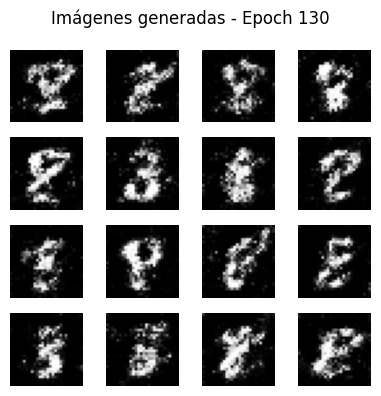

Epoch 131: D_real: 0.5677, D_fake: 0.5681, G: 1.4729
Epoch 132: D_real: 0.5691, D_fake: 0.5699, G: 1.4702
Epoch 133: D_real: 0.5706, D_fake: 0.5708, G: 1.4674
Epoch 134: D_real: 0.5724, D_fake: 0.5722, G: 1.4653
Epoch 135: D_real: 0.5737, D_fake: 0.5738, G: 1.4629
Epoch 136: D_real: 0.5745, D_fake: 0.5743, G: 1.4609
Epoch 137: D_real: 0.5759, D_fake: 0.5761, G: 1.4593
Epoch 138: D_real: 0.5768, D_fake: 0.5767, G: 1.4570
Epoch 139: D_real: 0.5775, D_fake: 0.5775, G: 1.4550
Epoch 140: D_real: 0.5788, D_fake: 0.5795, G: 1.4517
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


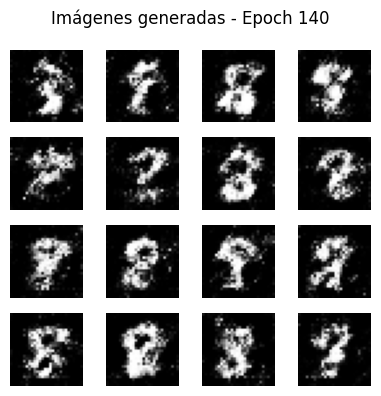

Epoch 141: D_real: 0.5803, D_fake: 0.5809, G: 1.4499
Epoch 142: D_real: 0.5825, D_fake: 0.5824, G: 1.4484
Epoch 143: D_real: 0.5839, D_fake: 0.5840, G: 1.4466
Epoch 144: D_real: 0.5855, D_fake: 0.5862, G: 1.4445
Epoch 145: D_real: 0.5869, D_fake: 0.5870, G: 1.4431
Epoch 146: D_real: 0.5882, D_fake: 0.5882, G: 1.4407
Epoch 147: D_real: 0.5894, D_fake: 0.5894, G: 1.4388
Epoch 148: D_real: 0.5902, D_fake: 0.5903, G: 1.4373
Epoch 149: D_real: 0.5914, D_fake: 0.5919, G: 1.4350
Epoch 150: D_real: 0.5929, D_fake: 0.5931, G: 1.4322
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


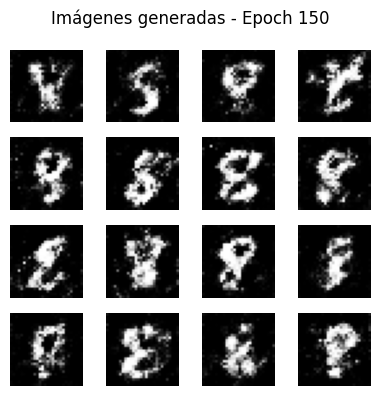

Epoch 151: D_real: 0.5941, D_fake: 0.5943, G: 1.4291
Epoch 152: D_real: 0.5954, D_fake: 0.5959, G: 1.4279
Epoch 153: D_real: 0.5965, D_fake: 0.5963, G: 1.4270
Epoch 154: D_real: 0.5977, D_fake: 0.5979, G: 1.4251
Epoch 155: D_real: 0.5989, D_fake: 0.5987, G: 1.4238
Epoch 156: D_real: 0.5996, D_fake: 0.5996, G: 1.4222
Epoch 157: D_real: 0.6000, D_fake: 0.6001, G: 1.4204
Epoch 158: D_real: 0.6011, D_fake: 0.6012, G: 1.4186
Epoch 159: D_real: 0.6019, D_fake: 0.6019, G: 1.4168
Epoch 160: D_real: 0.6027, D_fake: 0.6028, G: 1.4167
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


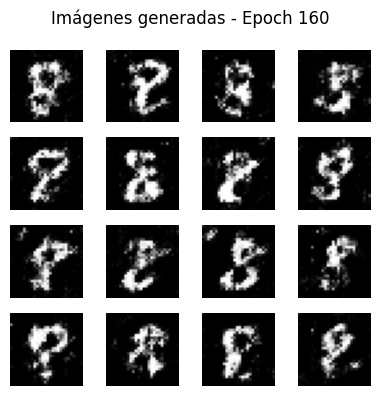

Epoch 161: D_real: 0.6037, D_fake: 0.6033, G: 1.4160
Epoch 162: D_real: 0.6041, D_fake: 0.6040, G: 1.4153
Epoch 163: D_real: 0.6041, D_fake: 0.6043, G: 1.4141
Epoch 164: D_real: 0.6050, D_fake: 0.6047, G: 1.4133
Epoch 165: D_real: 0.6055, D_fake: 0.6052, G: 1.4127
Epoch 166: D_real: 0.6058, D_fake: 0.6052, G: 1.4117
Epoch 167: D_real: 0.6056, D_fake: 0.6060, G: 1.4108
Epoch 168: D_real: 0.6065, D_fake: 0.6072, G: 1.4089
Epoch 169: D_real: 0.6081, D_fake: 0.6085, G: 1.4067
Epoch 170: D_real: 0.6094, D_fake: 0.6097, G: 1.4052
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


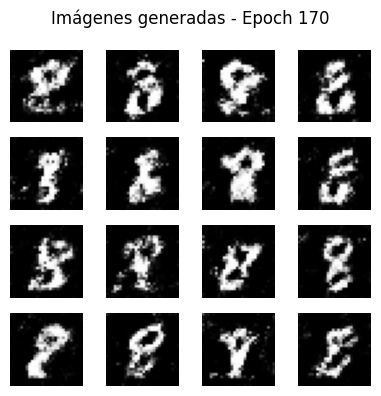

Epoch 171: D_real: 0.6108, D_fake: 0.6110, G: 1.4042
Epoch 172: D_real: 0.6124, D_fake: 0.6124, G: 1.4023
Epoch 173: D_real: 0.6134, D_fake: 0.6134, G: 1.4003
Epoch 174: D_real: 0.6141, D_fake: 0.6137, G: 1.3988
Epoch 175: D_real: 0.6145, D_fake: 0.6149, G: 1.3969
Epoch 176: D_real: 0.6155, D_fake: 0.6159, G: 1.3943
Epoch 177: D_real: 0.6164, D_fake: 0.6169, G: 1.3925
Epoch 178: D_real: 0.6180, D_fake: 0.6179, G: 1.3914
Epoch 179: D_real: 0.6188, D_fake: 0.6183, G: 1.3911
Epoch 180: D_real: 0.6191, D_fake: 0.6188, G: 1.3904
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


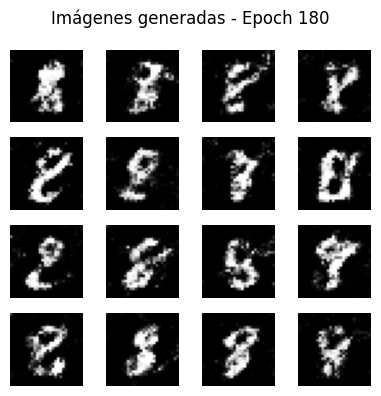

Epoch 181: D_real: 0.6192, D_fake: 0.6192, G: 1.3897
Epoch 182: D_real: 0.6196, D_fake: 0.6194, G: 1.3886
Epoch 183: D_real: 0.6198, D_fake: 0.6197, G: 1.3870
Epoch 184: D_real: 0.6202, D_fake: 0.6199, G: 1.3857
Epoch 185: D_real: 0.6201, D_fake: 0.6203, G: 1.3843
Epoch 186: D_real: 0.6207, D_fake: 0.6208, G: 1.3825
Epoch 187: D_real: 0.6213, D_fake: 0.6217, G: 1.3810
Epoch 188: D_real: 0.6225, D_fake: 0.6225, G: 1.3802
Epoch 189: D_real: 0.6234, D_fake: 0.6233, G: 1.3794
Epoch 190: D_real: 0.6242, D_fake: 0.6245, G: 1.3775
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


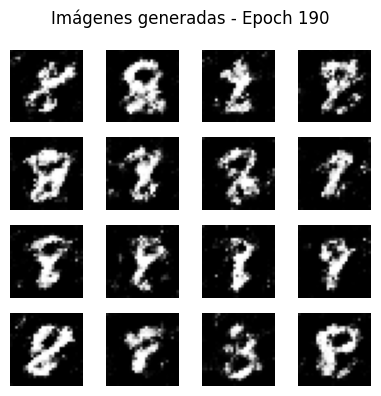

Epoch 191: D_real: 0.6253, D_fake: 0.6254, G: 1.3760
Epoch 192: D_real: 0.6266, D_fake: 0.6264, G: 1.3748
Epoch 193: D_real: 0.6271, D_fake: 0.6273, G: 1.3735
Epoch 194: D_real: 0.6276, D_fake: 0.6277, G: 1.3717
Epoch 195: D_real: 0.6279, D_fake: 0.6284, G: 1.3700
Epoch 196: D_real: 0.6292, D_fake: 0.6294, G: 1.3682
Epoch 197: D_real: 0.6301, D_fake: 0.6302, G: 1.3670
Epoch 198: D_real: 0.6309, D_fake: 0.6310, G: 1.3654
Epoch 199: D_real: 0.6320, D_fake: 0.6318, G: 1.3641
Epoch 200: D_real: 0.6324, D_fake: 0.6320, G: 1.3631
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


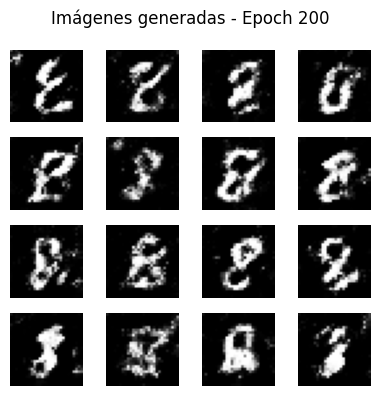

Epoch 201: D_real: 0.6324, D_fake: 0.6327, G: 1.3614
Epoch 202: D_real: 0.6330, D_fake: 0.6329, G: 1.3602
Epoch 203: D_real: 0.6336, D_fake: 0.6338, G: 1.3590
Epoch 204: D_real: 0.6343, D_fake: 0.6346, G: 1.3575
Epoch 205: D_real: 0.6350, D_fake: 0.6350, G: 1.3563
Epoch 206: D_real: 0.6358, D_fake: 0.6357, G: 1.3552
Epoch 207: D_real: 0.6360, D_fake: 0.6360, G: 1.3540
Epoch 208: D_real: 0.6365, D_fake: 0.6364, G: 1.3530
Epoch 209: D_real: 0.6368, D_fake: 0.6370, G: 1.3516
Epoch 210: D_real: 0.6372, D_fake: 0.6370, G: 1.3509
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


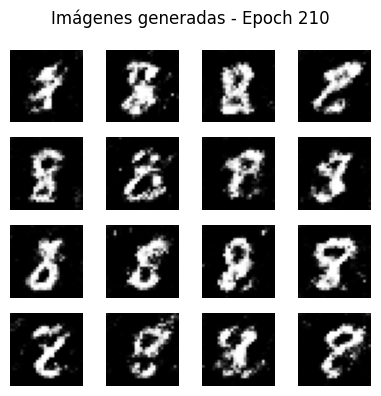

Epoch 211: D_real: 0.6377, D_fake: 0.6376, G: 1.3498
Epoch 212: D_real: 0.6383, D_fake: 0.6385, G: 1.3481
Epoch 213: D_real: 0.6390, D_fake: 0.6391, G: 1.3465
Epoch 214: D_real: 0.6398, D_fake: 0.6404, G: 1.3455
Epoch 215: D_real: 0.6411, D_fake: 0.6409, G: 1.3441
Epoch 216: D_real: 0.6415, D_fake: 0.6413, G: 1.3425
Epoch 217: D_real: 0.6417, D_fake: 0.6421, G: 1.3408
Epoch 218: D_real: 0.6428, D_fake: 0.6430, G: 1.3391
Epoch 219: D_real: 0.6436, D_fake: 0.6436, G: 1.3377
Epoch 220: D_real: 0.6443, D_fake: 0.6443, G: 1.3366
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


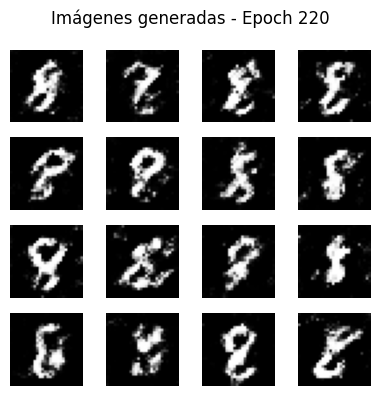

Epoch 221: D_real: 0.6449, D_fake: 0.6451, G: 1.3357
Epoch 222: D_real: 0.6455, D_fake: 0.6454, G: 1.3346
Epoch 223: D_real: 0.6457, D_fake: 0.6456, G: 1.3333
Epoch 224: D_real: 0.6463, D_fake: 0.6462, G: 1.3324
Epoch 225: D_real: 0.6467, D_fake: 0.6468, G: 1.3313
Epoch 226: D_real: 0.6473, D_fake: 0.6471, G: 1.3305
Epoch 227: D_real: 0.6475, D_fake: 0.6473, G: 1.3297
Epoch 228: D_real: 0.6479, D_fake: 0.6477, G: 1.3287
Epoch 229: D_real: 0.6481, D_fake: 0.6481, G: 1.3272
Epoch 230: D_real: 0.6484, D_fake: 0.6485, G: 1.3265
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


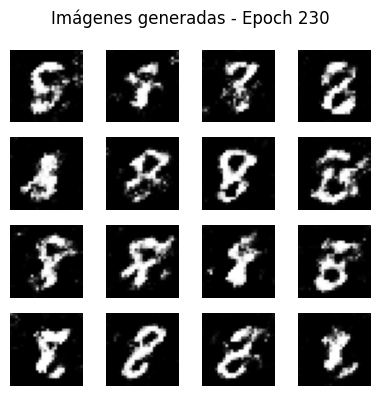

Epoch 231: D_real: 0.6489, D_fake: 0.6488, G: 1.3259
Epoch 232: D_real: 0.6492, D_fake: 0.6491, G: 1.3251
Epoch 233: D_real: 0.6496, D_fake: 0.6498, G: 1.3242
Epoch 234: D_real: 0.6502, D_fake: 0.6501, G: 1.3234
Epoch 235: D_real: 0.6504, D_fake: 0.6503, G: 1.3221
Epoch 236: D_real: 0.6505, D_fake: 0.6505, G: 1.3206
Epoch 237: D_real: 0.6510, D_fake: 0.6513, G: 1.3190
Epoch 238: D_real: 0.6519, D_fake: 0.6519, G: 1.3179
Epoch 239: D_real: 0.6527, D_fake: 0.6531, G: 1.3165
Epoch 240: D_real: 0.6538, D_fake: 0.6538, G: 1.3160
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


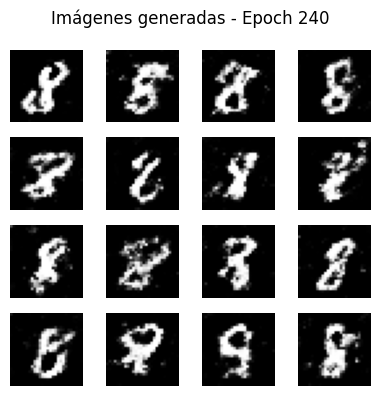

Epoch 241: D_real: 0.6545, D_fake: 0.6546, G: 1.3150
Epoch 242: D_real: 0.6549, D_fake: 0.6550, G: 1.3140
Epoch 243: D_real: 0.6552, D_fake: 0.6549, G: 1.3131
Epoch 244: D_real: 0.6553, D_fake: 0.6551, G: 1.3122
Epoch 245: D_real: 0.6555, D_fake: 0.6555, G: 1.3110
Epoch 246: D_real: 0.6557, D_fake: 0.6557, G: 1.3106
Epoch 247: D_real: 0.6561, D_fake: 0.6562, G: 1.3097
Epoch 248: D_real: 0.6565, D_fake: 0.6567, G: 1.3082
Epoch 249: D_real: 0.6570, D_fake: 0.6570, G: 1.3074
Epoch 250: D_real: 0.6574, D_fake: 0.6571, G: 1.3071
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


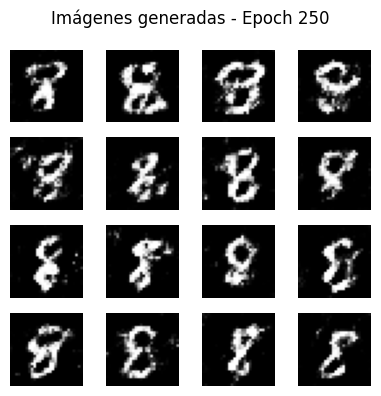

Epoch 251: D_real: 0.6582, D_fake: 0.6581, G: 1.3066
Epoch 252: D_real: 0.6586, D_fake: 0.6588, G: 1.3058
Epoch 253: D_real: 0.6589, D_fake: 0.6586, G: 1.3052
Epoch 254: D_real: 0.6592, D_fake: 0.6592, G: 1.3040
Epoch 255: D_real: 0.6592, D_fake: 0.6593, G: 1.3029
Epoch 256: D_real: 0.6596, D_fake: 0.6598, G: 1.3017
Epoch 257: D_real: 0.6601, D_fake: 0.6599, G: 1.3012
Epoch 258: D_real: 0.6603, D_fake: 0.6606, G: 1.3000
Epoch 259: D_real: 0.6609, D_fake: 0.6609, G: 1.2994
Epoch 260: D_real: 0.6613, D_fake: 0.6613, G: 1.2991
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


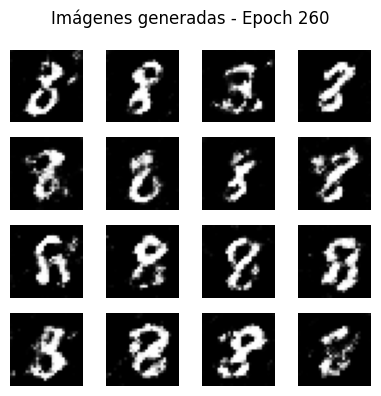

Epoch 261: D_real: 0.6619, D_fake: 0.6615, G: 1.2987
Epoch 262: D_real: 0.6622, D_fake: 0.6622, G: 1.2977
Epoch 263: D_real: 0.6625, D_fake: 0.6624, G: 1.2966
Epoch 264: D_real: 0.6626, D_fake: 0.6628, G: 1.2955
Epoch 265: D_real: 0.6633, D_fake: 0.6635, G: 1.2943
Epoch 266: D_real: 0.6638, D_fake: 0.6638, G: 1.2938
Epoch 267: D_real: 0.6640, D_fake: 0.6640, G: 1.2935
Epoch 268: D_real: 0.6642, D_fake: 0.6638, G: 1.2930
Epoch 269: D_real: 0.6644, D_fake: 0.6641, G: 1.2929
Epoch 270: D_real: 0.6643, D_fake: 0.6644, G: 1.2915
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


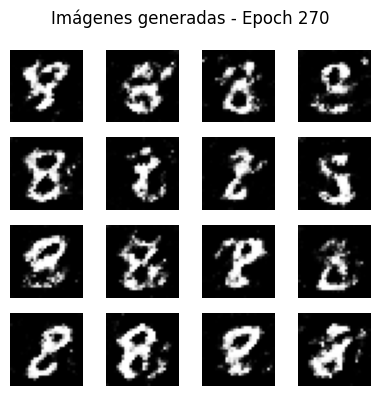

Epoch 271: D_real: 0.6650, D_fake: 0.6651, G: 1.2905
Epoch 272: D_real: 0.6654, D_fake: 0.6657, G: 1.2892
Epoch 273: D_real: 0.6660, D_fake: 0.6660, G: 1.2885
Epoch 274: D_real: 0.6667, D_fake: 0.6666, G: 1.2878
Epoch 275: D_real: 0.6668, D_fake: 0.6670, G: 1.2871
Epoch 276: D_real: 0.6674, D_fake: 0.6673, G: 1.2866
Epoch 277: D_real: 0.6676, D_fake: 0.6674, G: 1.2855
Epoch 278: D_real: 0.6679, D_fake: 0.6680, G: 1.2844
Epoch 279: D_real: 0.6683, D_fake: 0.6680, G: 1.2835
Epoch 280: D_real: 0.6684, D_fake: 0.6686, G: 1.2827
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


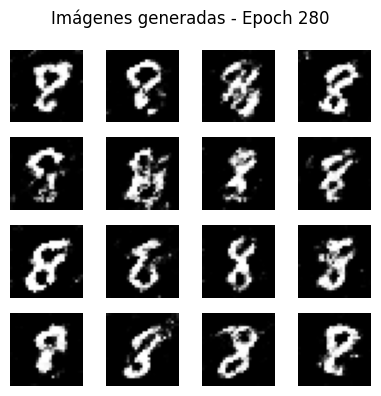

Epoch 281: D_real: 0.6688, D_fake: 0.6684, G: 1.2818
Epoch 282: D_real: 0.6688, D_fake: 0.6686, G: 1.2811
Epoch 283: D_real: 0.6689, D_fake: 0.6689, G: 1.2798
Epoch 284: D_real: 0.6693, D_fake: 0.6693, G: 1.2789
Epoch 285: D_real: 0.6694, D_fake: 0.6694, G: 1.2782
Epoch 286: D_real: 0.6699, D_fake: 0.6701, G: 1.2774
Epoch 287: D_real: 0.6704, D_fake: 0.6706, G: 1.2763
Epoch 288: D_real: 0.6710, D_fake: 0.6710, G: 1.2756
Epoch 289: D_real: 0.6716, D_fake: 0.6715, G: 1.2747
Epoch 290: D_real: 0.6720, D_fake: 0.6718, G: 1.2738
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


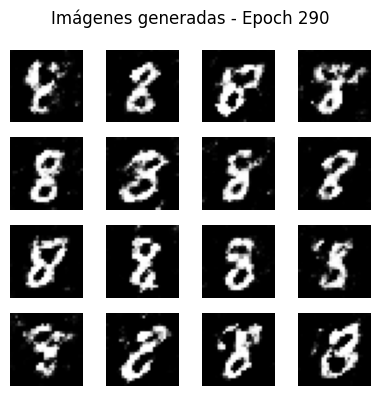

Epoch 291: D_real: 0.6721, D_fake: 0.6720, G: 1.2730
Epoch 292: D_real: 0.6723, D_fake: 0.6722, G: 1.2723
Epoch 293: D_real: 0.6727, D_fake: 0.6728, G: 1.2711
Epoch 294: D_real: 0.6732, D_fake: 0.6732, G: 1.2700
Epoch 295: D_real: 0.6737, D_fake: 0.6735, G: 1.2696
Epoch 296: D_real: 0.6739, D_fake: 0.6736, G: 1.2688
Epoch 297: D_real: 0.6738, D_fake: 0.6737, G: 1.2678
Epoch 298: D_real: 0.6739, D_fake: 0.6743, G: 1.2672
Epoch 299: D_real: 0.6747, D_fake: 0.6746, G: 1.2666
Epoch 300: D_real: 0.6752, D_fake: 0.6749, G: 1.2663
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


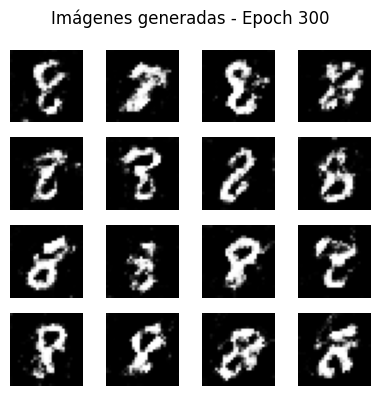

Epoch 301: D_real: 0.6751, D_fake: 0.6750, G: 1.2654
Epoch 302: D_real: 0.6753, D_fake: 0.6753, G: 1.2647
Epoch 303: D_real: 0.6756, D_fake: 0.6756, G: 1.2638
Epoch 304: D_real: 0.6759, D_fake: 0.6760, G: 1.2628
Epoch 305: D_real: 0.6763, D_fake: 0.6762, G: 1.2619
Epoch 306: D_real: 0.6766, D_fake: 0.6766, G: 1.2612
Epoch 307: D_real: 0.6770, D_fake: 0.6769, G: 1.2601
Epoch 308: D_real: 0.6774, D_fake: 0.6775, G: 1.2596
Epoch 309: D_real: 0.6776, D_fake: 0.6778, G: 1.2586
Epoch 310: D_real: 0.6782, D_fake: 0.6779, G: 1.2580
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


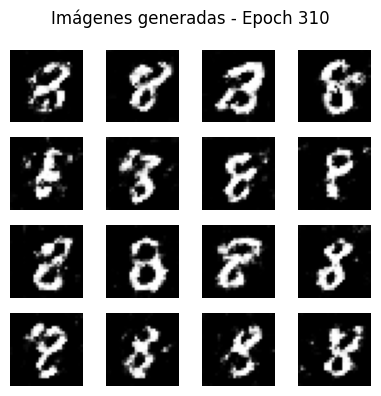

Epoch 311: D_real: 0.6781, D_fake: 0.6781, G: 1.2575
Epoch 312: D_real: 0.6783, D_fake: 0.6781, G: 1.2575
Epoch 313: D_real: 0.6783, D_fake: 0.6782, G: 1.2567
Epoch 314: D_real: 0.6783, D_fake: 0.6784, G: 1.2561
Epoch 315: D_real: 0.6786, D_fake: 0.6785, G: 1.2557
Epoch 316: D_real: 0.6787, D_fake: 0.6785, G: 1.2551
Epoch 317: D_real: 0.6789, D_fake: 0.6790, G: 1.2541
Epoch 318: D_real: 0.6795, D_fake: 0.6794, G: 1.2530
Epoch 319: D_real: 0.6795, D_fake: 0.6795, G: 1.2523
Epoch 320: D_real: 0.6800, D_fake: 0.6800, G: 1.2516
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


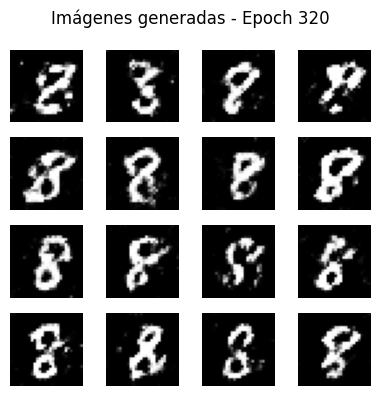

Epoch 321: D_real: 0.6805, D_fake: 0.6804, G: 1.2506
Epoch 322: D_real: 0.6805, D_fake: 0.6806, G: 1.2501
Epoch 323: D_real: 0.6810, D_fake: 0.6811, G: 1.2496
Epoch 324: D_real: 0.6813, D_fake: 0.6811, G: 1.2490
Epoch 325: D_real: 0.6815, D_fake: 0.6816, G: 1.2486
Epoch 326: D_real: 0.6819, D_fake: 0.6817, G: 1.2479
Epoch 327: D_real: 0.6822, D_fake: 0.6822, G: 1.2473
Epoch 328: D_real: 0.6825, D_fake: 0.6823, G: 1.2467
Epoch 329: D_real: 0.6823, D_fake: 0.6821, G: 1.2461
Epoch 330: D_real: 0.6821, D_fake: 0.6820, G: 1.2450
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


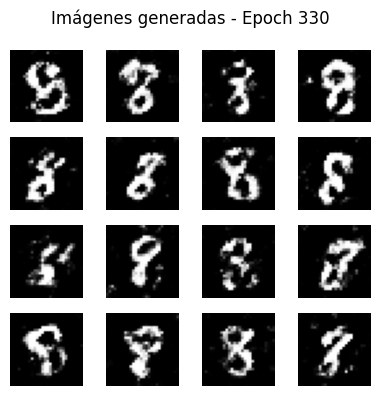

Epoch 331: D_real: 0.6822, D_fake: 0.6822, G: 1.2444
Epoch 332: D_real: 0.6825, D_fake: 0.6826, G: 1.2435
Epoch 333: D_real: 0.6828, D_fake: 0.6830, G: 1.2425
Epoch 334: D_real: 0.6832, D_fake: 0.6832, G: 1.2421
Epoch 335: D_real: 0.6836, D_fake: 0.6834, G: 1.2416
Epoch 336: D_real: 0.6836, D_fake: 0.6836, G: 1.2411
Epoch 337: D_real: 0.6841, D_fake: 0.6840, G: 1.2406
Epoch 338: D_real: 0.6844, D_fake: 0.6842, G: 1.2400
Epoch 339: D_real: 0.6844, D_fake: 0.6842, G: 1.2393
Epoch 340: D_real: 0.6846, D_fake: 0.6845, G: 1.2388
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


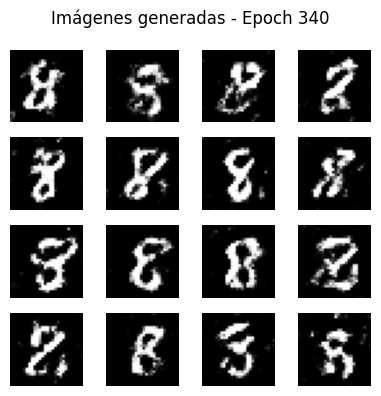

Epoch 341: D_real: 0.6847, D_fake: 0.6846, G: 1.2380
Epoch 342: D_real: 0.6848, D_fake: 0.6847, G: 1.2369
Epoch 343: D_real: 0.6847, D_fake: 0.6850, G: 1.2358
Epoch 344: D_real: 0.6853, D_fake: 0.6853, G: 1.2352
Epoch 345: D_real: 0.6859, D_fake: 0.6859, G: 1.2346
Epoch 346: D_real: 0.6861, D_fake: 0.6860, G: 1.2342
Epoch 347: D_real: 0.6864, D_fake: 0.6864, G: 1.2338
Epoch 348: D_real: 0.6867, D_fake: 0.6866, G: 1.2333
Epoch 349: D_real: 0.6868, D_fake: 0.6867, G: 1.2325
Epoch 350: D_real: 0.6870, D_fake: 0.6868, G: 1.2320
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


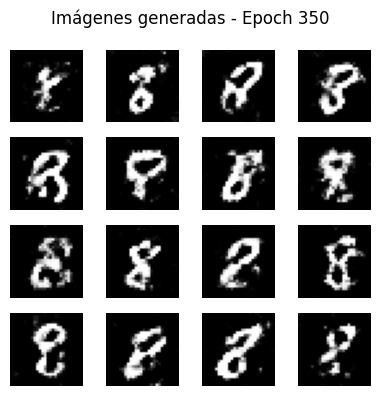

Epoch 351: D_real: 0.6870, D_fake: 0.6866, G: 1.2319
Epoch 352: D_real: 0.6868, D_fake: 0.6867, G: 1.2314
Epoch 353: D_real: 0.6867, D_fake: 0.6866, G: 1.2306
Epoch 354: D_real: 0.6867, D_fake: 0.6867, G: 1.2300
Epoch 355: D_real: 0.6868, D_fake: 0.6866, G: 1.2292
Epoch 356: D_real: 0.6870, D_fake: 0.6870, G: 1.2287
Epoch 357: D_real: 0.6872, D_fake: 0.6872, G: 1.2281
Epoch 358: D_real: 0.6873, D_fake: 0.6873, G: 1.2275
Epoch 359: D_real: 0.6874, D_fake: 0.6872, G: 1.2266
Epoch 360: D_real: 0.6874, D_fake: 0.6875, G: 1.2261
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


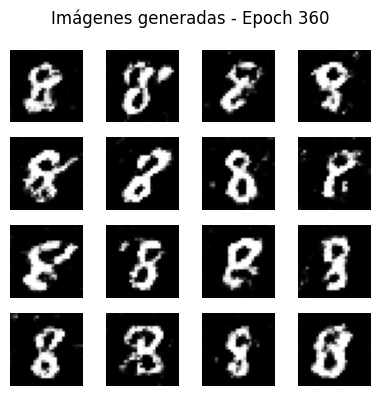

Epoch 361: D_real: 0.6878, D_fake: 0.6879, G: 1.2252
Epoch 362: D_real: 0.6881, D_fake: 0.6881, G: 1.2245
Epoch 363: D_real: 0.6883, D_fake: 0.6883, G: 1.2242
Epoch 364: D_real: 0.6887, D_fake: 0.6886, G: 1.2237
Epoch 365: D_real: 0.6888, D_fake: 0.6887, G: 1.2232
Epoch 366: D_real: 0.6891, D_fake: 0.6892, G: 1.2225
Epoch 367: D_real: 0.6894, D_fake: 0.6895, G: 1.2216
Epoch 368: D_real: 0.6898, D_fake: 0.6897, G: 1.2215
Epoch 369: D_real: 0.6899, D_fake: 0.6898, G: 1.2209
Epoch 370: D_real: 0.6903, D_fake: 0.6901, G: 1.2206
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


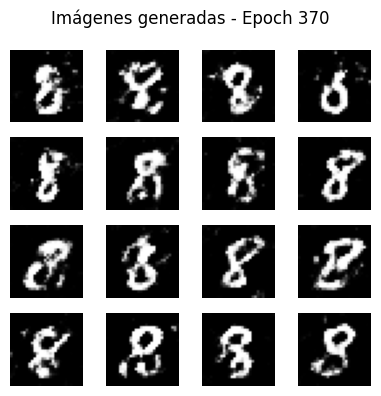

Epoch 371: D_real: 0.6903, D_fake: 0.6903, G: 1.2199
Epoch 372: D_real: 0.6906, D_fake: 0.6906, G: 1.2193
Epoch 373: D_real: 0.6907, D_fake: 0.6906, G: 1.2187
Epoch 374: D_real: 0.6906, D_fake: 0.6904, G: 1.2181
Epoch 375: D_real: 0.6907, D_fake: 0.6905, G: 1.2178
Epoch 376: D_real: 0.6906, D_fake: 0.6906, G: 1.2174
Epoch 377: D_real: 0.6908, D_fake: 0.6906, G: 1.2171
Epoch 378: D_real: 0.6907, D_fake: 0.6907, G: 1.2165
Epoch 379: D_real: 0.6910, D_fake: 0.6909, G: 1.2161
Epoch 380: D_real: 0.6912, D_fake: 0.6913, G: 1.2159
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


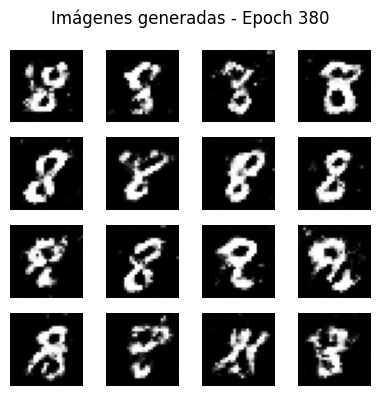

Epoch 381: D_real: 0.6917, D_fake: 0.6917, G: 1.2152
Epoch 382: D_real: 0.6921, D_fake: 0.6922, G: 1.2142
Epoch 383: D_real: 0.6924, D_fake: 0.6925, G: 1.2135
Epoch 384: D_real: 0.6927, D_fake: 0.6927, G: 1.2132
Epoch 385: D_real: 0.6931, D_fake: 0.6929, G: 1.2129
Epoch 386: D_real: 0.6932, D_fake: 0.6930, G: 1.2124
Epoch 387: D_real: 0.6932, D_fake: 0.6931, G: 1.2122
Epoch 388: D_real: 0.6934, D_fake: 0.6933, G: 1.2117
Epoch 389: D_real: 0.6934, D_fake: 0.6933, G: 1.2111
Epoch 390: D_real: 0.6935, D_fake: 0.6935, G: 1.2104
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


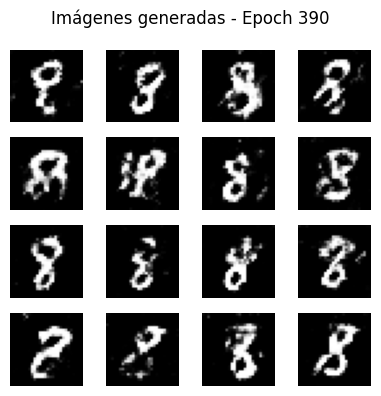

Epoch 391: D_real: 0.6937, D_fake: 0.6936, G: 1.2097
Epoch 392: D_real: 0.6939, D_fake: 0.6936, G: 1.2094
Epoch 393: D_real: 0.6937, D_fake: 0.6936, G: 1.2095
Epoch 394: D_real: 0.6937, D_fake: 0.6936, G: 1.2091
Epoch 395: D_real: 0.6937, D_fake: 0.6937, G: 1.2083
Epoch 396: D_real: 0.6939, D_fake: 0.6937, G: 1.2079
Epoch 397: D_real: 0.6938, D_fake: 0.6936, G: 1.2073
Epoch 398: D_real: 0.6937, D_fake: 0.6936, G: 1.2069
Epoch 399: D_real: 0.6938, D_fake: 0.6936, G: 1.2066
Epoch 400: D_real: 0.6939, D_fake: 0.6939, G: 1.2061
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


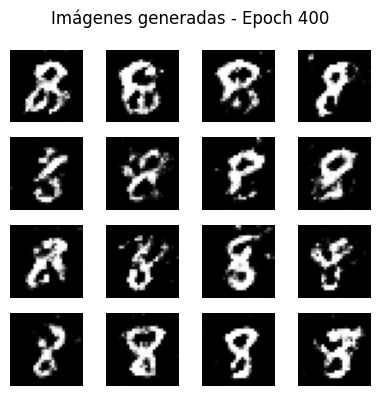

Epoch 401: D_real: 0.6940, D_fake: 0.6940, G: 1.2057
Epoch 402: D_real: 0.6942, D_fake: 0.6941, G: 1.2051
Epoch 403: D_real: 0.6943, D_fake: 0.6942, G: 1.2046
Epoch 404: D_real: 0.6942, D_fake: 0.6941, G: 1.2043
Epoch 405: D_real: 0.6942, D_fake: 0.6941, G: 1.2038
Epoch 406: D_real: 0.6941, D_fake: 0.6940, G: 1.2033
Epoch 407: D_real: 0.6942, D_fake: 0.6942, G: 1.2026
Epoch 408: D_real: 0.6944, D_fake: 0.6944, G: 1.2023
Epoch 409: D_real: 0.6947, D_fake: 0.6946, G: 1.2017
Epoch 410: D_real: 0.6949, D_fake: 0.6948, G: 1.2011
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


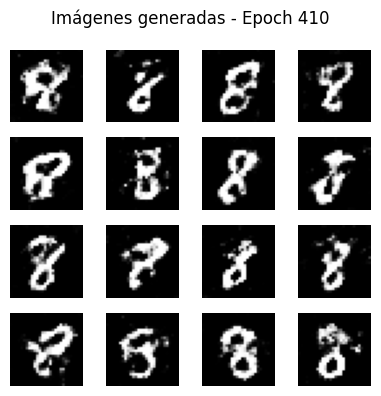

Epoch 411: D_real: 0.6950, D_fake: 0.6949, G: 1.2009
Epoch 412: D_real: 0.6949, D_fake: 0.6948, G: 1.2006
Epoch 413: D_real: 0.6949, D_fake: 0.6949, G: 1.2002
Epoch 414: D_real: 0.6950, D_fake: 0.6948, G: 1.1997
Epoch 415: D_real: 0.6950, D_fake: 0.6949, G: 1.1991
Epoch 416: D_real: 0.6951, D_fake: 0.6951, G: 1.1986
Epoch 417: D_real: 0.6953, D_fake: 0.6953, G: 1.1979
Epoch 418: D_real: 0.6957, D_fake: 0.6956, G: 1.1977
Epoch 419: D_real: 0.6958, D_fake: 0.6957, G: 1.1972
Epoch 420: D_real: 0.6958, D_fake: 0.6956, G: 1.1971
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


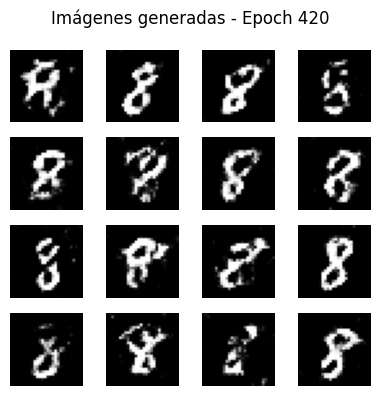

Epoch 421: D_real: 0.6957, D_fake: 0.6956, G: 1.1968
Epoch 422: D_real: 0.6957, D_fake: 0.6956, G: 1.1966
Epoch 423: D_real: 0.6955, D_fake: 0.6953, G: 1.1964
Epoch 424: D_real: 0.6952, D_fake: 0.6953, G: 1.1958
Epoch 425: D_real: 0.6956, D_fake: 0.6956, G: 1.1953
Epoch 426: D_real: 0.6960, D_fake: 0.6960, G: 1.1947
Epoch 427: D_real: 0.6963, D_fake: 0.6963, G: 1.1945
Epoch 428: D_real: 0.6965, D_fake: 0.6964, G: 1.1942
Epoch 429: D_real: 0.6967, D_fake: 0.6966, G: 1.1938
Epoch 430: D_real: 0.6968, D_fake: 0.6968, G: 1.1934
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


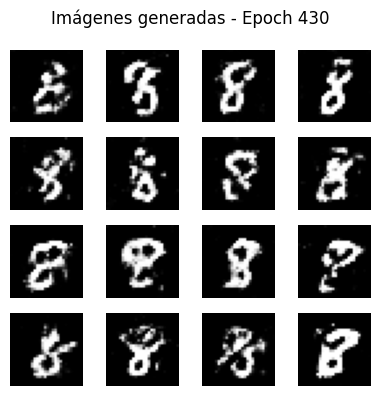

Epoch 431: D_real: 0.6970, D_fake: 0.6970, G: 1.1929
Epoch 432: D_real: 0.6972, D_fake: 0.6971, G: 1.1926
Epoch 433: D_real: 0.6975, D_fake: 0.6974, G: 1.1922
Epoch 434: D_real: 0.6974, D_fake: 0.6974, G: 1.1918
Epoch 435: D_real: 0.6975, D_fake: 0.6974, G: 1.1913
Epoch 436: D_real: 0.6976, D_fake: 0.6975, G: 1.1906
Epoch 437: D_real: 0.6977, D_fake: 0.6977, G: 1.1901
Epoch 438: D_real: 0.6980, D_fake: 0.6980, G: 1.1896
Epoch 439: D_real: 0.6981, D_fake: 0.6979, G: 1.1892
Epoch 440: D_real: 0.6981, D_fake: 0.6980, G: 1.1885
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


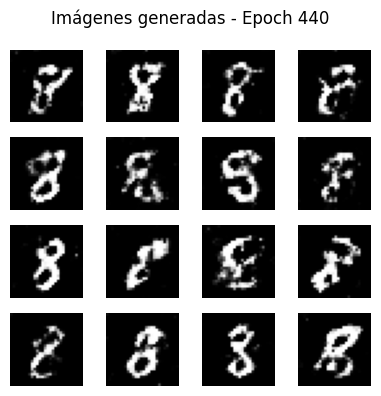

Epoch 441: D_real: 0.6982, D_fake: 0.6980, G: 1.1886
Epoch 442: D_real: 0.6981, D_fake: 0.6978, G: 1.1882
Epoch 443: D_real: 0.6979, D_fake: 0.6979, G: 1.1874
Epoch 444: D_real: 0.6978, D_fake: 0.6977, G: 1.1870
Epoch 445: D_real: 0.6978, D_fake: 0.6978, G: 1.1867
Epoch 446: D_real: 0.6980, D_fake: 0.6981, G: 1.1861
Epoch 447: D_real: 0.6985, D_fake: 0.6986, G: 1.1856
Epoch 448: D_real: 0.6987, D_fake: 0.6987, G: 1.1853
Epoch 449: D_real: 0.6991, D_fake: 0.6992, G: 1.1850
Epoch 450: D_real: 0.6995, D_fake: 0.6996, G: 1.1843
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


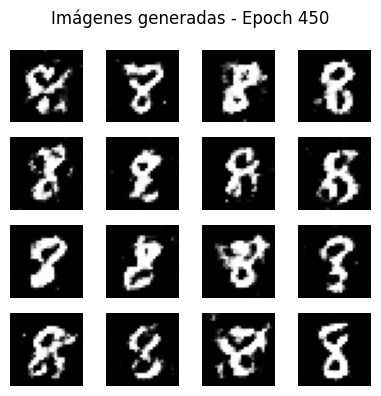

Epoch 451: D_real: 0.6997, D_fake: 0.6997, G: 1.1837
Epoch 452: D_real: 0.7000, D_fake: 0.6997, G: 1.1835
Epoch 453: D_real: 0.7000, D_fake: 0.7000, G: 1.1830
Epoch 454: D_real: 0.7001, D_fake: 0.7000, G: 1.1827
Epoch 455: D_real: 0.7001, D_fake: 0.7001, G: 1.1825
Epoch 456: D_real: 0.7003, D_fake: 0.7002, G: 1.1821
Epoch 457: D_real: 0.7004, D_fake: 0.7003, G: 1.1815
Epoch 458: D_real: 0.7004, D_fake: 0.7004, G: 1.1809
Epoch 459: D_real: 0.7005, D_fake: 0.7005, G: 1.1808
Epoch 460: D_real: 0.7005, D_fake: 0.7004, G: 1.1805
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


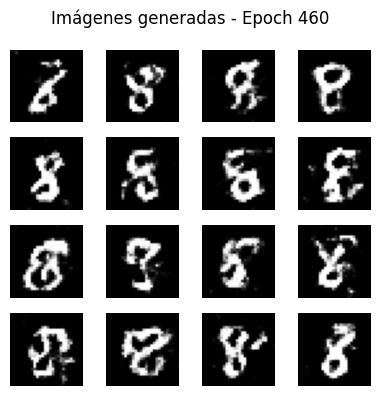

Epoch 461: D_real: 0.7005, D_fake: 0.7007, G: 1.1799
Epoch 462: D_real: 0.7008, D_fake: 0.7008, G: 1.1795
Epoch 463: D_real: 0.7010, D_fake: 0.7008, G: 1.1791
Epoch 464: D_real: 0.7010, D_fake: 0.7009, G: 1.1789
Epoch 465: D_real: 0.7011, D_fake: 0.7010, G: 1.1786
Epoch 466: D_real: 0.7011, D_fake: 0.7010, G: 1.1785
Epoch 467: D_real: 0.7010, D_fake: 0.7009, G: 1.1780
Epoch 468: D_real: 0.7011, D_fake: 0.7011, G: 1.1776
Epoch 469: D_real: 0.7012, D_fake: 0.7011, G: 1.1773
Epoch 470: D_real: 0.7013, D_fake: 0.7013, G: 1.1768
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


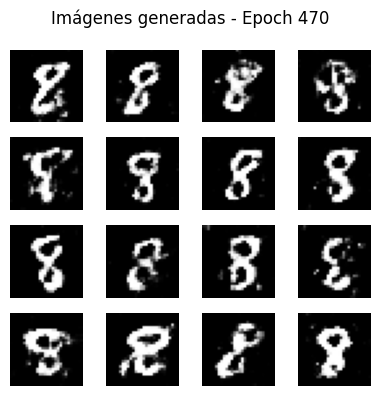

Epoch 471: D_real: 0.7015, D_fake: 0.7016, G: 1.1765
Epoch 472: D_real: 0.7018, D_fake: 0.7020, G: 1.1761
Epoch 473: D_real: 0.7020, D_fake: 0.7019, G: 1.1759
Epoch 474: D_real: 0.7022, D_fake: 0.7021, G: 1.1755
Epoch 475: D_real: 0.7024, D_fake: 0.7022, G: 1.1751
Epoch 476: D_real: 0.7025, D_fake: 0.7024, G: 1.1749
Epoch 477: D_real: 0.7026, D_fake: 0.7025, G: 1.1745
Epoch 478: D_real: 0.7026, D_fake: 0.7025, G: 1.1740
Epoch 479: D_real: 0.7028, D_fake: 0.7027, G: 1.1739
Epoch 480: D_real: 0.7029, D_fake: 0.7029, G: 1.1735
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step


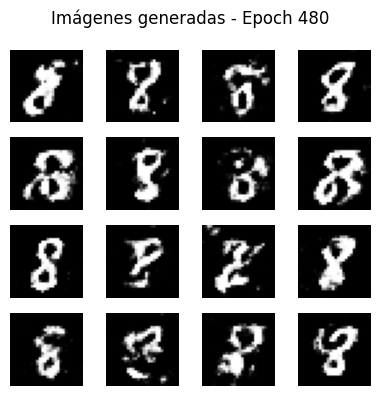

Epoch 481: D_real: 0.7029, D_fake: 0.7030, G: 1.1730
Epoch 482: D_real: 0.7032, D_fake: 0.7030, G: 1.1729
Epoch 483: D_real: 0.7033, D_fake: 0.7032, G: 1.1723
Epoch 484: D_real: 0.7034, D_fake: 0.7032, G: 1.1720
Epoch 485: D_real: 0.7034, D_fake: 0.7033, G: 1.1718
Epoch 486: D_real: 0.7034, D_fake: 0.7033, G: 1.1715
Epoch 487: D_real: 0.7033, D_fake: 0.7030, G: 1.1715
Epoch 488: D_real: 0.7031, D_fake: 0.7028, G: 1.1712
Epoch 489: D_real: 0.7028, D_fake: 0.7026, G: 1.1712
Epoch 490: D_real: 0.7026, D_fake: 0.7025, G: 1.1710
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


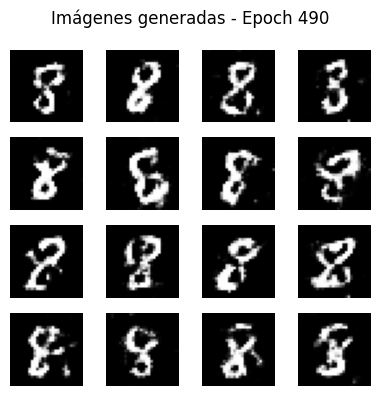

Epoch 491: D_real: 0.7026, D_fake: 0.7026, G: 1.1707
Epoch 492: D_real: 0.7026, D_fake: 0.7026, G: 1.1705
Epoch 493: D_real: 0.7026, D_fake: 0.7026, G: 1.1704
Epoch 494: D_real: 0.7027, D_fake: 0.7026, G: 1.1700
Epoch 495: D_real: 0.7028, D_fake: 0.7026, G: 1.1696
Epoch 496: D_real: 0.7027, D_fake: 0.7027, G: 1.1692
Epoch 497: D_real: 0.7028, D_fake: 0.7026, G: 1.1690
Epoch 498: D_real: 0.7026, D_fake: 0.7026, G: 1.1685
Epoch 499: D_real: 0.7027, D_fake: 0.7027, G: 1.1680
Epoch 500: D_real: 0.7028, D_fake: 0.7027, G: 1.1677
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


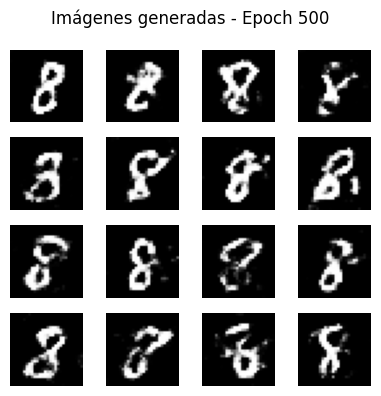

Epoch 501: D_real: 0.7030, D_fake: 0.7028, G: 1.1677
Epoch 502: D_real: 0.7029, D_fake: 0.7028, G: 1.1676
Epoch 503: D_real: 0.7029, D_fake: 0.7028, G: 1.1672
Epoch 504: D_real: 0.7028, D_fake: 0.7028, G: 1.1668
Epoch 505: D_real: 0.7030, D_fake: 0.7030, G: 1.1665
Epoch 506: D_real: 0.7031, D_fake: 0.7033, G: 1.1660
Epoch 507: D_real: 0.7034, D_fake: 0.7033, G: 1.1656
Epoch 508: D_real: 0.7035, D_fake: 0.7036, G: 1.1649
Epoch 509: D_real: 0.7039, D_fake: 0.7037, G: 1.1648
Epoch 510: D_real: 0.7040, D_fake: 0.7040, G: 1.1645
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


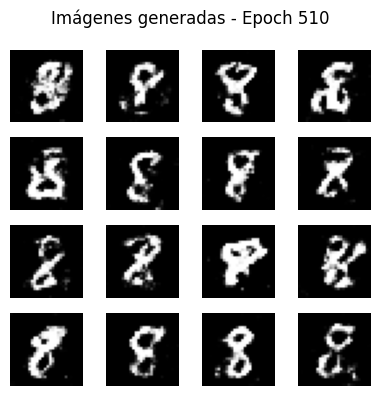

Epoch 511: D_real: 0.7040, D_fake: 0.7040, G: 1.1642
Epoch 512: D_real: 0.7042, D_fake: 0.7040, G: 1.1639
Epoch 513: D_real: 0.7043, D_fake: 0.7043, G: 1.1636
Epoch 514: D_real: 0.7044, D_fake: 0.7042, G: 1.1634
Epoch 515: D_real: 0.7042, D_fake: 0.7041, G: 1.1632
Epoch 516: D_real: 0.7041, D_fake: 0.7040, G: 1.1629
Epoch 517: D_real: 0.7042, D_fake: 0.7041, G: 1.1627
Epoch 518: D_real: 0.7044, D_fake: 0.7041, G: 1.1625
Epoch 519: D_real: 0.7042, D_fake: 0.7040, G: 1.1622
Epoch 520: D_real: 0.7040, D_fake: 0.7039, G: 1.1620
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


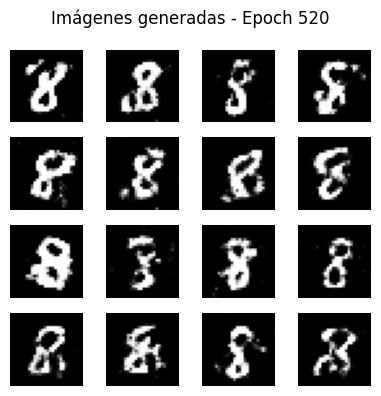

Epoch 521: D_real: 0.7040, D_fake: 0.7040, G: 1.1618
Epoch 522: D_real: 0.7040, D_fake: 0.7043, G: 1.1610
Epoch 523: D_real: 0.7042, D_fake: 0.7044, G: 1.1604
Epoch 524: D_real: 0.7046, D_fake: 0.7045, G: 1.1601
Epoch 525: D_real: 0.7048, D_fake: 0.7047, G: 1.1598
Epoch 526: D_real: 0.7049, D_fake: 0.7046, G: 1.1601
Epoch 527: D_real: 0.7046, D_fake: 0.7044, G: 1.1602
Epoch 528: D_real: 0.7044, D_fake: 0.7042, G: 1.1601
Epoch 529: D_real: 0.7042, D_fake: 0.7039, G: 1.1602
Epoch 530: D_real: 0.7041, D_fake: 0.7038, G: 1.1603
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


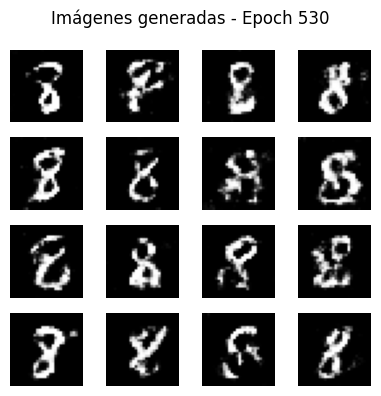

Epoch 531: D_real: 0.7037, D_fake: 0.7035, G: 1.1602
Epoch 532: D_real: 0.7035, D_fake: 0.7035, G: 1.1598
Epoch 533: D_real: 0.7035, D_fake: 0.7035, G: 1.1595
Epoch 534: D_real: 0.7035, D_fake: 0.7036, G: 1.1590
Epoch 535: D_real: 0.7037, D_fake: 0.7038, G: 1.1587
Epoch 536: D_real: 0.7038, D_fake: 0.7037, G: 1.1584
Epoch 537: D_real: 0.7039, D_fake: 0.7038, G: 1.1581
Epoch 538: D_real: 0.7039, D_fake: 0.7039, G: 1.1578
Epoch 539: D_real: 0.7040, D_fake: 0.7039, G: 1.1576
Epoch 540: D_real: 0.7044, D_fake: 0.7045, G: 1.1572
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


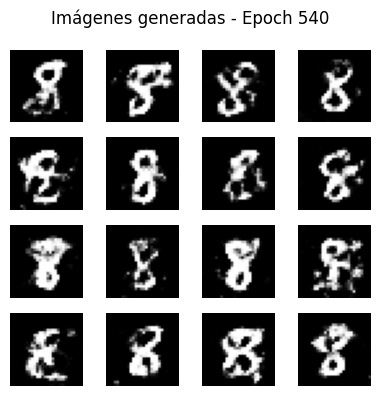

Epoch 541: D_real: 0.7045, D_fake: 0.7045, G: 1.1569
Epoch 542: D_real: 0.7046, D_fake: 0.7046, G: 1.1567
Epoch 543: D_real: 0.7047, D_fake: 0.7046, G: 1.1564
Epoch 544: D_real: 0.7048, D_fake: 0.7045, G: 1.1564
Epoch 545: D_real: 0.7047, D_fake: 0.7047, G: 1.1559
Epoch 546: D_real: 0.7048, D_fake: 0.7048, G: 1.1557
Epoch 547: D_real: 0.7048, D_fake: 0.7048, G: 1.1554
Epoch 548: D_real: 0.7049, D_fake: 0.7049, G: 1.1551
Epoch 549: D_real: 0.7051, D_fake: 0.7051, G: 1.1548
Epoch 550: D_real: 0.7052, D_fake: 0.7050, G: 1.1545
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


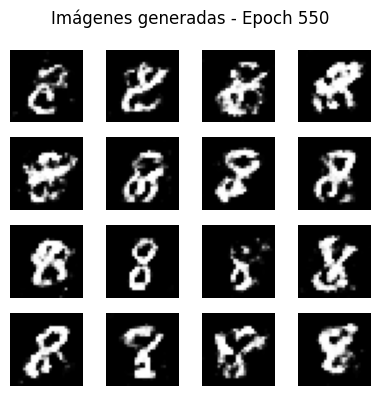

Epoch 551: D_real: 0.7053, D_fake: 0.7052, G: 1.1542
Epoch 552: D_real: 0.7053, D_fake: 0.7053, G: 1.1540
Epoch 553: D_real: 0.7054, D_fake: 0.7052, G: 1.1538
Epoch 554: D_real: 0.7052, D_fake: 0.7051, G: 1.1536
Epoch 555: D_real: 0.7052, D_fake: 0.7051, G: 1.1535
Epoch 556: D_real: 0.7050, D_fake: 0.7049, G: 1.1533
Epoch 557: D_real: 0.7051, D_fake: 0.7049, G: 1.1532
Epoch 558: D_real: 0.7050, D_fake: 0.7049, G: 1.1532
Epoch 559: D_real: 0.7049, D_fake: 0.7047, G: 1.1532
Epoch 560: D_real: 0.7048, D_fake: 0.7047, G: 1.1533
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


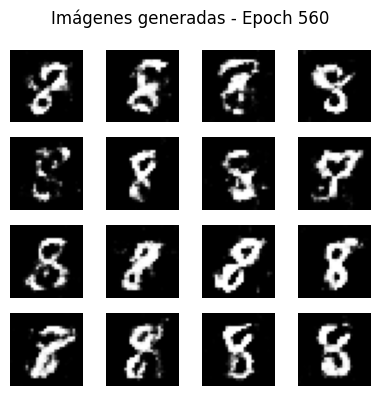

Epoch 561: D_real: 0.7047, D_fake: 0.7047, G: 1.1531
Epoch 562: D_real: 0.7048, D_fake: 0.7048, G: 1.1528
Epoch 563: D_real: 0.7049, D_fake: 0.7049, G: 1.1524
Epoch 564: D_real: 0.7050, D_fake: 0.7050, G: 1.1522
Epoch 565: D_real: 0.7050, D_fake: 0.7051, G: 1.1519
Epoch 566: D_real: 0.7054, D_fake: 0.7052, G: 1.1518
Epoch 567: D_real: 0.7054, D_fake: 0.7052, G: 1.1515
Epoch 568: D_real: 0.7053, D_fake: 0.7051, G: 1.1513
Epoch 569: D_real: 0.7051, D_fake: 0.7051, G: 1.1511
Epoch 570: D_real: 0.7054, D_fake: 0.7053, G: 1.1510
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


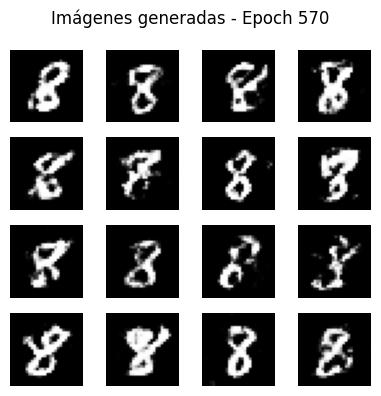

Epoch 571: D_real: 0.7056, D_fake: 0.7054, G: 1.1507
Epoch 572: D_real: 0.7055, D_fake: 0.7054, G: 1.1504
Epoch 573: D_real: 0.7055, D_fake: 0.7053, G: 1.1500
Epoch 574: D_real: 0.7053, D_fake: 0.7054, G: 1.1496
Epoch 575: D_real: 0.7053, D_fake: 0.7053, G: 1.1492
Epoch 576: D_real: 0.7054, D_fake: 0.7055, G: 1.1488
Epoch 577: D_real: 0.7057, D_fake: 0.7057, G: 1.1485
Epoch 578: D_real: 0.7058, D_fake: 0.7058, G: 1.1482
Epoch 579: D_real: 0.7060, D_fake: 0.7059, G: 1.1480
Epoch 580: D_real: 0.7062, D_fake: 0.7059, G: 1.1484
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


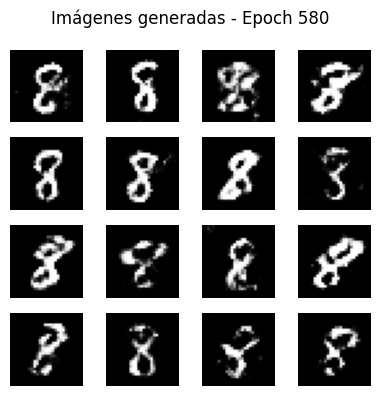

Epoch 581: D_real: 0.7060, D_fake: 0.7058, G: 1.1485
Epoch 582: D_real: 0.7058, D_fake: 0.7055, G: 1.1485
Epoch 583: D_real: 0.7056, D_fake: 0.7053, G: 1.1485
Epoch 584: D_real: 0.7054, D_fake: 0.7053, G: 1.1481
Epoch 585: D_real: 0.7052, D_fake: 0.7051, G: 1.1480
Epoch 586: D_real: 0.7053, D_fake: 0.7051, G: 1.1479
Epoch 587: D_real: 0.7051, D_fake: 0.7048, G: 1.1478
Epoch 588: D_real: 0.7048, D_fake: 0.7049, G: 1.1474
Epoch 589: D_real: 0.7049, D_fake: 0.7050, G: 1.1471
Epoch 590: D_real: 0.7051, D_fake: 0.7050, G: 1.1470
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


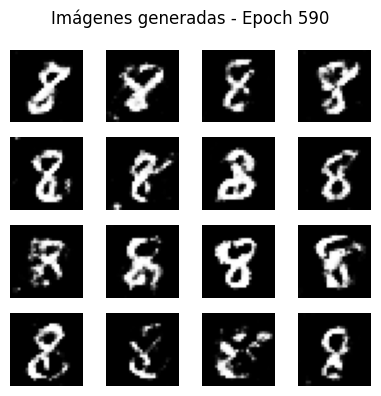

Epoch 591: D_real: 0.7050, D_fake: 0.7050, G: 1.1468
Epoch 592: D_real: 0.7052, D_fake: 0.7051, G: 1.1464
Epoch 593: D_real: 0.7053, D_fake: 0.7052, G: 1.1462
Epoch 594: D_real: 0.7052, D_fake: 0.7052, G: 1.1460
Epoch 595: D_real: 0.7053, D_fake: 0.7053, G: 1.1456
Epoch 596: D_real: 0.7053, D_fake: 0.7051, G: 1.1457
Epoch 597: D_real: 0.7052, D_fake: 0.7051, G: 1.1455
Epoch 598: D_real: 0.7052, D_fake: 0.7053, G: 1.1452
Epoch 599: D_real: 0.7054, D_fake: 0.7054, G: 1.1447
Epoch 600: D_real: 0.7056, D_fake: 0.7057, G: 1.1444
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step


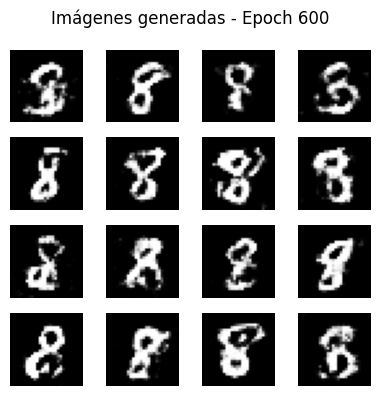

Epoch 601: D_real: 0.7059, D_fake: 0.7060, G: 1.1440
Epoch 602: D_real: 0.7062, D_fake: 0.7061, G: 1.1440
Epoch 603: D_real: 0.7064, D_fake: 0.7062, G: 1.1440
Epoch 604: D_real: 0.7063, D_fake: 0.7061, G: 1.1440
Epoch 605: D_real: 0.7062, D_fake: 0.7060, G: 1.1441
Epoch 606: D_real: 0.7060, D_fake: 0.7058, G: 1.1441
Epoch 607: D_real: 0.7058, D_fake: 0.7056, G: 1.1439
Epoch 608: D_real: 0.7056, D_fake: 0.7054, G: 1.1438
Epoch 609: D_real: 0.7054, D_fake: 0.7052, G: 1.1435
Epoch 610: D_real: 0.7052, D_fake: 0.7053, G: 1.1431
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


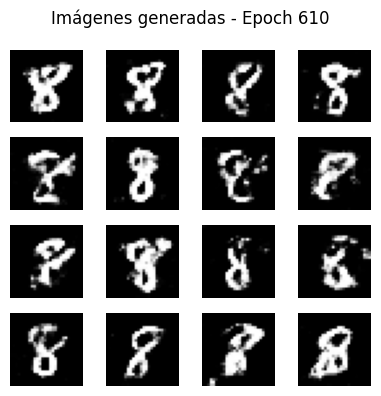

Epoch 611: D_real: 0.7052, D_fake: 0.7053, G: 1.1426
Epoch 612: D_real: 0.7052, D_fake: 0.7051, G: 1.1425
Epoch 613: D_real: 0.7053, D_fake: 0.7052, G: 1.1426
Epoch 614: D_real: 0.7054, D_fake: 0.7053, G: 1.1424
Epoch 615: D_real: 0.7054, D_fake: 0.7054, G: 1.1419
Epoch 616: D_real: 0.7056, D_fake: 0.7056, G: 1.1417
Epoch 617: D_real: 0.7056, D_fake: 0.7055, G: 1.1415
Epoch 618: D_real: 0.7056, D_fake: 0.7055, G: 1.1416
Epoch 619: D_real: 0.7057, D_fake: 0.7055, G: 1.1415
Epoch 620: D_real: 0.7055, D_fake: 0.7054, G: 1.1413
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


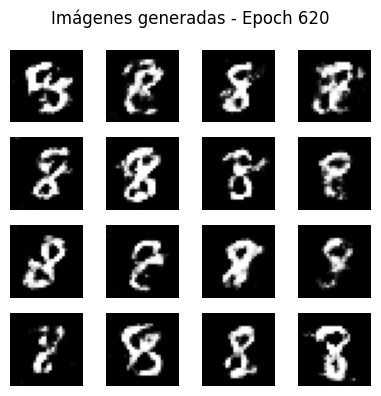

Epoch 621: D_real: 0.7054, D_fake: 0.7054, G: 1.1412
Epoch 622: D_real: 0.7053, D_fake: 0.7051, G: 1.1411
Epoch 623: D_real: 0.7052, D_fake: 0.7050, G: 1.1410
Epoch 624: D_real: 0.7052, D_fake: 0.7051, G: 1.1409
Epoch 625: D_real: 0.7051, D_fake: 0.7049, G: 1.1408
Epoch 626: D_real: 0.7049, D_fake: 0.7048, G: 1.1406
Epoch 627: D_real: 0.7049, D_fake: 0.7049, G: 1.1403
Epoch 628: D_real: 0.7049, D_fake: 0.7049, G: 1.1403
Epoch 629: D_real: 0.7049, D_fake: 0.7049, G: 1.1401
Epoch 630: D_real: 0.7050, D_fake: 0.7050, G: 1.1398
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step


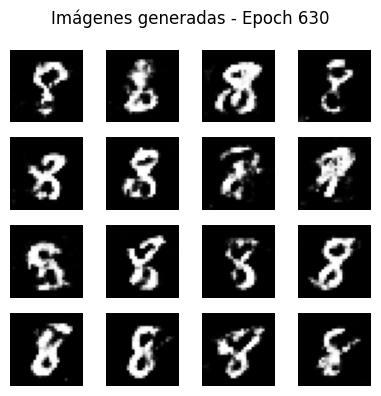

Epoch 631: D_real: 0.7052, D_fake: 0.7052, G: 1.1395
Epoch 632: D_real: 0.7053, D_fake: 0.7053, G: 1.1392
Epoch 633: D_real: 0.7054, D_fake: 0.7054, G: 1.1389
Epoch 634: D_real: 0.7055, D_fake: 0.7054, G: 1.1386
Epoch 635: D_real: 0.7056, D_fake: 0.7055, G: 1.1384
Epoch 636: D_real: 0.7056, D_fake: 0.7056, G: 1.1382
Epoch 637: D_real: 0.7058, D_fake: 0.7057, G: 1.1381
Epoch 638: D_real: 0.7058, D_fake: 0.7057, G: 1.1376
Epoch 639: D_real: 0.7059, D_fake: 0.7058, G: 1.1373
Epoch 640: D_real: 0.7061, D_fake: 0.7060, G: 1.1372
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


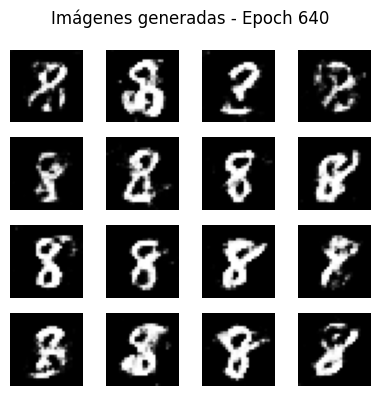

Epoch 641: D_real: 0.7063, D_fake: 0.7063, G: 1.1371
Epoch 642: D_real: 0.7064, D_fake: 0.7063, G: 1.1368
Epoch 643: D_real: 0.7064, D_fake: 0.7062, G: 1.1368
Epoch 644: D_real: 0.7063, D_fake: 0.7061, G: 1.1368
Epoch 645: D_real: 0.7062, D_fake: 0.7059, G: 1.1370
Epoch 646: D_real: 0.7060, D_fake: 0.7059, G: 1.1370
Epoch 647: D_real: 0.7060, D_fake: 0.7058, G: 1.1373
Epoch 648: D_real: 0.7057, D_fake: 0.7054, G: 1.1375
Epoch 649: D_real: 0.7055, D_fake: 0.7054, G: 1.1374
Epoch 650: D_real: 0.7053, D_fake: 0.7052, G: 1.1373
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


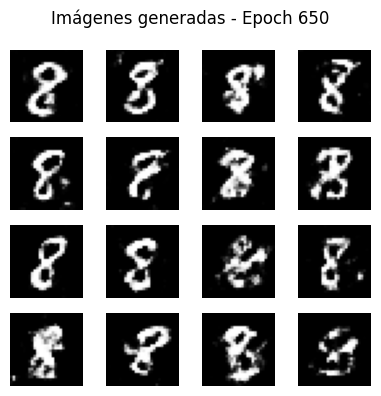

Epoch 651: D_real: 0.7051, D_fake: 0.7053, G: 1.1369
Epoch 652: D_real: 0.7052, D_fake: 0.7054, G: 1.1365
Epoch 653: D_real: 0.7055, D_fake: 0.7057, G: 1.1361
Epoch 654: D_real: 0.7057, D_fake: 0.7057, G: 1.1359
Epoch 655: D_real: 0.7059, D_fake: 0.7057, G: 1.1358
Epoch 656: D_real: 0.7059, D_fake: 0.7057, G: 1.1357
Epoch 657: D_real: 0.7058, D_fake: 0.7056, G: 1.1356
Epoch 658: D_real: 0.7058, D_fake: 0.7057, G: 1.1354
Epoch 659: D_real: 0.7059, D_fake: 0.7058, G: 1.1353
Epoch 660: D_real: 0.7058, D_fake: 0.7057, G: 1.1351
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


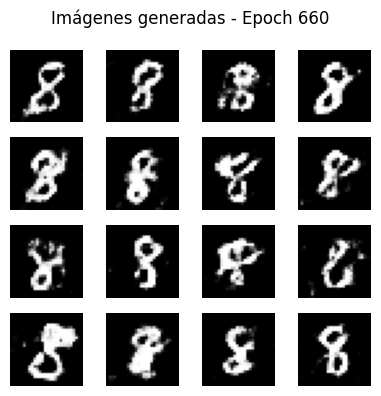

Epoch 661: D_real: 0.7058, D_fake: 0.7057, G: 1.1350
Epoch 662: D_real: 0.7057, D_fake: 0.7054, G: 1.1351
Epoch 663: D_real: 0.7056, D_fake: 0.7056, G: 1.1347
Epoch 664: D_real: 0.7056, D_fake: 0.7057, G: 1.1343
Epoch 665: D_real: 0.7058, D_fake: 0.7059, G: 1.1337
Epoch 666: D_real: 0.7060, D_fake: 0.7062, G: 1.1333
Epoch 667: D_real: 0.7066, D_fake: 0.7067, G: 1.1329
Epoch 668: D_real: 0.7068, D_fake: 0.7067, G: 1.1327


Epoch 669: D_real: 0.7069, D_fake: 0.7065, G: 1.1331
✅ Modelo guardado tras la época 669.
✅ Se generaron 4000 imágenes en 'dataset_final'


In [17]:
import os
import random
import numpy as np
import tensorflow as tf
from keras.models import Sequential, save_model, load_model
from keras.layers import Dense, Reshape, Conv2DTranspose, BatchNormalization, Conv2D, LeakyReLU, Flatten, Dropout
from keras.optimizers import Adam
from tensorflow.keras.datasets import mnist
from PIL import Image
import matplotlib.pyplot as plt

# Semillas para reproducibilidad
os.environ['TF_DETERMINISTIC_OPS'] = '1'
tf.random.set_seed(42)
np.random.seed(42)
random.seed(42)

# Parámetros
TAM_ENTRADA = 100
TAM_LOTE = 64
ERROR = 'binary_crossentropy'
LEAKY_SLOPE = 0.2
opt_d = Adam(learning_rate=0.0001, beta_1=0.5)
opt_gan = Adam(learning_rate=0.0002, beta_1=0.5)

# Función para cargar datos
def cargar_datos():
    (x_train, y_train), _ = mnist.load_data()
    idx = np.where(y_train == 8)[0]
    x_num = x_train[idx]
    x_num = np.expand_dims(x_num, axis=-1)
    x_num = (x_num.astype(np.float32) - 127.5) / 127.5
    return x_num

# Crear el generador
def crear_generador():
    modelo = Sequential()
    modelo.add(Dense(7 * 7 * 128, use_bias=False, input_shape=(TAM_ENTRADA,)))
    modelo.add(BatchNormalization(momentum=0.3))
    modelo.add(LeakyReLU(alpha=LEAKY_SLOPE))
    modelo.add(Reshape((7, 7, 128)))
    modelo.add(Conv2DTranspose(128, kernel_size=4, strides=2, padding='same', use_bias=False))
    modelo.add(BatchNormalization(momentum=0.3))
    modelo.add(LeakyReLU(alpha=LEAKY_SLOPE))
    modelo.add(Conv2DTranspose(64, kernel_size=4, strides=2, padding='same', use_bias=False))
    modelo.add(BatchNormalization(momentum=0.3))
    modelo.add(LeakyReLU(alpha=LEAKY_SLOPE))
    modelo.add(Conv2DTranspose(1, kernel_size=7, strides=1, padding='same', use_bias=False, activation='tanh'))
    return modelo

# Crear el discriminador
def crear_discriminador():
    modelo = Sequential()
    modelo.add(Conv2D(64, kernel_size=4, strides=2, padding='same', input_shape=(28, 28, 1), use_bias=False))
    modelo.add(LeakyReLU(alpha=LEAKY_SLOPE))
    modelo.add(Dropout(0.3))
    modelo.add(Conv2D(128, kernel_size=4, strides=2, padding='same', use_bias=False))
    modelo.add(BatchNormalization(momentum=0.3))
    modelo.add(LeakyReLU(alpha=LEAKY_SLOPE))
    modelo.add(Dropout(0.3))
    modelo.add(Flatten())
    modelo.add(Dense(1, activation='sigmoid', use_bias=False))
    modelo.compile(optimizer=opt_d, loss=ERROR)
    return modelo

# Crear la GAN
def crear_GAN(generador, discriminador):
    modelo = Sequential()
    discriminador.trainable = False
    modelo.add(generador)
    modelo.add(discriminador)
    modelo.compile(optimizer=opt_gan, loss=ERROR)
    return modelo

# Función para graficar imágenes generadas
def graficar_imagenes_generadas(epoch, generador, tam_lote=16):
    ruido = np.random.normal(0, 1, (tam_lote, TAM_ENTRADA))
    imagenes_generadas = generador.predict(ruido)
    imagenes_generadas = (imagenes_generadas + 1) / 2
    fig, axs = plt.subplots(4, 4, figsize=(4, 4), sharex=True, sharey=True)
    axs = axs.ravel()
    for i in range(tam_lote):
        axs[i].imshow(imagenes_generadas[i, :, :, 0], cmap='gray')
        axs[i].axis('off')
    plt.suptitle(f'Imágenes generadas - Epoch {epoch}')
    plt.tight_layout()
    plt.show()

# Función para entrenar hasta la época específica
def entrenar_gan():
    x_train = cargar_datos()
    generador = crear_generador()
    discriminador = crear_discriminador()
    gan = crear_GAN(generador, discriminador)

    for i in range(1, 670):  # Entrenar hasta Epoch 669
        ruido = np.random.normal(0, 1, (TAM_LOTE, TAM_ENTRADA))
        imagenes_falsas = generador.predict(ruido, verbose=0)
        idx = np.random.randint(0, x_train.shape[0], TAM_LOTE)
        imagenes_reales = x_train[idx]

        reales = np.ones(TAM_LOTE) * 0.9
        falsas = np.zeros(TAM_LOTE)

        discriminador.trainable = True
        d_loss_real = discriminador.train_on_batch(imagenes_reales, reales)
        d_loss_fake = discriminador.train_on_batch(imagenes_falsas, falsas)
        discriminador.trainable = False

        g_loss = gan.train_on_batch(ruido, np.ones(TAM_LOTE))

        print(f"Epoch {i}: D_real: {d_loss_real:.4f}, D_fake: {d_loss_fake:.4f}, G: {g_loss:.4f}")

        if i % 10 == 0:
            graficar_imagenes_generadas(i, generador)

    generador.save('modelo_final.h5')
    print(f"✅ Modelo guardado tras la época 669.")

# Generar imágenes con el modelo final
def generar_imagenes(num_images=4000):
    modelo_final = load_model('modelo_final.h5')
    modelo_final.trainable = False
    output_folder = 'dataset_final'
    os.makedirs(output_folder, exist_ok=True)

    for i in range(num_images):
        ruido = np.random.normal(0, 1, (1, TAM_ENTRADA))
        imagen_generada = modelo_final.predict(ruido, verbose=0)[0]
        img = ((imagen_generada + 1) * 127.5).astype(np.uint8)

        if img.shape[-1] == 1:
            img = img[:, :, 0]

        Image.fromarray(img).save(os.path.join(output_folder, f"{i:04d}.png"))

    print(f"✅ Se generaron {num_images} imágenes en '{output_folder}'")

# Ejecución
entrenar_gan()
generar_imagenes(4000)


In [18]:
import os
import zipfile

def comprimir_dataset(folder_name, output_zip):
    """
    Comprime el contenido de una carpeta en un archivo ZIP.
    :param folder_name: Nombre de la carpeta que contiene el dataset.
    :param output_zip: Nombre del archivo ZIP de salida.
    """
    with zipfile.ZipFile(output_zip, 'w', zipfile.ZIP_DEFLATED) as zipf:
        for root, dirs, files in os.walk(folder_name):
            for file in files:
                filepath = os.path.join(root, file)
                arcname = os.path.relpath(filepath, start=folder_name)
                zipf.write(filepath, arcname)
    print(f"✅ Dataset comprimido en '{output_zip}'")

# Ejemplo de uso:
folder_to_zip = 'dataset_final'  # Nombre de la carpeta que contiene las imágenes generadas
zip_filename = 'dataset_final.zip'  # Nombre del archivo ZIP resultante

comprimir_dataset(folder_to_zip, zip_filename)

✅ Dataset comprimido en 'dataset_final.zip'
